# **Comparison of Informed Neural Networks (ePINNs) and Uninformed Neural Networks (NNs)**

## **Overview**
This script implements and trains **Physics-Informed Neural Networks (PINNs)** to model a dynamical system and compares the performance of:
1. **Informed Neural Networks (ePINNs)** - incorporates known physics into the learning process.
2. **Uninformed Neural Networks (NNs)** - standard neural networks that rely purely on data without prior physical knowledge.

The comparison aims to **evaluate the accuracy and generalization** of ePINNs versus NNs in learning the underlying system dynamics.

---

## **Workflow**
### **1. Importing Dependencies**
- Loads necessary Python libraries (`TensorFlow`, `NumPy`, `Matplotlib`, `SciPy`).
- Sets the random seed for **reproducibility**.

### **2. Loading and Preprocessing Data**
- Reads noisy training data from `.npy` files.
- Splits data into **training and testing sets**.
- Converts data into **TensorFlow tensors** for efficient processing.

### **3. Defining the Neural Network Architectures**
- **`PINNIdentificationNet`**: A fully connected neural network with softplus activation to approximate system states.
- **`PINNSolver_ID`**: A solver that trains the PINN model using physics-based loss functions.

### **4. Formulating the Loss Function**
- Includes **data loss**, **physics loss** (if traning is done by ePINNs, otherwise, this loss is not inluded, i.e., w_p = 0), and **initial condition loss**.
- Uses **automatic differentiation** (`tf.GradientTape`) to compute gradients.

### **5. Training the Models**
- Uses the **Adam optimizer** for gradient descent.

### **6. Visualization and Analysis**
- Plots predictions from ePINNs and NNs against the true data.
- **Shades training and testing phases** to highlight model generalization.

---

## **Key Features**
✔ **ePINN vs. NN Comparison:** Measures the advantage of physics-informed learning.  
✔ **Efficient Optimization:** Uses `tf.function` to speed up gradient calculations.  
✔ **Comprehensive Visualization:** Tracks model performance with detailed plots.  

---

## **How to Use This Code**
1. **Run the script** to train the models and generate results.
2. Modify **hyperparameters** (number of layers, learning rate) if needed.
3. Modify **w_p** (physics loss weight) to generate results for either ePINNs or NNs case.
4. Examine **loss curves and parameter evolution** for training diagnostics.
5. Compare **ePINNs and NNs predictions** visually using the generated plots.
6. Save and analyze the **exported model predictions** for further research.

---

## **Expected Outcome**
- **ePINNs** should provide **more accurate and generalizable predictions** due to physics-informed constraints.
- **NNs** might overfit to noise or fail to extrapolate beyond training data.

This script helps **bridge physics and machine learning**, making neural networks more interpretable and reliable for modeling real-world dynamical systems.


## Import libraries

In [1]:
# Import necessary Python packages
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from time import time
from scipy.optimize import minimize
from scipy.integrate import odeint
import random

# Set TensorFlow data type
DTYPE = 'float32'
tf.keras.backend.set_floatx(DTYPE)


2025-03-05 11:54:37.820750: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


## Import data 

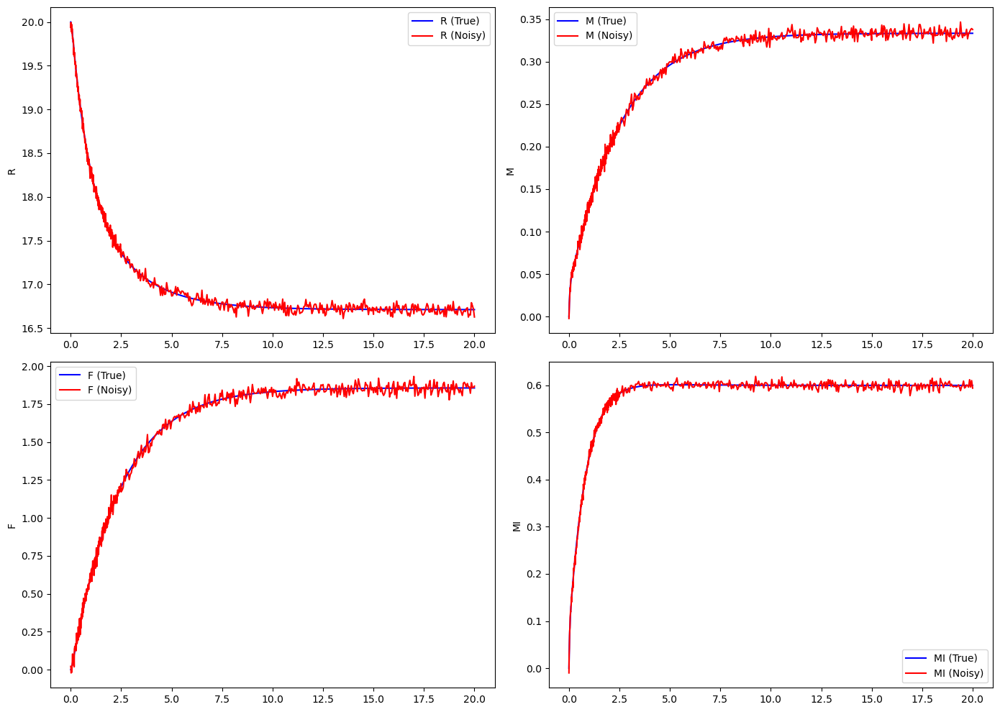

In [2]:
# Load data from files
X_data_noisy_train = tf.convert_to_tensor(np.load('X_data_noisy_train.npy'), dtype=tf.float32)
T_data_train = tf.convert_to_tensor(np.load('T_data_train.npy'), dtype=tf.float32)
x_data_noisy = np.load('x_data_noisy.npy')
x_data = np.load('x_data.npy')
t_data = np.load('t_data.npy')

# Convert time data to tensors
t_true = t_data
t_data_tf = tf.convert_to_tensor(t_data, dtype=DTYPE)
T_data = tf.reshape(t_data_tf, (-1, 1))

# Extract individual state variables
R_noisy, M_noisy, F_noisy, MI_noisy = x_data_noisy.T
R_true, M_true, F_true, MI_true = x_data.T

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(14, 10))
axs = axs.flatten()

# Define plot labels
labels = ['R', 'M', 'F', 'MI']
true_data = [R_true, M_true, F_true, MI_true]
noisy_data = [R_noisy, M_noisy, F_noisy, MI_noisy]

# Plot each state variable
for i, ax in enumerate(axs):
    ax.plot(t_true, true_data[i], label=f'{labels[i]} (True)', color='b')
    ax.plot(t_true, noisy_data[i], label=f'{labels[i]} (Noisy)', color='r')
    ax.set_ylabel(labels[i])
    ax.legend()

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


## NN1 structure

In [3]:
class PINNIdentificationNet(tf.keras.Model):
    """PINN Model Architecture."""
    
    def __init__(self, output_dim=4, num_hidden_layers=4, num_neurons_per_layer=64,
                 activation='softplus', kernel_initializer='glorot_normal', bias_initializer='zeros', **kwargs):
        super().__init__(**kwargs)
        
        # Hidden layers
        self.hidden_layers = [
            tf.keras.layers.Dense(
                units=num_neurons_per_layer,
                activation=activation,
                kernel_initializer=kernel_initializer,
                bias_initializer=bias_initializer
            ) for _ in range(num_hidden_layers)
        ]
        
        # Output layer
        self.output_layer = tf.keras.layers.Dense(
            units=output_dim,
            kernel_initializer=kernel_initializer,
            bias_initializer=bias_initializer
        )

        # True (fixed) parameters
        self.true_alpha21 = tf.Variable(3.0, trainable=False, dtype=tf.float32)
        self.true_alpha22 = tf.Variable(5.0, trainable=False, dtype=tf.float32)
        self.true_R0 = tf.Variable(20.0, trainable=False, dtype=tf.float32)
        self.true_M0 = tf.Variable(0.0, trainable=False, dtype=tf.float32)
        self.true_F0 = tf.Variable(0.0, trainable=False, dtype=tf.float32)
        self.true_Y0 = tf.Variable(0.0, trainable=False, dtype=tf.float32)
        self.true_MI0 = tf.Variable(0.0, trainable=False, dtype=tf.float32)

        # Tracking lists
        self.alpha21_list, self.alpha22_list = [], []
        self.true_alpha21_list, self.true_alpha22_list = [], []

        # Non-trainable system parameters
        self.w11 = tf.Variable(1.0, trainable=False, dtype=DTYPE)
        self.w12 = tf.Variable(3.0, trainable=False, dtype=DTYPE)
        self.w21 = tf.Variable(1.0, trainable=False, dtype=DTYPE)
        self.w22 = tf.Variable(7.0, trainable=False, dtype=DTYPE)
        self.alpha11 = tf.Variable(1.0, trainable=False, dtype=DTYPE)
        self.alpha12 = tf.Variable(3.0, trainable=False, dtype=DTYPE)
        self.alpha21 = tf.Variable(3.0, trainable=False, dtype=DTYPE)
        self.alpha22 = tf.Variable(5.0, trainable=False, dtype=DTYPE)
        self.beta2 = tf.Variable(1.0, trainable=False, dtype=DTYPE)
        self.RT = tf.Variable(20.0, trainable=False, dtype=DTYPE)
        self.QT = tf.Variable(18.0, trainable=False, dtype=DTYPE)

    def build(self, input_shape):
        """Build the model by initializing layers."""
        for layer in self.hidden_layers:
            layer.build(input_shape)
            input_shape = (input_shape[0], layer.units)  # Update shape for the next layer
        self.output_layer.build(input_shape)
        super().build(input_shape)

    def call(self, inputs):
        """Forward pass through the model."""
        x = inputs
        for layer in self.hidden_layers:
            x = layer(x)
        return self.output_layer(x)


## Define problem and solver

In [5]:
class PINNSolver_ID:
    """Solver for Physics-Informed Neural Networks (PINNs)."""
    
    def __init__(self, model, T_r):
        self.model = model
        self.t = T_r
        self.L_hist, self.L_p_hist, self.L_d_hist, self.L_IC_hist = [], [], [], []
        self.IC_hist, self.alpha21_hist, self.alpha22_hist = [], [], []
        self.iter = 0

    def get_r(self):
        """Computes residuals for the system of differential equations."""
        with tf.GradientTape(persistent=True) as tape:
            tape.watch(self.t)
            u = self.model(self.t)
            R, M, F, MI = u[:, 0:1], u[:, 1:2], u[:, 2:3], u[:, 3:4]

        R_t, M_t, F_t, MI_t = (
            tape.gradient(R, self.t),
            tape.gradient(M, self.t),
            tape.gradient(F, self.t),
            tape.gradient(MI, self.t)
        )

        return self.fun_r(R, M, F, MI, R_t, M_t, F_t, MI_t)

    def loss_fn(self, T, u, epoch):
        """Computes the loss function incorporating physics-based residuals."""
        r = self.get_r()
        L_p = tf.reduce_mean(r)

        # Compute data loss using vectorized operations
        u_pred = self.model(T)
        L_d = tf.reduce_mean(
            tf.square(u[:, 0] - tf.gather(u_pred, indices=[2], axis=1)) +
            tf.square(u[:, 1] - tf.reduce_sum(tf.gather(u_pred, indices=[1, 3], axis=1), axis=1))
        )

        # Compute initial condition loss
        u_pred_initial = self.model(T[:1, :1])
        u_initial_true = tf.convert_to_tensor([
            self.model.true_R0, self.model.true_M0,
            self.model.true_F0, self.model.true_MI0
        ], dtype=tf.float32)

        L_IC = tf.reduce_sum(tf.square(u_pred_initial - u_initial_true))

        # Loss weights
        # set w_p = 0 for uniforemd traning and w_p >0 for ePINNs-baded traning. 
        w_p, w_d, w_ic = 0.5, 1, 1
        loss = w_p * L_p + w_d * L_d + w_ic * L_IC

        return loss, L_p, L_d, L_IC

    def get_grad(self, T, u, epoch):
        """Computes gradients of the loss function with respect to model parameters."""
        with tf.GradientTape(persistent=True) as tape:
            loss, L_p, L_d, L_IC = self.loss_fn(T, u, epoch)

        trainable_vars = self.model.trainable_variables
        gradients = tape.gradient(loss, trainable_vars)
        del tape

        return loss, L_p, L_d, L_IC, gradients

    def fun_r(self, R, M, F, MI, R_t, M_t, F_t, MI_t):
        """Computes residuals for the system of ODEs."""
        result = []

        for i in range(len(R)):
            e_R = (tf.cast(R_t[i], tf.float32) + self.model.w11 * M[i] * R[i] 
                   - self.model.w12 * F[i] + self.model.w21 * MI[i] * R[i] 
                   - self.model.w22 * (self.model.RT - R[i] - F[i]))
            
            e_M = (tf.cast(M_t[i], tf.float32) - self.model.alpha11  
                   + self.model.alpha12 * M[i] + self.model.w11 * M[i] * R[i] 
                   - self.model.w12 * F[i])
            
            e_F = (tf.cast(F_t[i], tf.float32) - self.model.w11 * M[i] * R[i] 
                   + self.model.w12 * F[i])
            
            e_MI = (tf.cast(MI_t[i], tf.float32) - self.model.alpha21  
                    + self.model.alpha22 * MI[i] + self.model.w21 * MI[i] * R[i] 
                    - self.model.w22 * (self.model.RT - R[i] - F[i]))

            residual_sum = tf.square(e_R) + tf.square(e_M) + tf.square(e_F) + tf.square(e_MI)
            result.append(residual_sum)

        return tf.concat(result, axis=0)

    def solve_with_TFoptimizer(self, optimizer, T, u, N=10000, min_loss=None):
        """Performs gradient descent optimization with different learning rates for certain variables."""
    
        min_loss_value = float('inf')  # Initialize minimum loss value
        min_loss_variables = None  # Initialize variable to store minimum loss variables

        @tf.function
        def train_step(epoch):
            """Performs a single training step."""
            loss, L_p, L_d, L_IC, gradients = self.get_grad(T, u, epoch)
            optimizer.apply_gradients(zip(gradients, self.model.trainable_variables))
            return loss, L_p, L_d, L_IC

        for i in range(N):
            loss, L_p, L_d, L_IC = train_step(tf.constant(i, dtype=tf.int32))
            u_pred_initial = self.model(T[0:1, 0:1])  # Prediction for the initial state
            
            # Update tracked variables
            self.current_u_pred = self.model(self.t)
            self.current_ic = u_pred_initial.numpy()
            self.current_loss = loss.numpy()
            self.current_lossp = L_p.numpy()
            self.current_lossd = L_d.numpy()
            self.current_lossic = L_IC.numpy()
            self.current_alpha21 = self.model.alpha21.numpy()
            self.current_alpha22 = self.model.alpha22.numpy()

            # Store history
            self.L_hist.append(self.current_loss)
            self.L_p_hist.append(self.current_lossp)
            self.L_d_hist.append(self.current_lossd)
            self.L_IC_hist.append(self.current_lossic)
            self.IC_hist.append(self.current_ic)
            self.alpha21_hist.append(self.current_alpha21)
            self.alpha22_hist.append(self.current_alpha22)
            
            self.callback()

        # Return final values and history
        return (
            self.current_loss,
            [self.model.alpha21.numpy(), self.model.alpha22.numpy()],
            self.current_ic,
            self.L_hist,
            self.L_p_hist,
            self.L_d_hist,
            self.L_IC_hist,
            self.alpha21_hist,
            self.alpha22_hist
        )

    def callback(self, tr=None):
        """Callback function to log training progress and visualize intermediate results."""
        
        alpha21 = self.model.alpha21.numpy()
        self.model.alpha21_list.append(alpha21)
        
        alpha22 = self.model.alpha22.numpy()
        self.model.alpha22_list.append(alpha22)

        if self.iter % 500 == 0:
            k21_str = f'{alpha21:.4f}'
            ic_display = np.array2string(
                self.current_ic.flatten(), formatter={'float_kind': lambda x: f"{x:.2f}"}
            )
            print(f'It {self.iter:05d}: loss = {self.current_loss:.2e}, '
                  f'alpha21 = {alpha21:.4f}, alpha22 = {alpha22:.4f}')
            print(f'Initial Condition: {ic_display}')

            # Create subplots
            fig, axs = plt.subplots(2, 2, figsize=(6, 5))
            axs = axs.flatten()

            # Define labels for subplots
            labels = ['R', 'M', 'F', 'MI']
            colors = ['b', 'b', 'b', 'b']
            predictions = [
                self.current_u_pred[:, 0:1],
                self.current_u_pred[:, 1:2],
                self.current_u_pred[:, 2:3],
                self.current_u_pred[:, 3:4]
            ]

            # Plot each state variable
            for i, ax in enumerate(axs):
                ax.plot(self.t, predictions[i], label=f'{labels[i]}_t', color=colors[i])
                ax.set_ylabel(labels[i])
                ax.legend()

            # Adjust layout and show the plot
            plt.tight_layout()
            plt.show()

        self.iter += 1

    def get_solution(self, T_r, **kwargs):
        """Returns the model's predicted solution for a given input T_r."""
        t_pred = T_r
        x_pred = self.model(t_pred)
        return t_pred, x_pred


## Train the NN

It 00000: loss = 3.37e+02, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [6.66 -0.16 1.17 1.09]


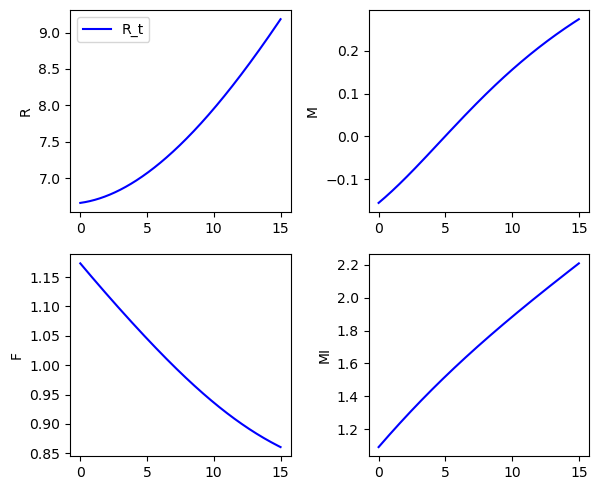

It 00500: loss = 7.49e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.01 -0.01 0.02]


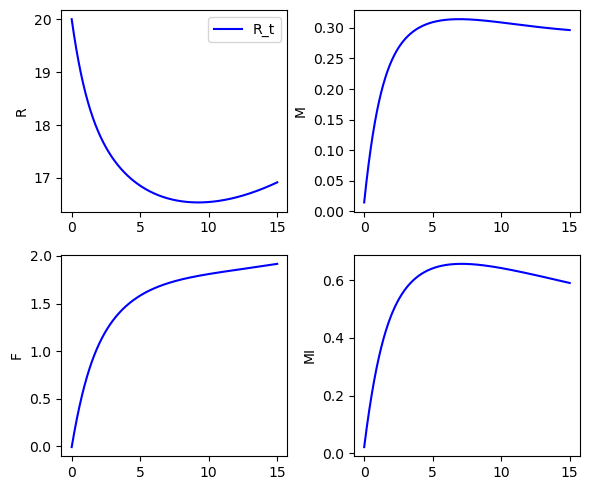

It 01000: loss = 3.62e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.01 -0.01 0.01]


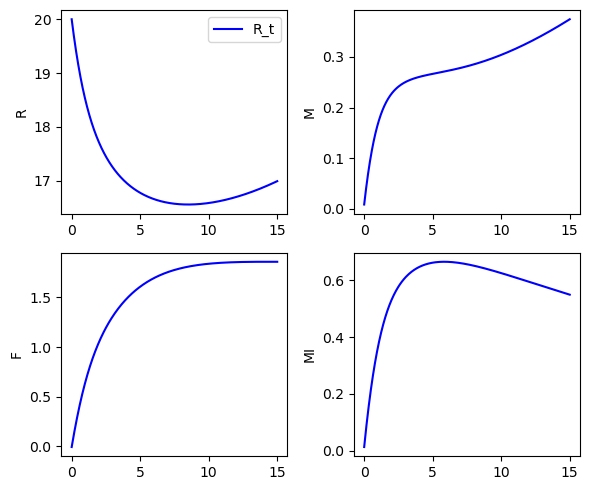

It 01500: loss = 2.42e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.01 -0.00 0.01]


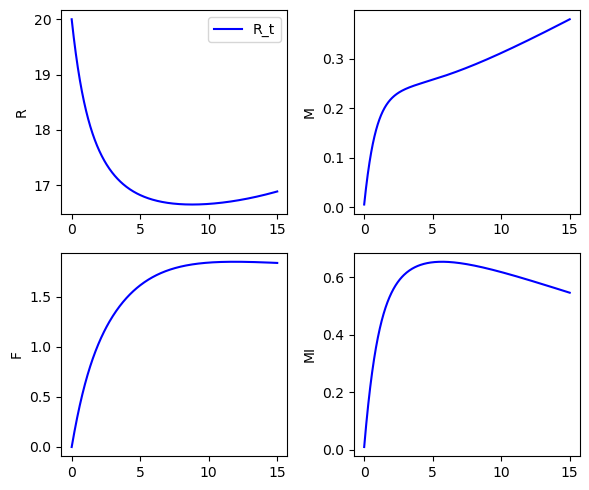

It 02000: loss = 1.85e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 0.01]


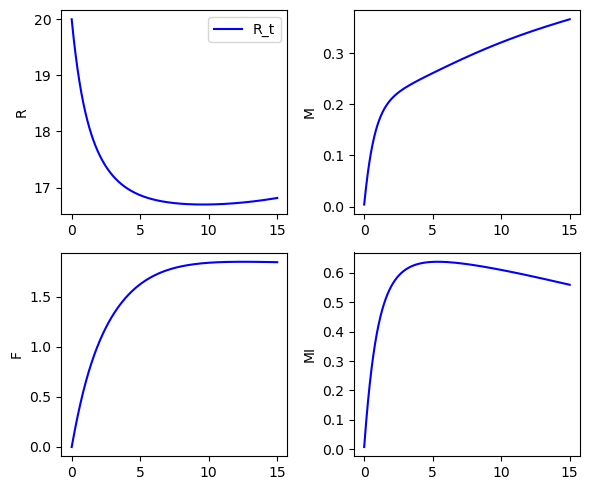

It 02500: loss = 1.73e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.01 0.00 0.01]


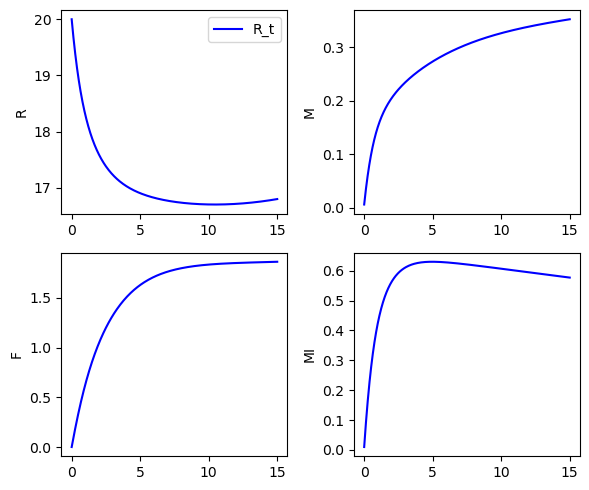

It 03000: loss = 1.49e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.01 0.00 0.01]


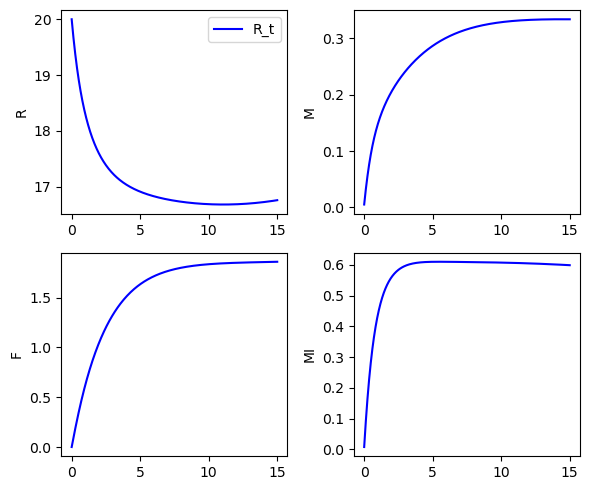

It 03500: loss = 5.40e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.02 -0.01 0.00 -0.01]


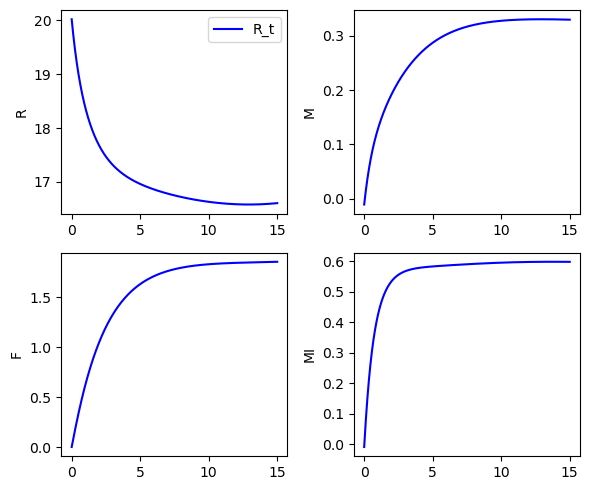

It 04000: loss = 1.26e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 0.00]


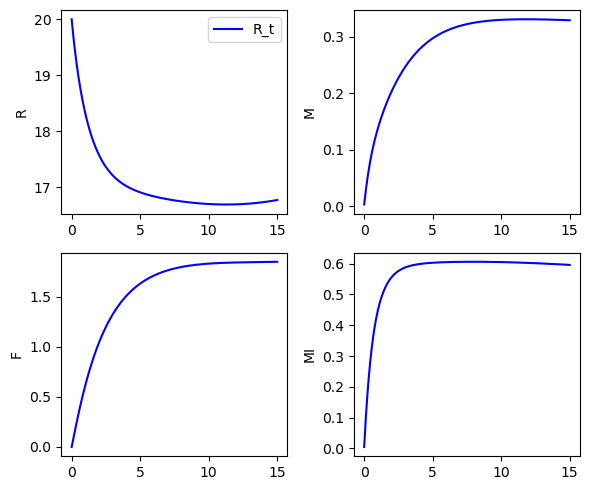

It 04500: loss = 1.10e-01, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.13 0.12 -0.01 0.15]


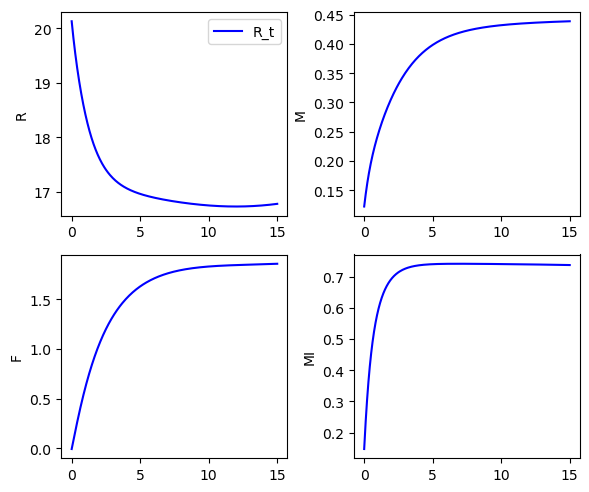

It 05000: loss = 1.82e-01, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.33 -0.01 -0.19 -0.01]


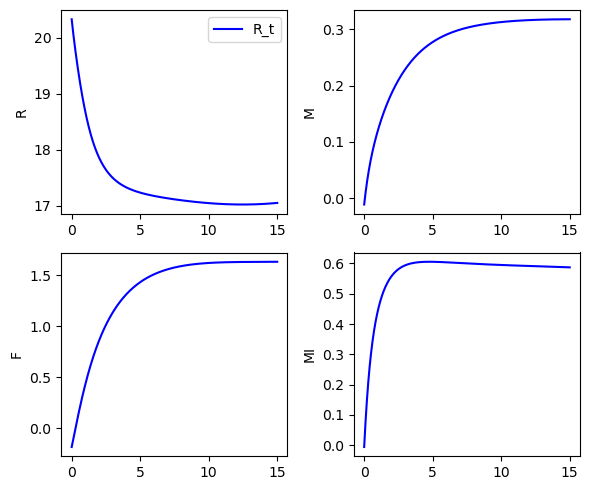

It 05500: loss = 1.19e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


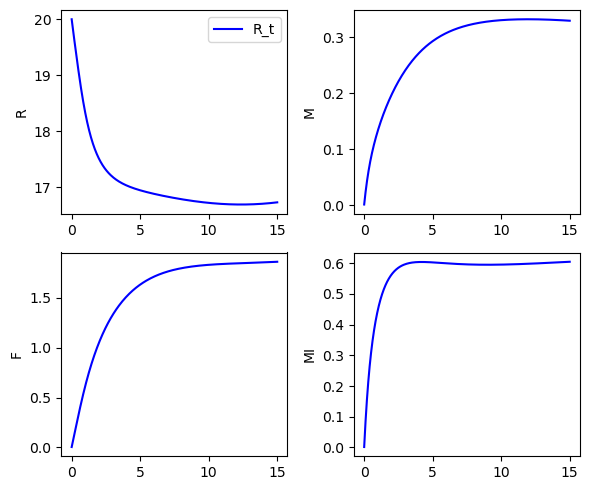

It 06000: loss = 1.15e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


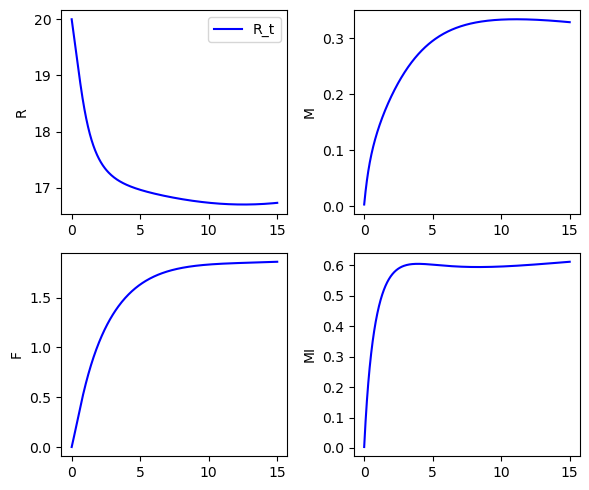

It 06500: loss = 1.09e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


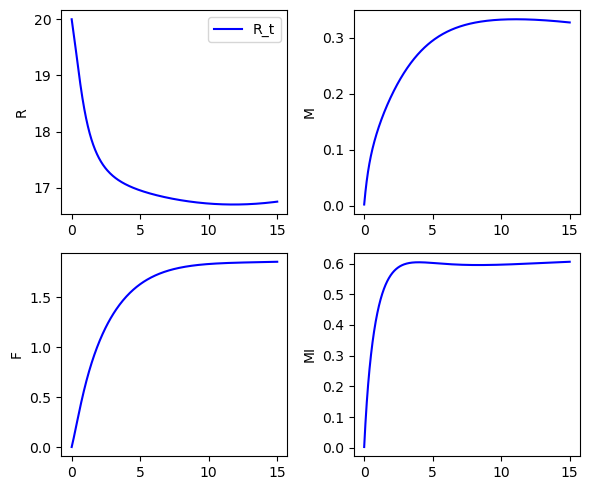

It 07000: loss = 1.83e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.02 -0.01 -0.01 -0.01]


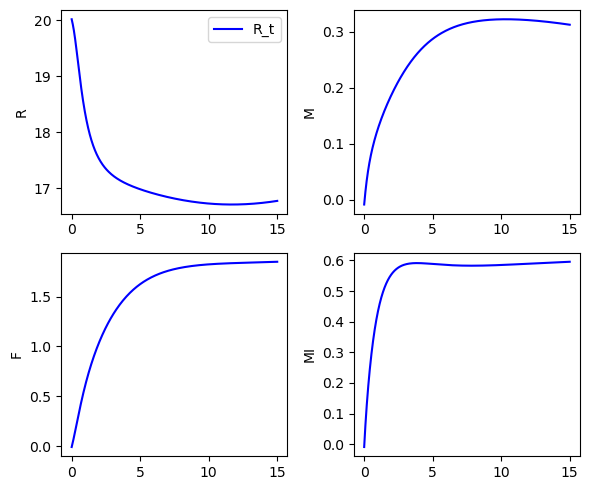

It 07500: loss = 1.18e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 0.00]


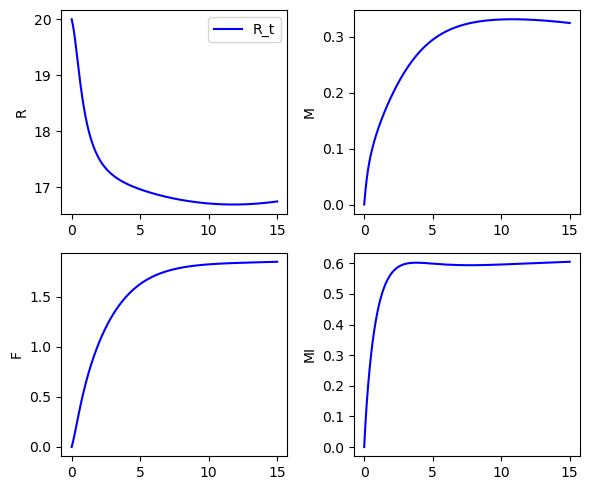

It 08000: loss = 1.13e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


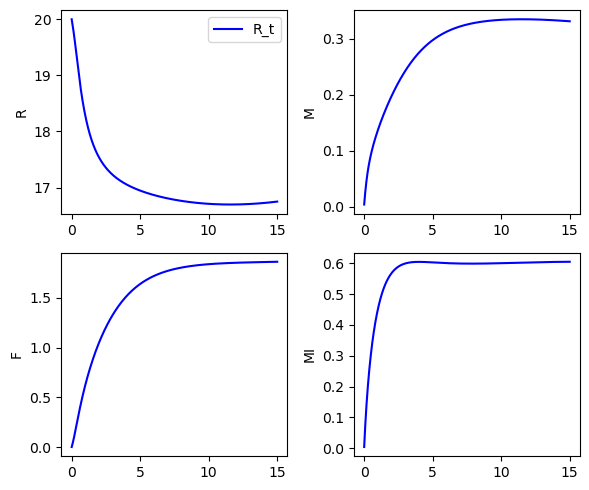

It 08500: loss = 1.23e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.01 -0.01 0.01]


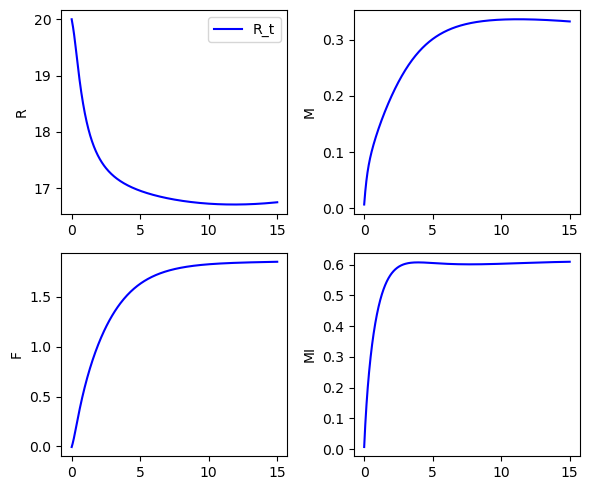

It 09000: loss = 9.98e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


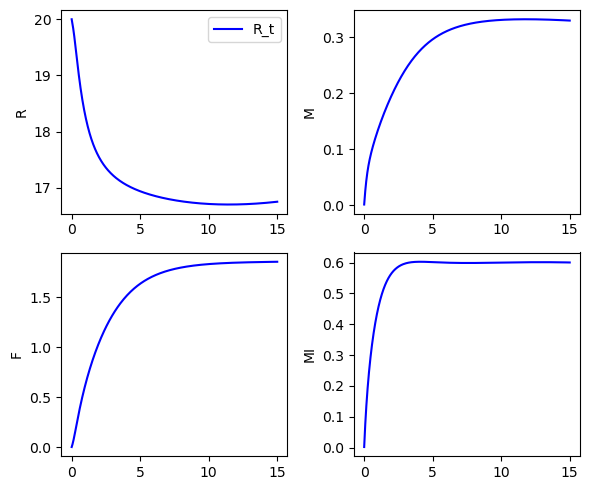

It 09500: loss = 2.78e-02, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.95 -0.03 -0.05 -0.03]


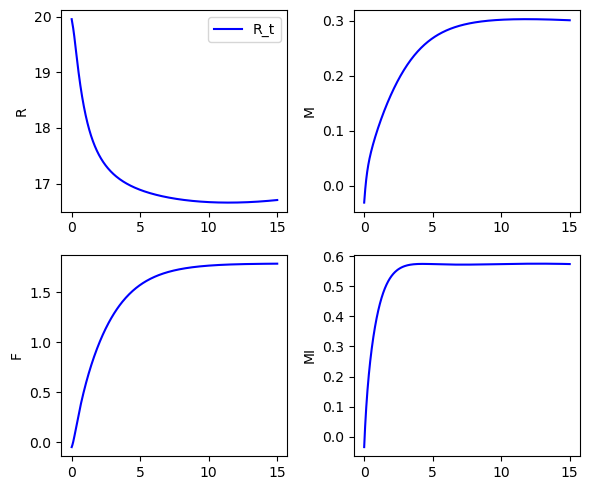

It 10000: loss = 1.22e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 -0.00 -0.00 -0.00]


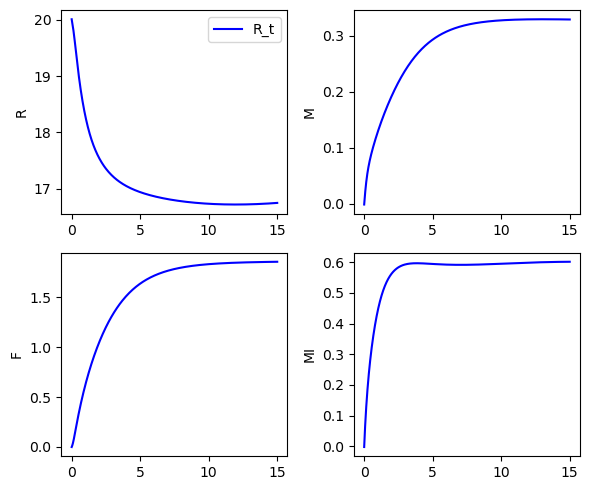

It 10500: loss = 2.14e-02, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.98 -0.03 -0.03 -0.04]


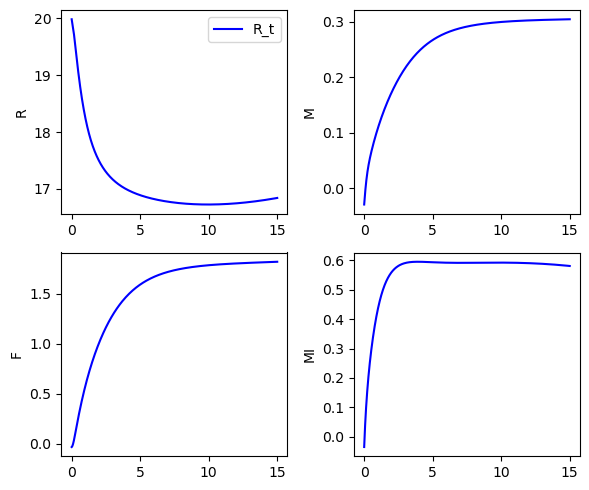

It 11000: loss = 9.38e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 0.00]


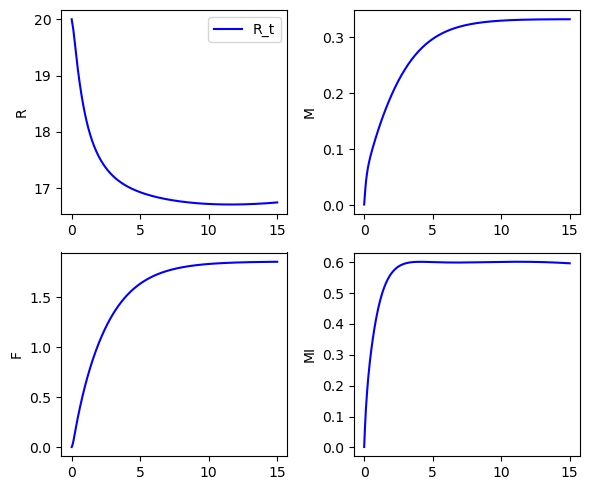

It 11500: loss = 9.29e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


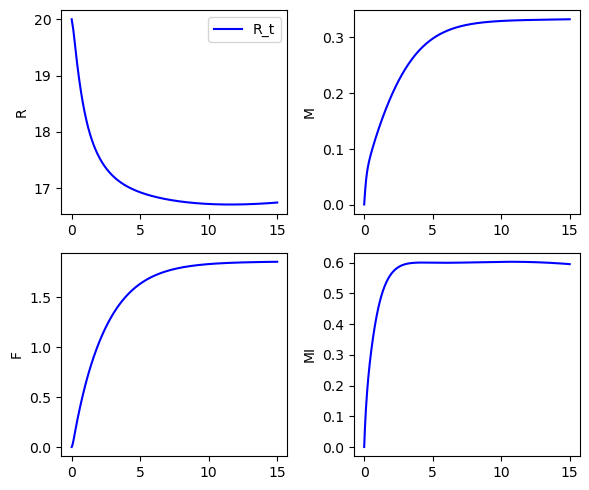

It 12000: loss = 1.42e-02, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.91 -0.02 0.01 -0.02]


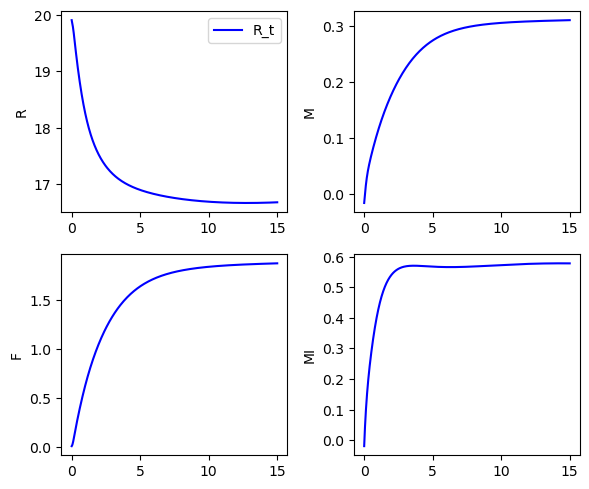

It 12500: loss = 9.11e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


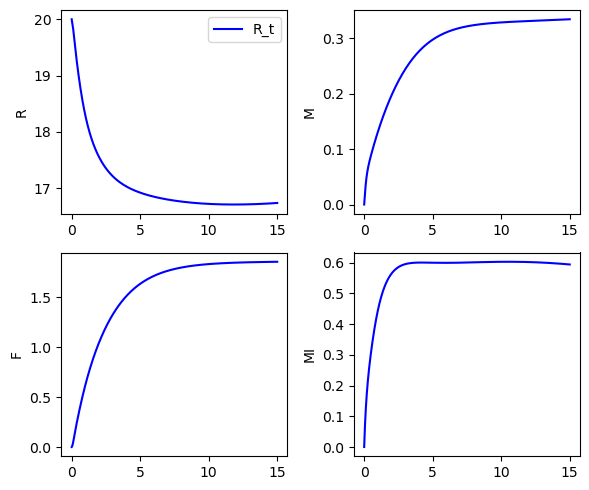

It 13000: loss = 9.01e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


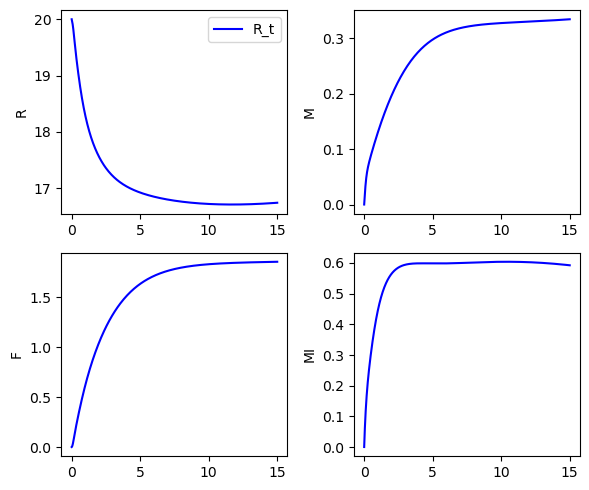

It 13500: loss = 3.16e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.95 -0.01 -0.02 -0.01]


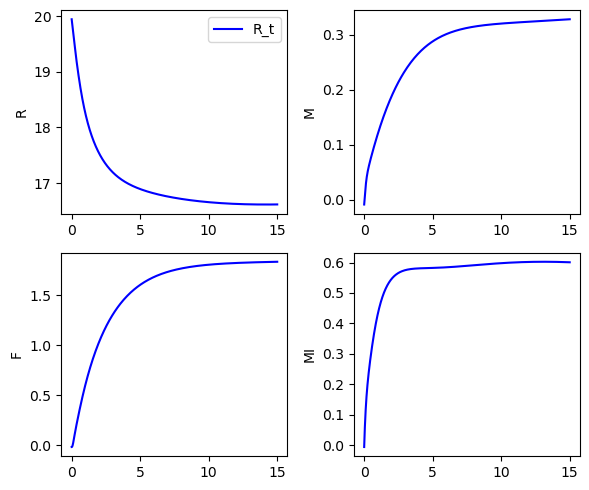

It 14000: loss = 1.01e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


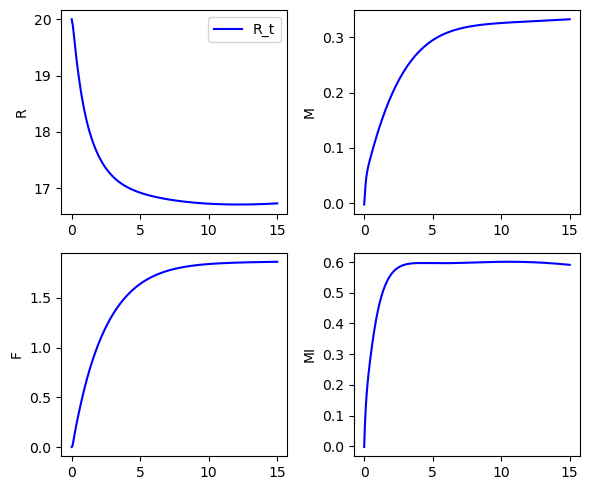

It 14500: loss = 4.14e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.03 -0.01 -0.01 -0.01]


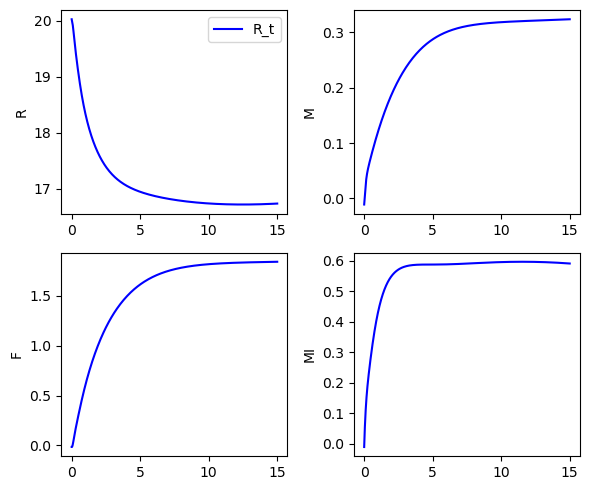

It 15000: loss = 2.92e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.03 -0.00 0.01 -0.00]


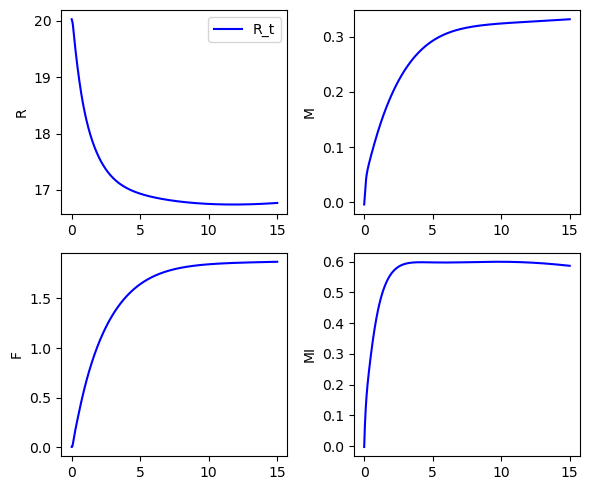

It 15500: loss = 8.80e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


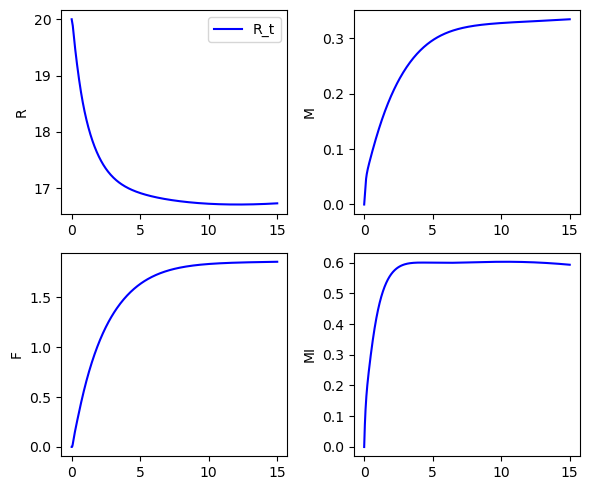

It 16000: loss = 9.91e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


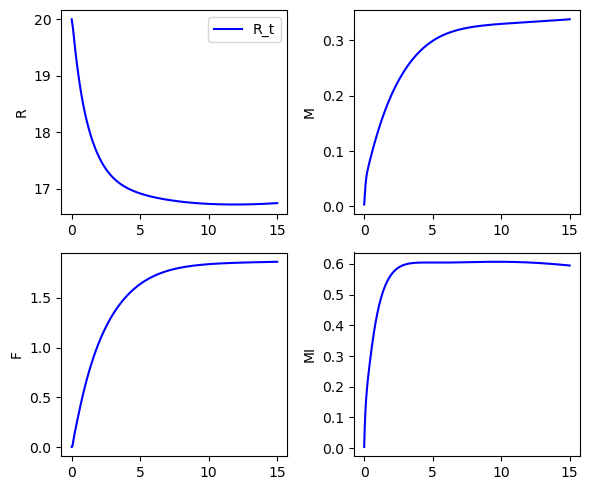

It 16500: loss = 2.96e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.02 0.01 0.00 0.01]


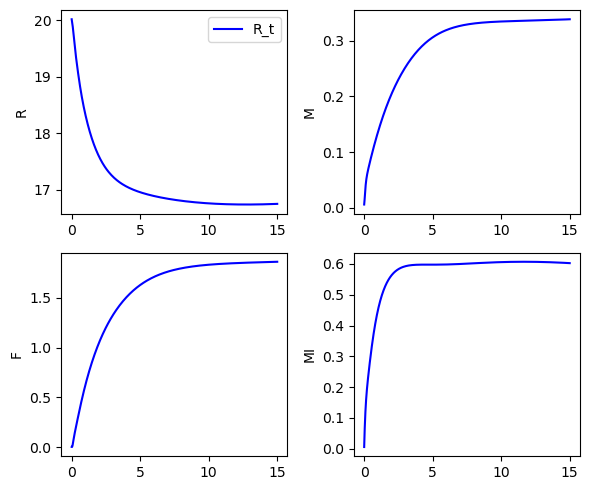

It 17000: loss = 1.13e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.01 0.01 0.01]


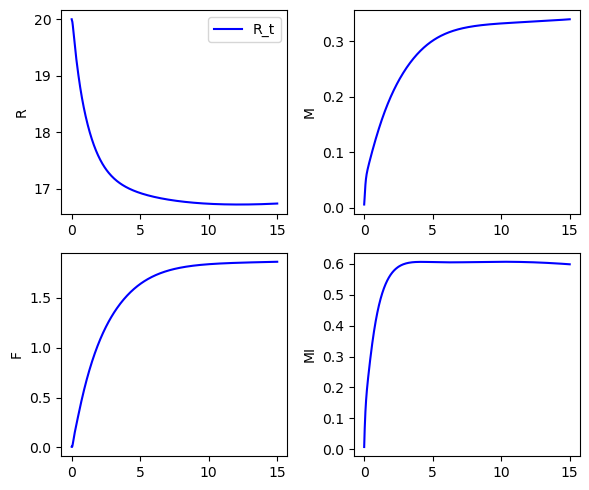

It 17500: loss = 1.14e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.02 0.00 0.00 0.00]


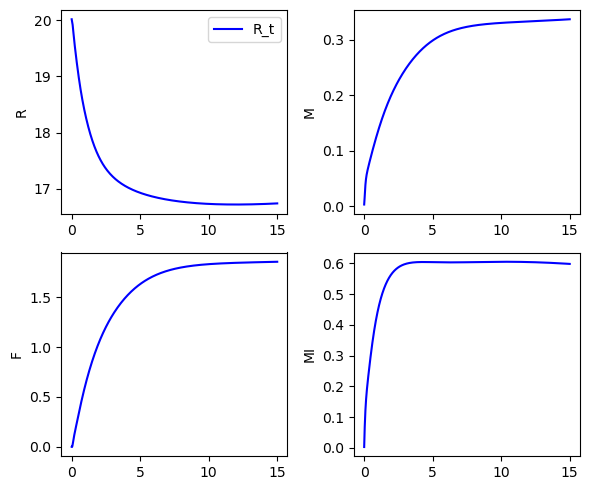

It 18000: loss = 1.08e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


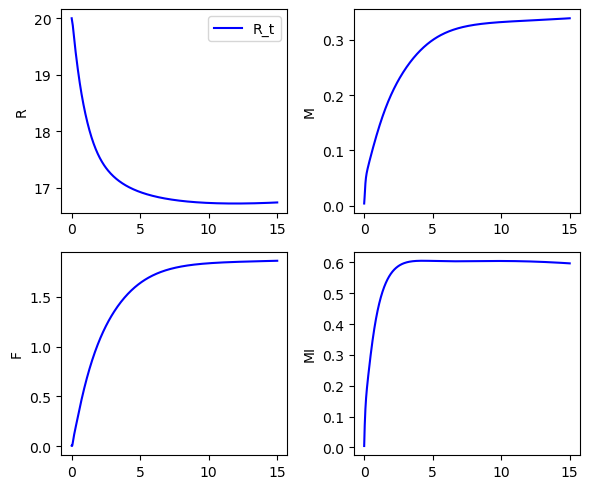

It 18500: loss = 8.64e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 0.00]


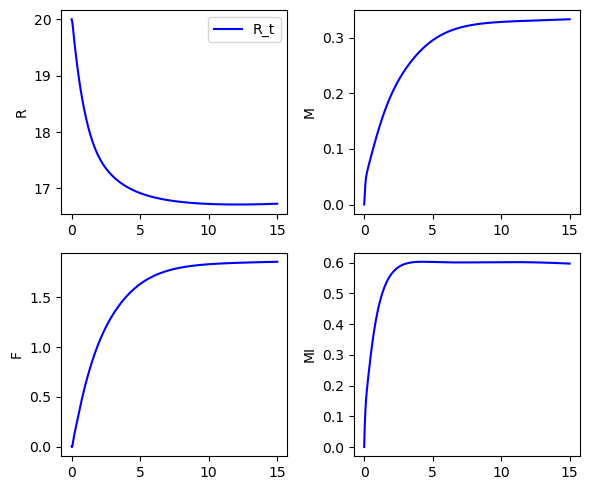

It 19000: loss = 1.67e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.01 -0.00 -0.01]


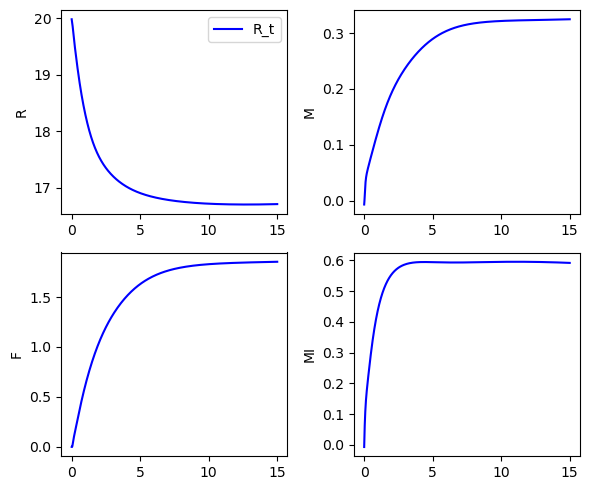

It 19500: loss = 1.43e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.98 -0.01 -0.00 -0.01]


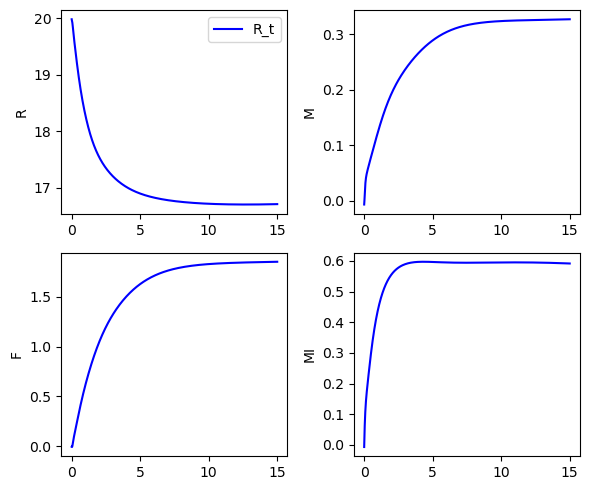

It 20000: loss = 6.17e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.94 -0.02 -0.01 -0.02]


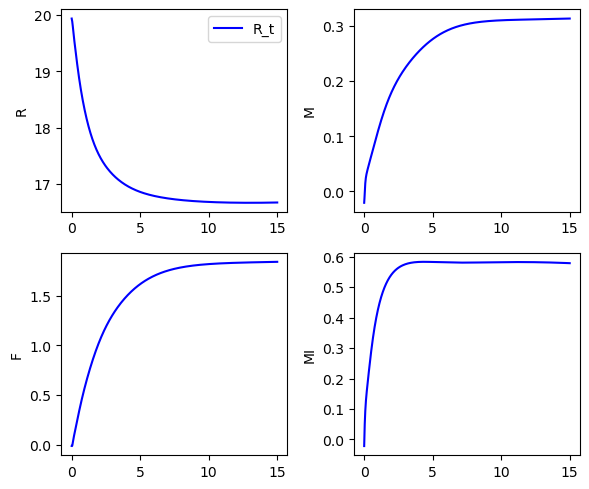

It 20500: loss = 1.62e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.03 0.01 0.00 0.01]


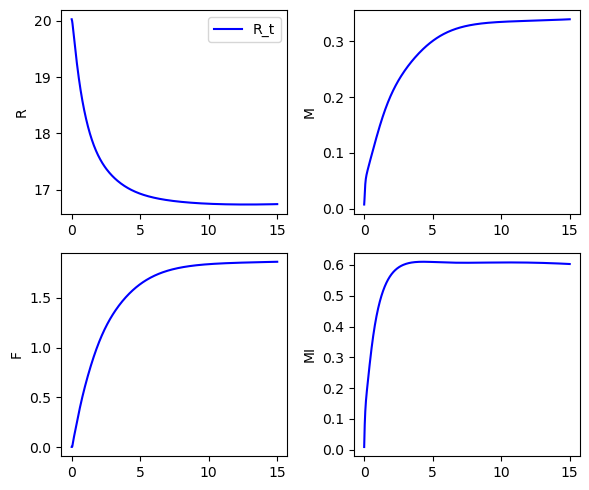

It 21000: loss = 1.02e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


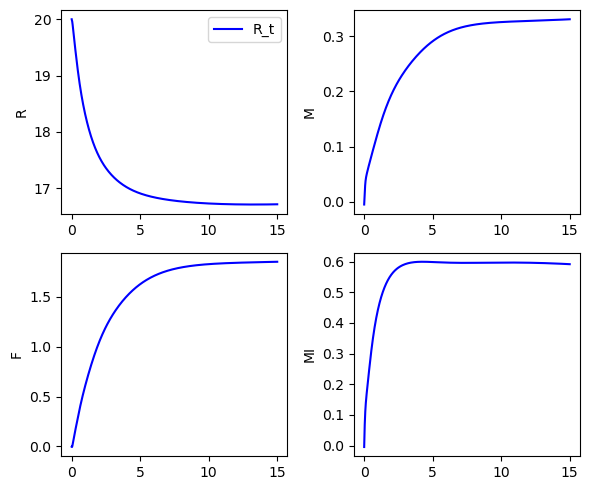

It 21500: loss = 1.00e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.01]


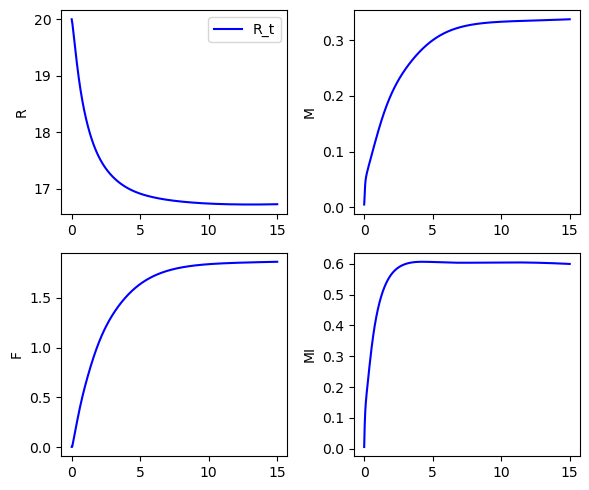

It 22000: loss = 7.24e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.07 0.02 0.01 0.02]


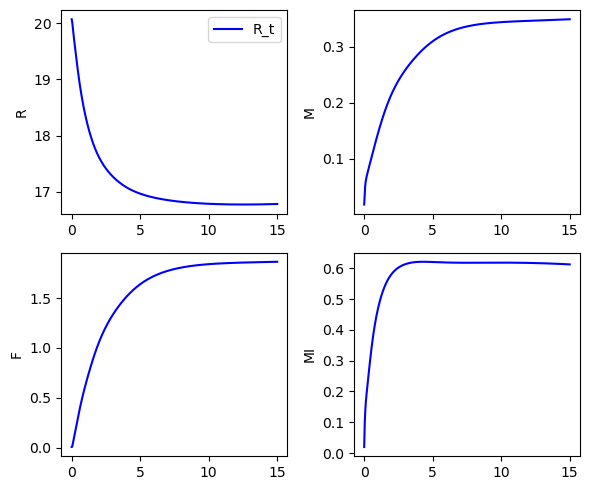

It 22500: loss = 8.47e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 0.00]


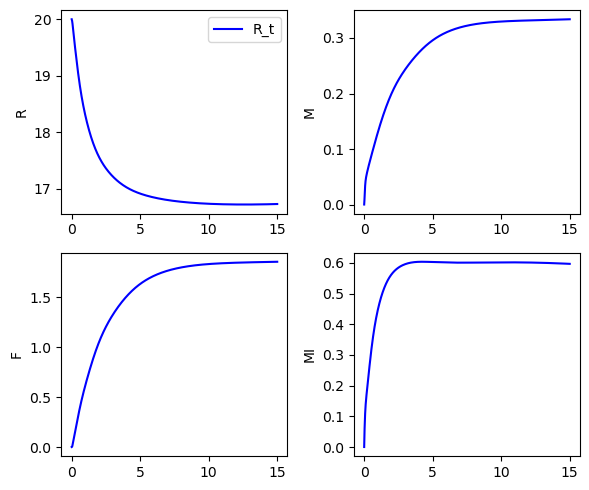

It 23000: loss = 8.45e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 0.00]


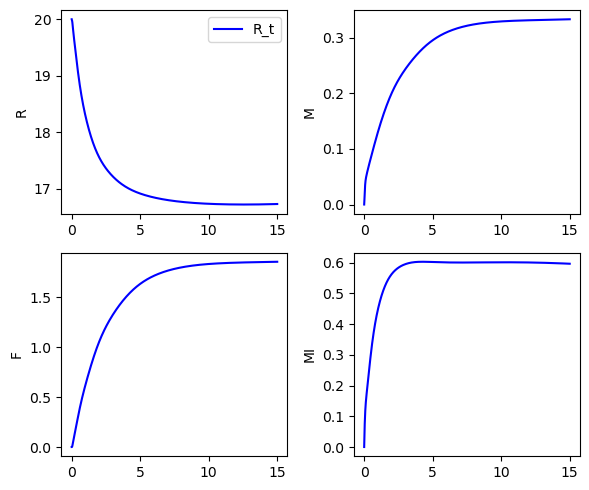

It 23500: loss = 1.30e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.00 -0.01 -0.00]


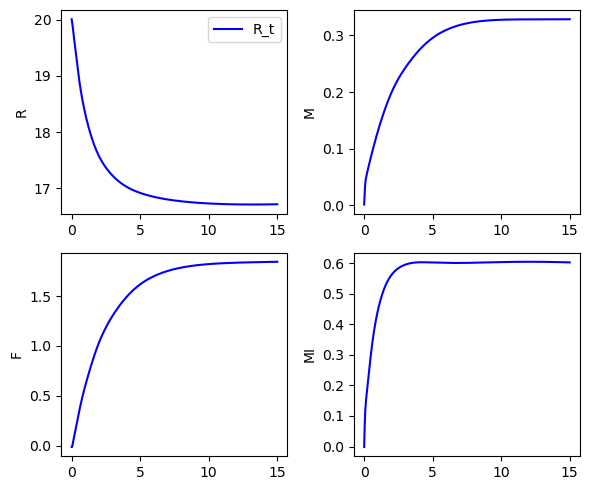

It 24000: loss = 8.53e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


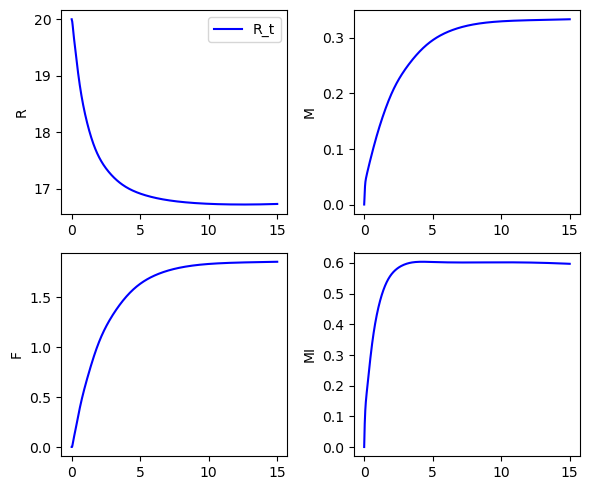

It 24500: loss = 8.43e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 0.00]


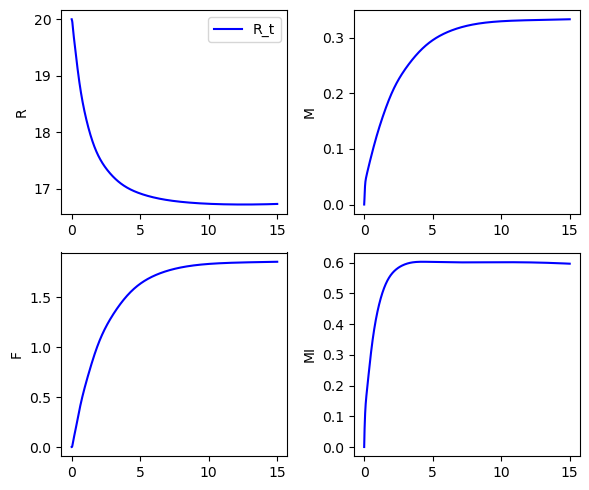

It 25000: loss = 4.82e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.03 0.01 0.02 0.01]


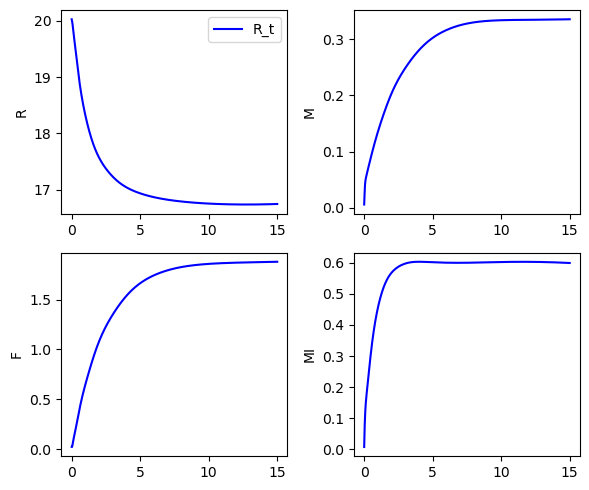

It 25500: loss = 8.55e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


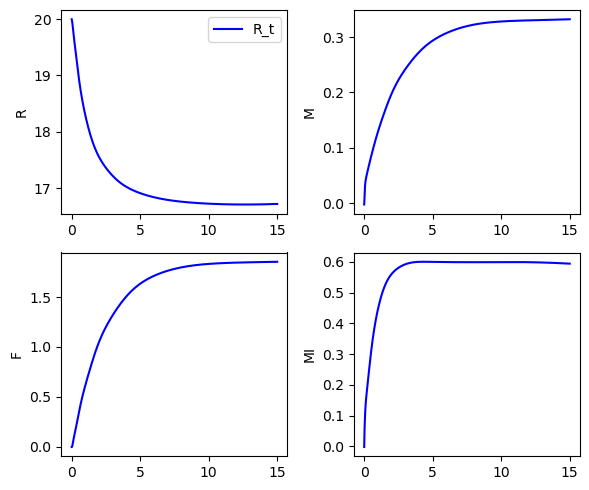

It 26000: loss = 4.46e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.03 0.02 0.02 0.02]


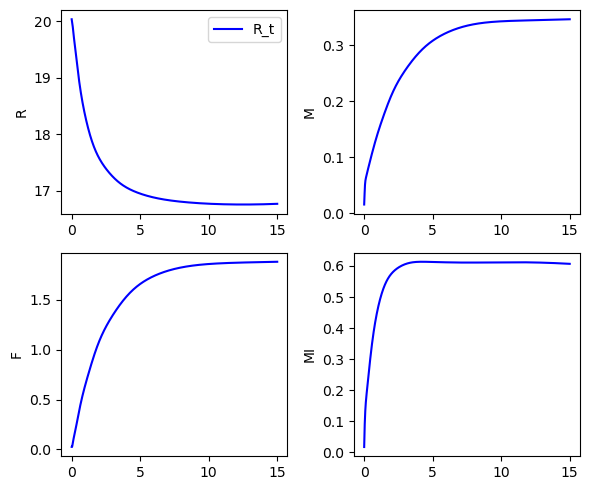

It 26500: loss = 8.44e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


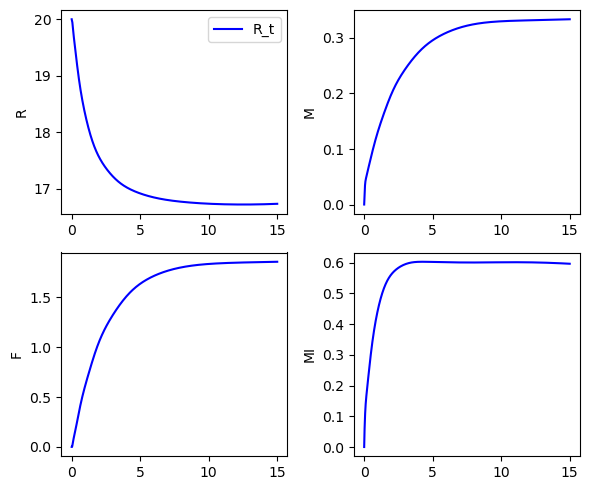

It 27000: loss = 8.47e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 0.00]


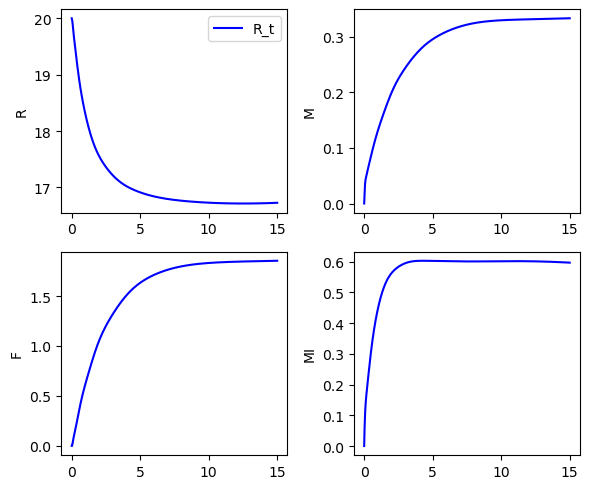

It 27500: loss = 6.54e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.04 0.02 0.02 0.03]


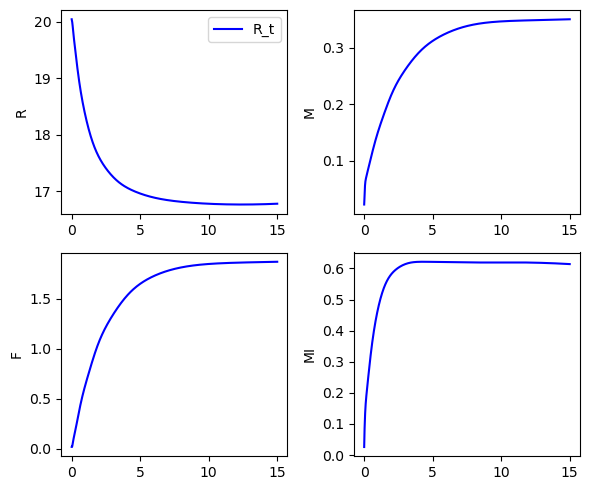

It 28000: loss = 8.71e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.00 0.00 0.00]


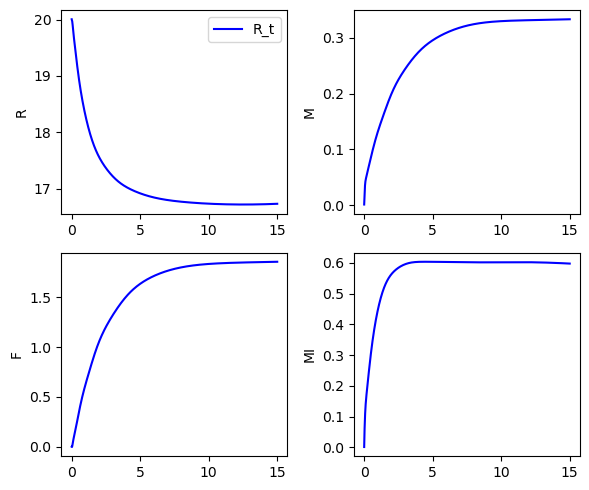

It 28500: loss = 8.78e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


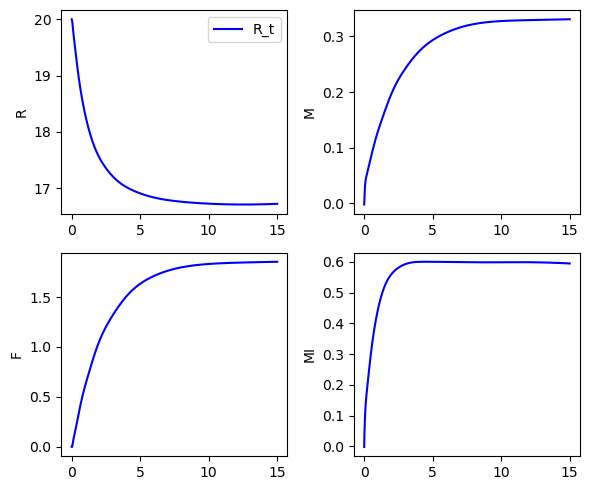

It 29000: loss = 8.42e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 0.00]


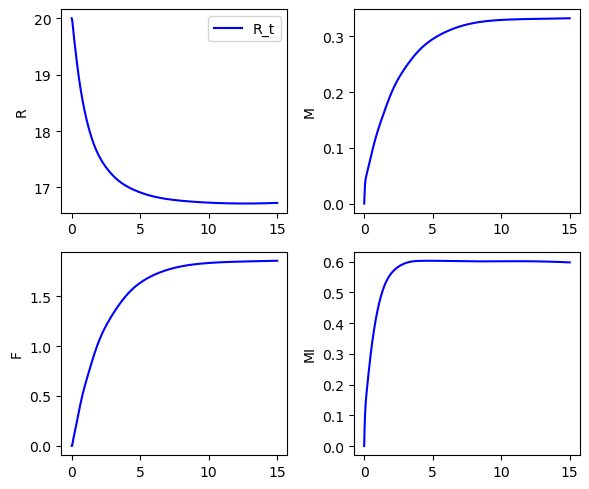

It 29500: loss = 1.21e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.01 0.00]


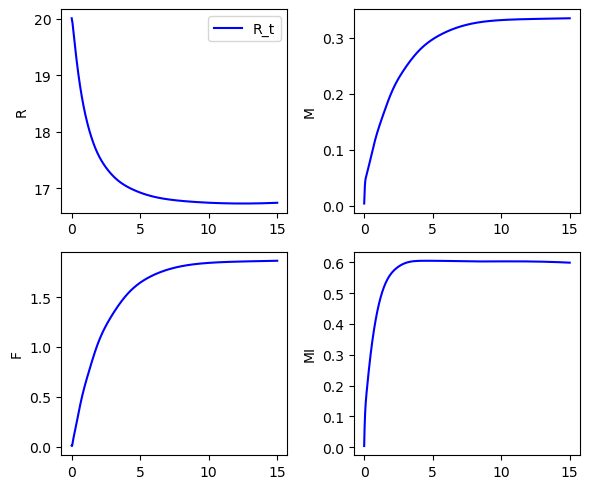

It 30000: loss = 1.53e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.01 0.00]


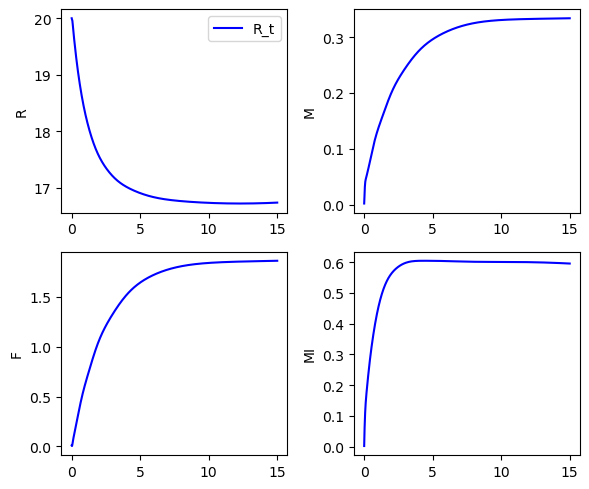

It 30500: loss = 8.41e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


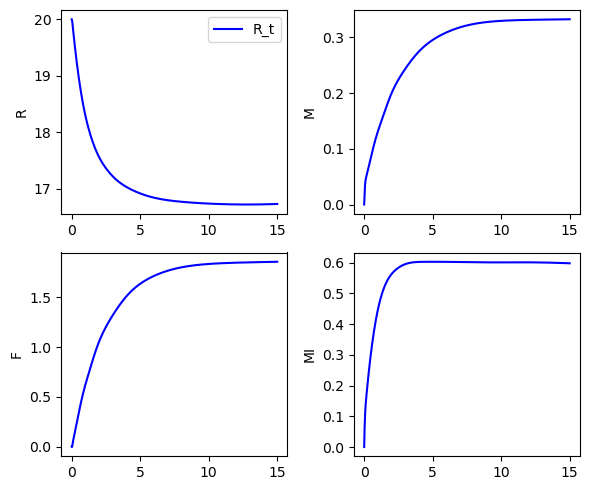

It 31000: loss = 8.75e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


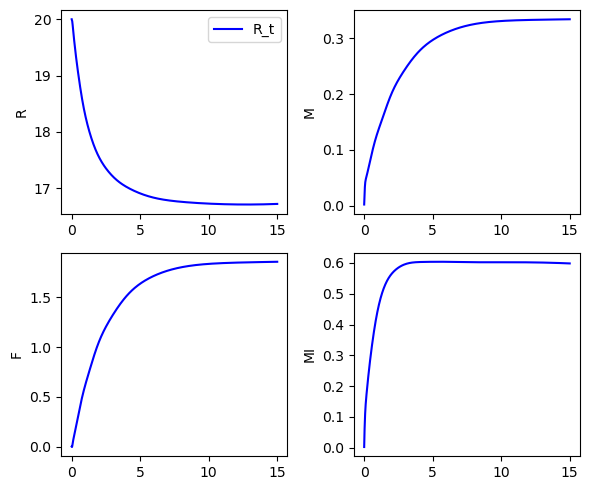

It 31500: loss = 1.00e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


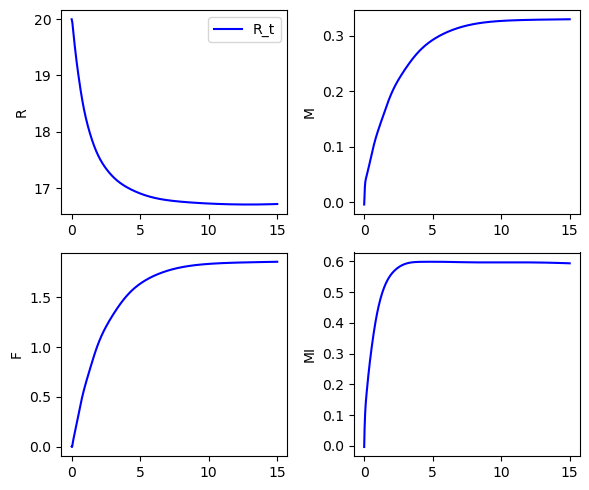

It 32000: loss = 8.47e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 -0.00]


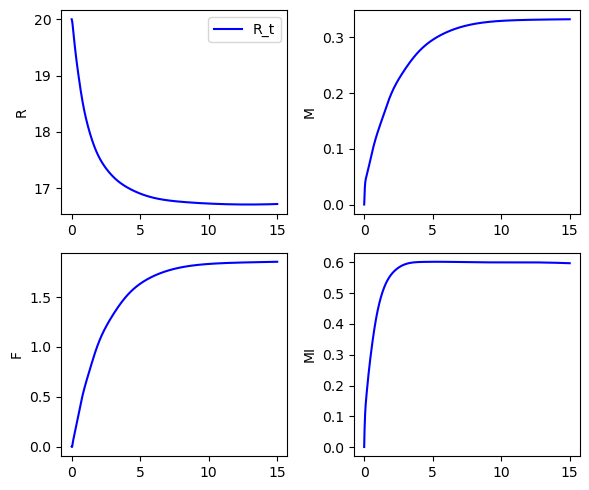

It 32500: loss = 5.96e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.01 0.03 0.01]


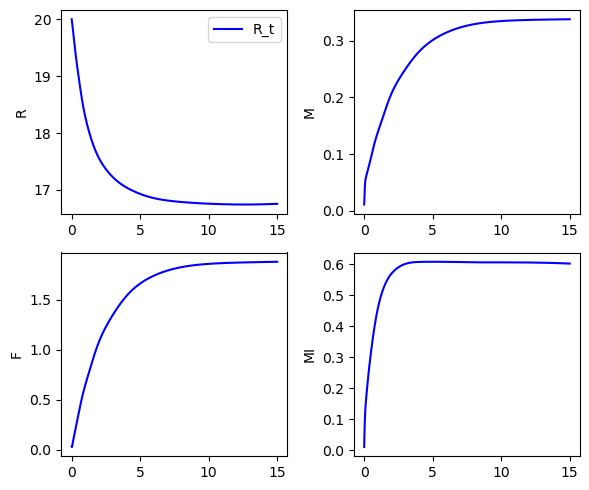

It 33000: loss = 3.22e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.96 -0.02 -0.01 -0.02]


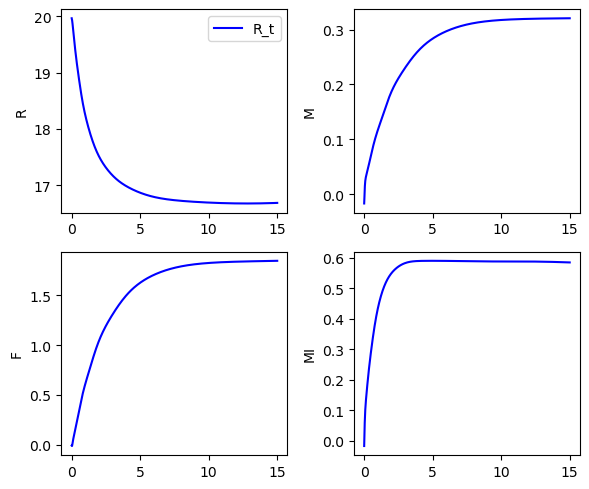

It 33500: loss = 1.32e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.98 -0.00 -0.00 -0.01]


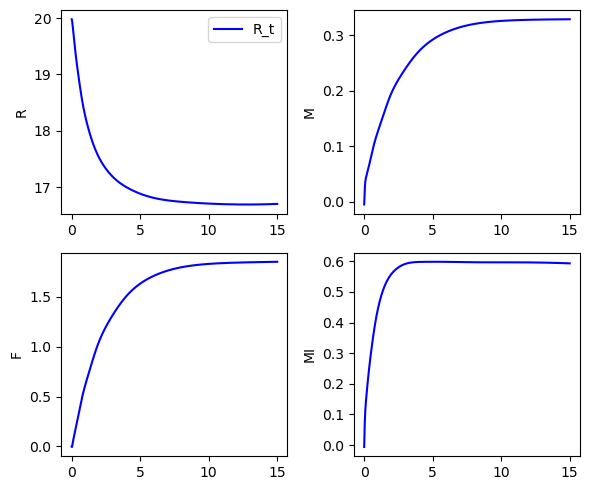

It 34000: loss = 3.34e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.96 -0.02 -0.01 -0.02]


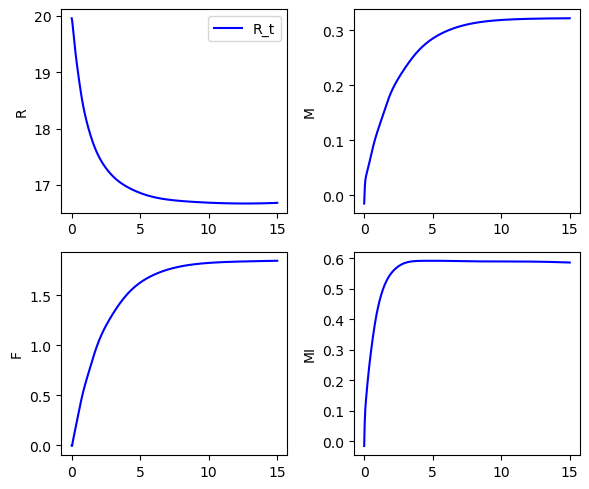

It 34500: loss = 8.79e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


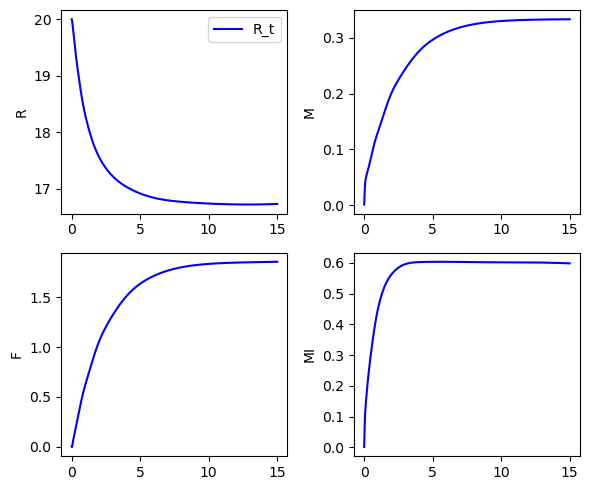

It 35000: loss = 8.40e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


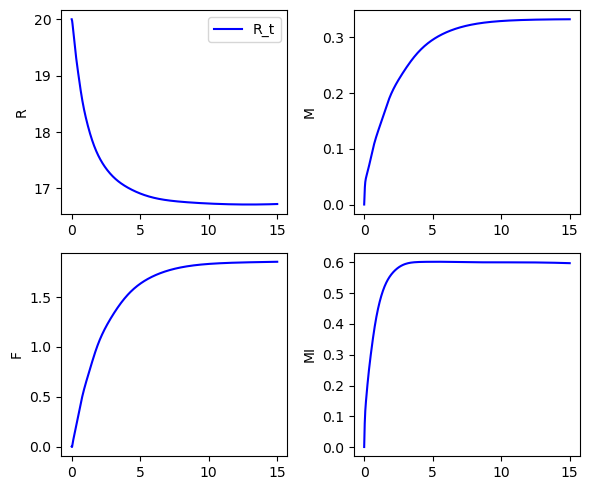

It 35500: loss = 1.10e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.00 0.01 -0.00]


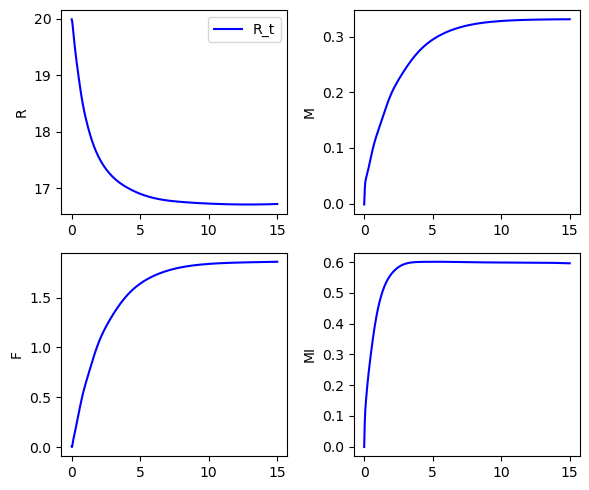

It 36000: loss = 1.47e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.02 -0.00 0.00 0.00]


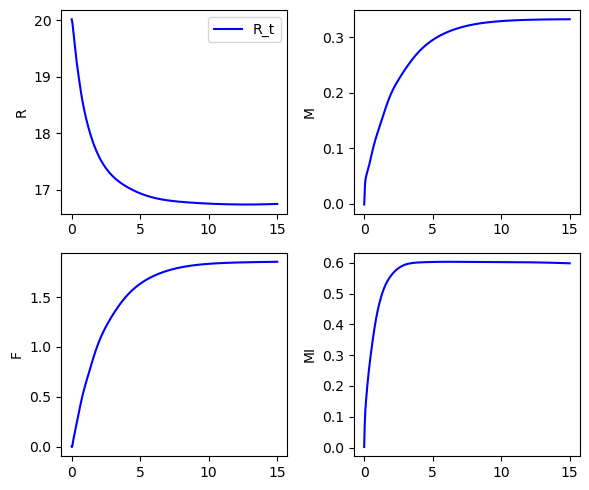

It 36500: loss = 1.17e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.01 0.00 0.01]


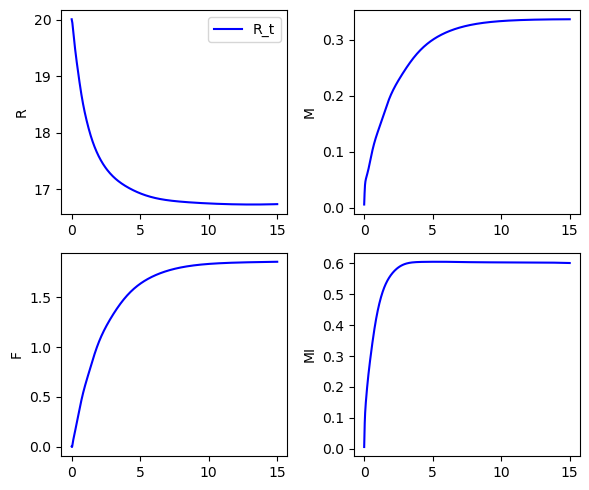

It 37000: loss = 8.44e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


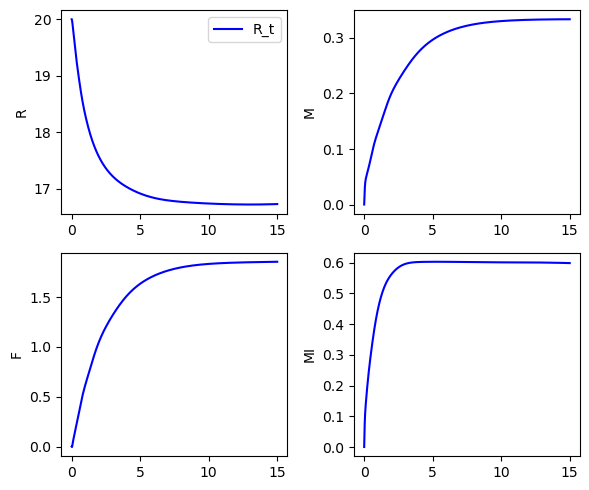

It 37500: loss = 8.42e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


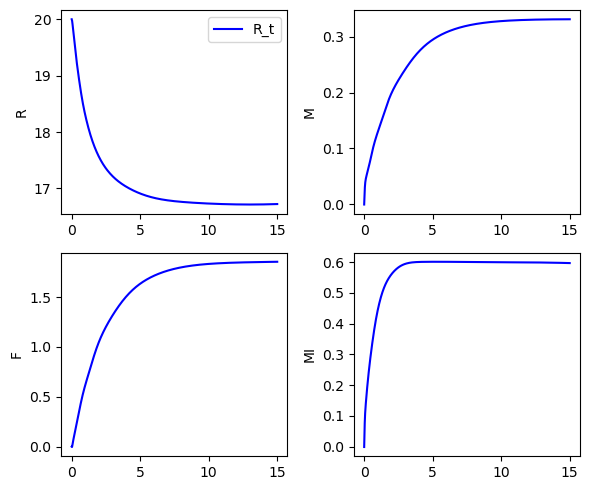

It 38000: loss = 8.39e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


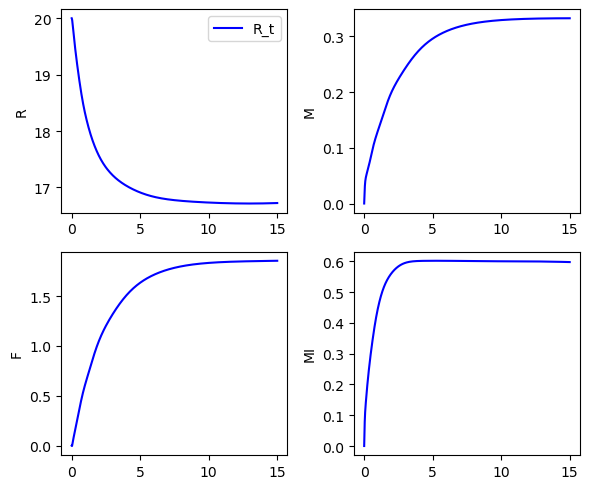

It 38500: loss = 1.61e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.02 0.01 0.01 0.01]


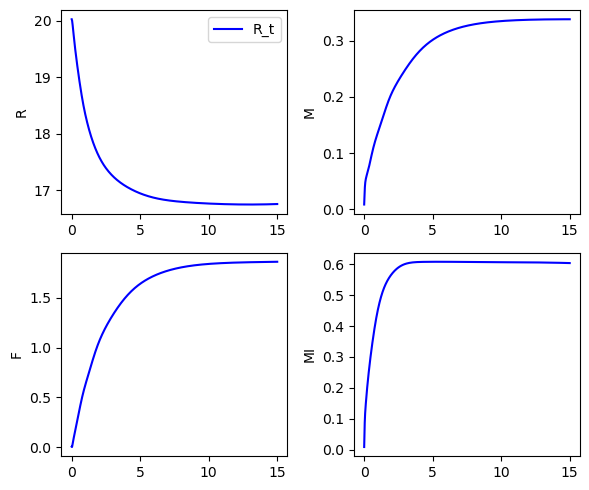

It 39000: loss = 8.43e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


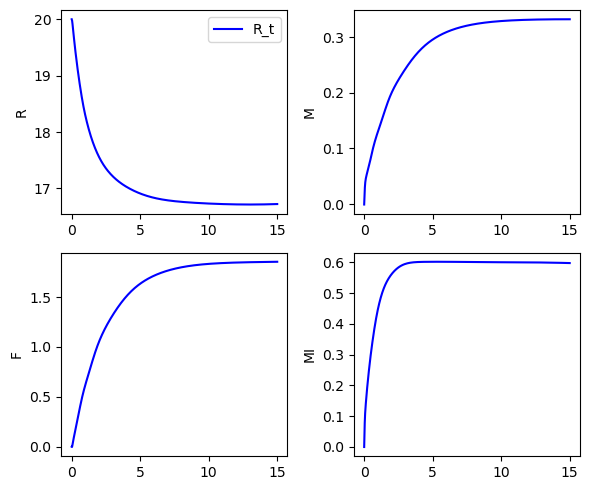

It 39500: loss = 8.76e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


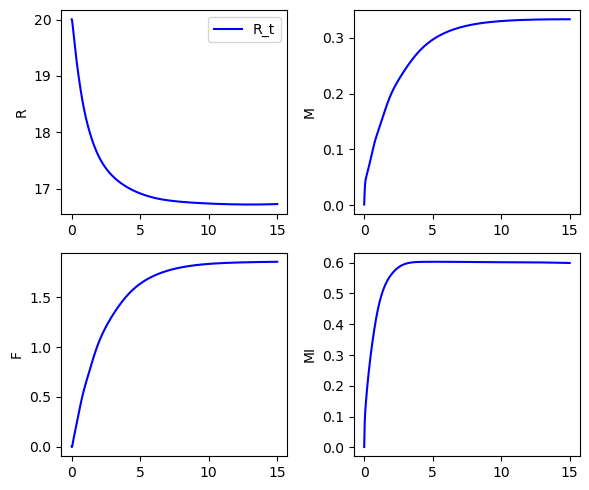

It 40000: loss = 9.78e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 -0.00 -0.01 -0.00]


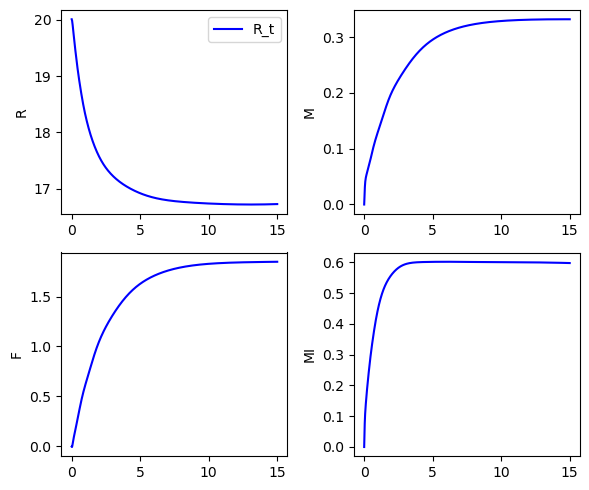

It 40500: loss = 2.07e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.96 -0.01 -0.00 -0.01]


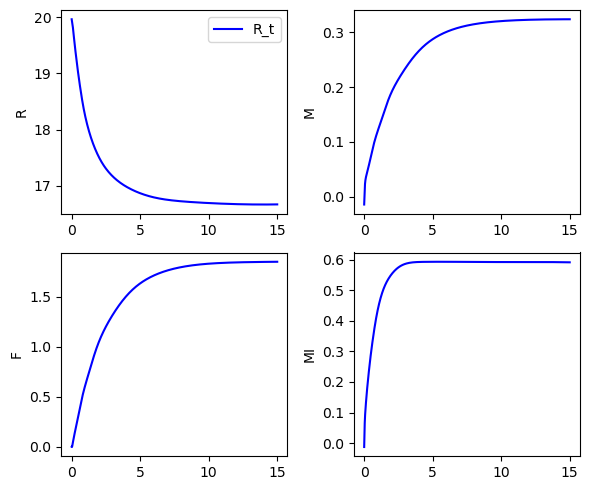

It 41000: loss = 1.08e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 -0.00 -0.00 -0.00]


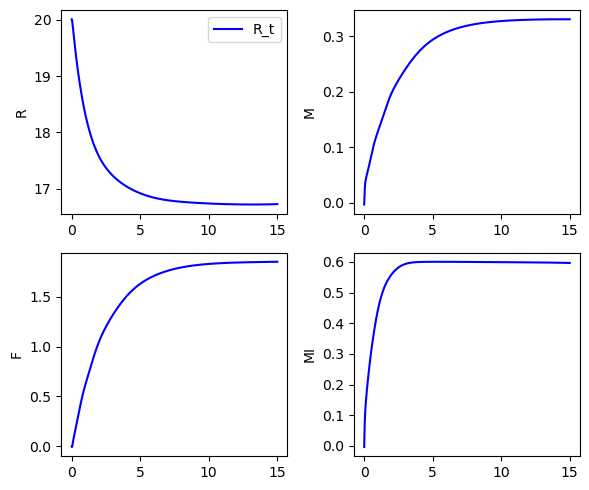

It 41500: loss = 8.40e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


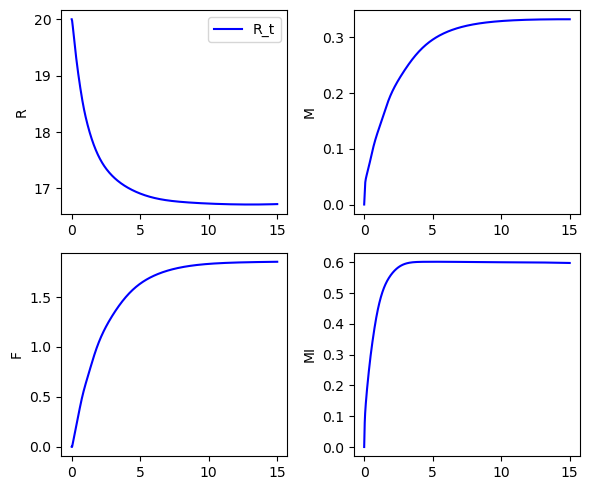

It 42000: loss = 8.39e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


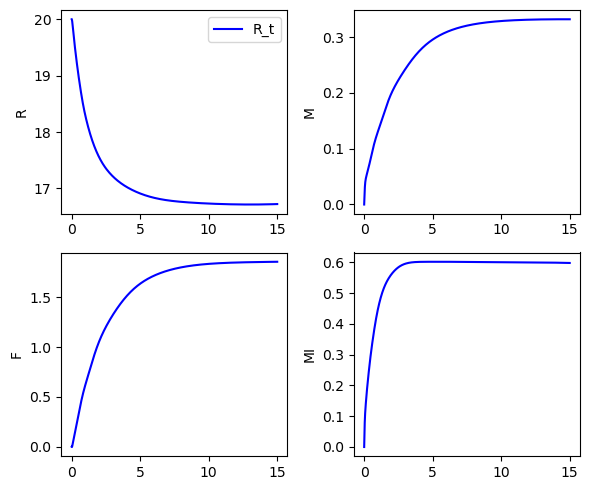

It 42500: loss = 8.41e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


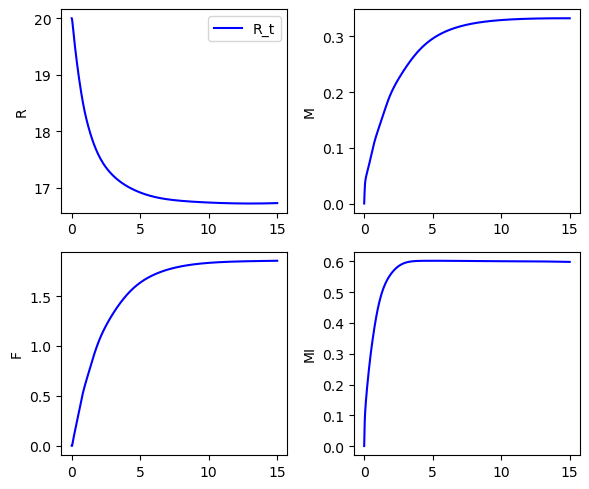

It 43000: loss = 8.39e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


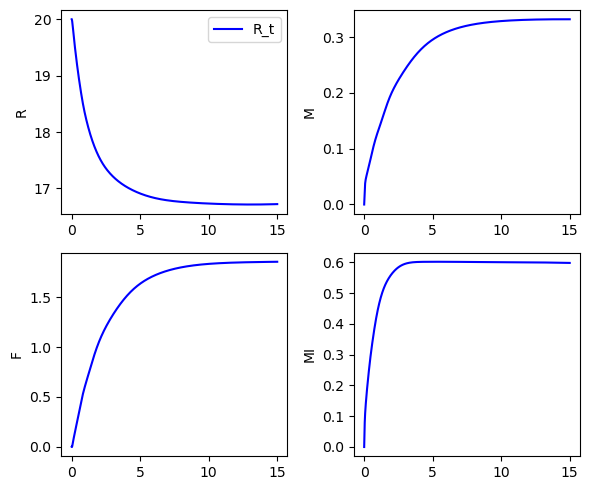

It 43500: loss = 8.58e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


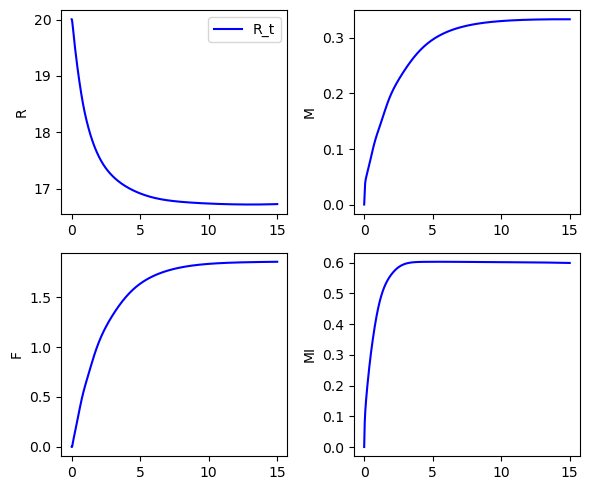

It 44000: loss = 8.38e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


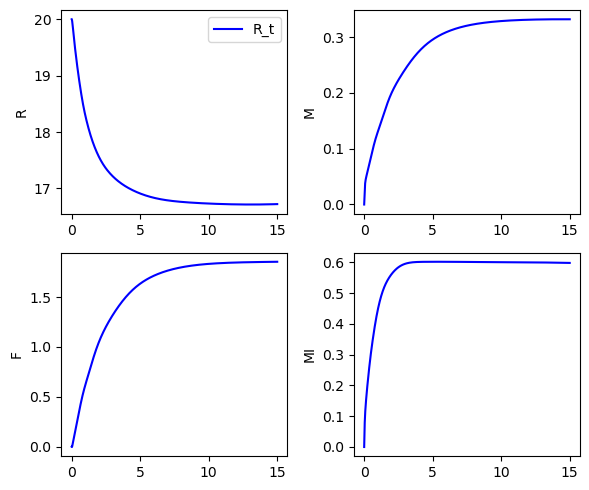

It 44500: loss = 8.93e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 -0.00 -0.00 -0.00]


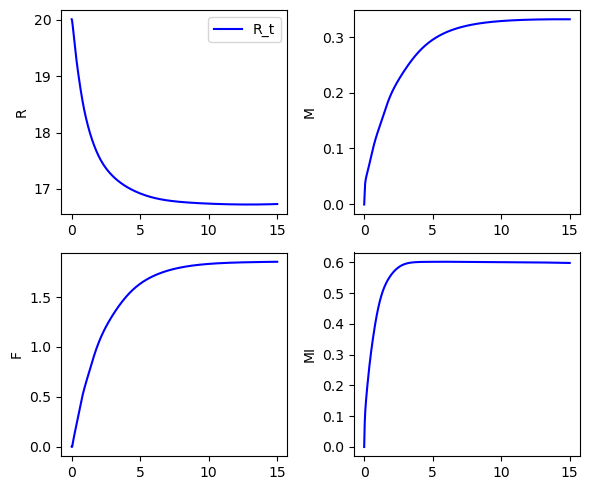

It 45000: loss = 8.38e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


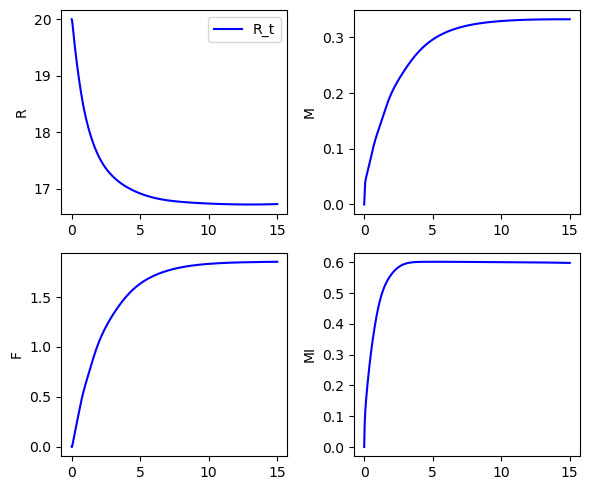

It 45500: loss = 2.96e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.96 -0.01 -0.01 -0.02]


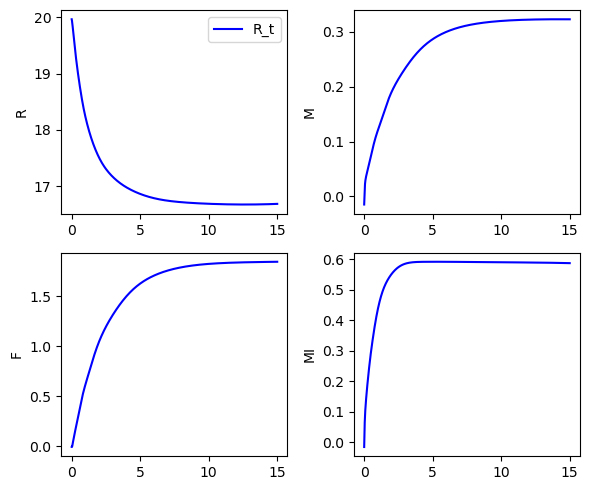

It 46000: loss = 8.38e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


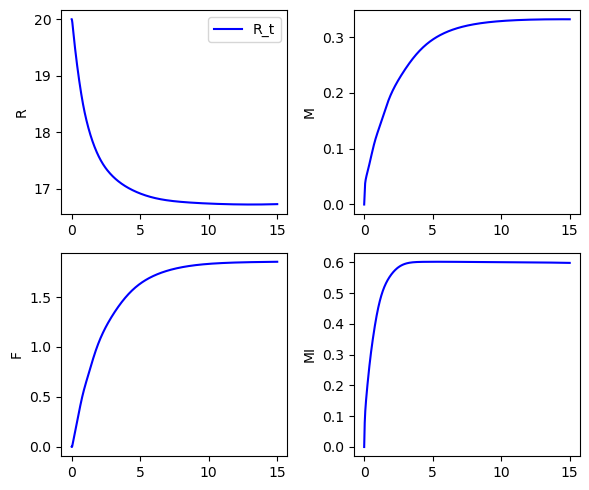

It 46500: loss = 8.38e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


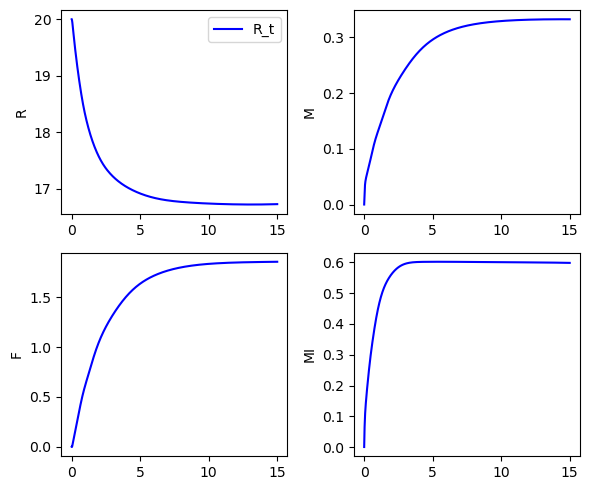

It 47000: loss = 8.38e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


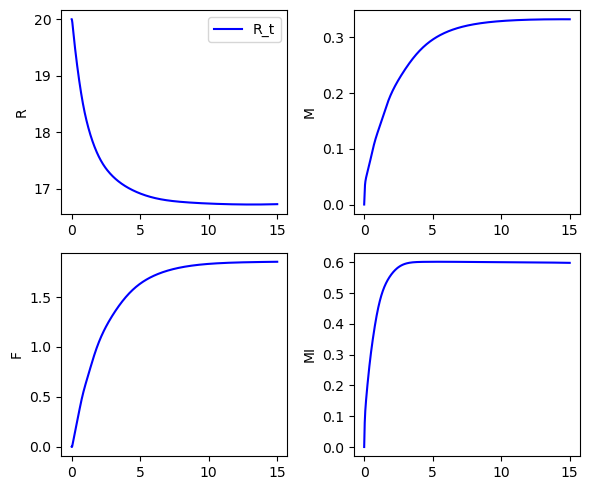

It 47500: loss = 8.50e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


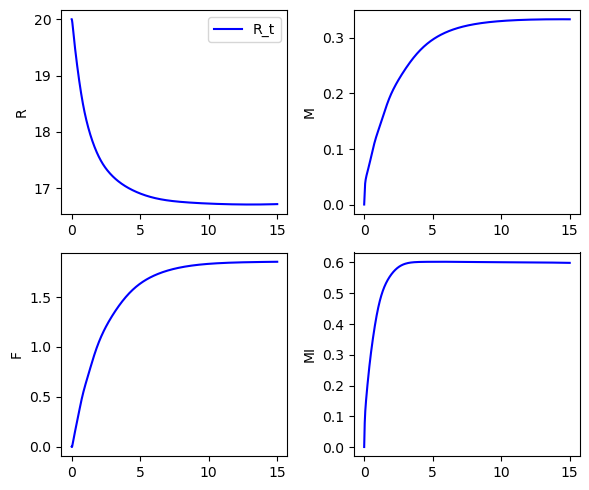

It 48000: loss = 1.32e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.00 -0.00 0.00]


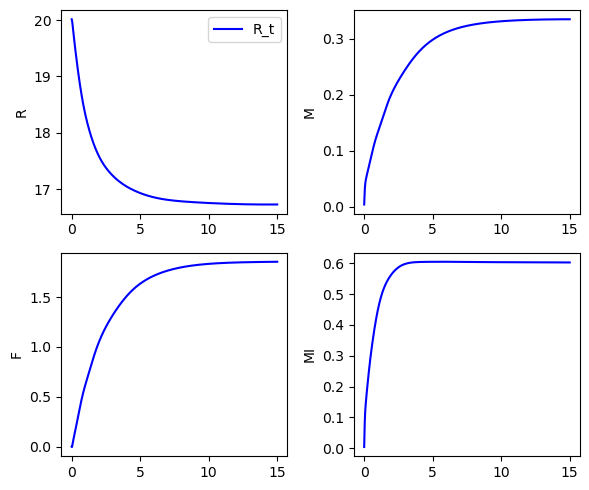

It 48500: loss = 8.69e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


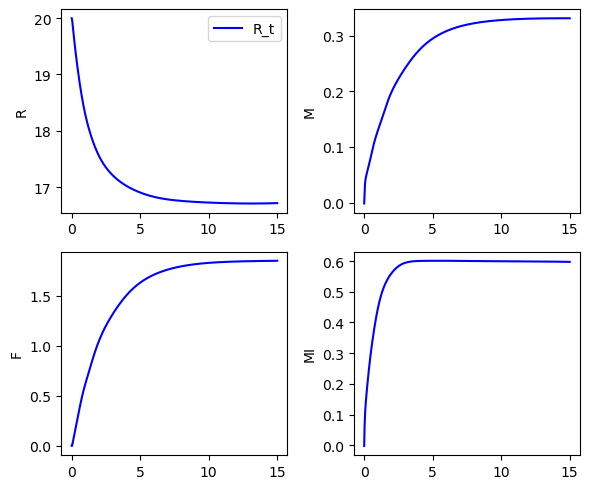

It 49000: loss = 1.91e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.00 -0.00 0.00]


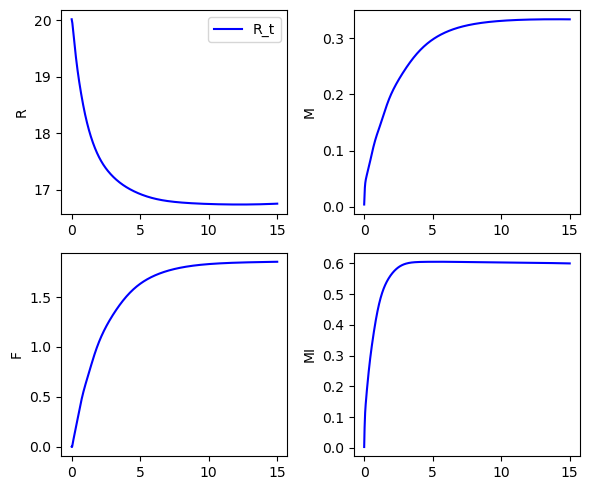

It 49500: loss = 8.53e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


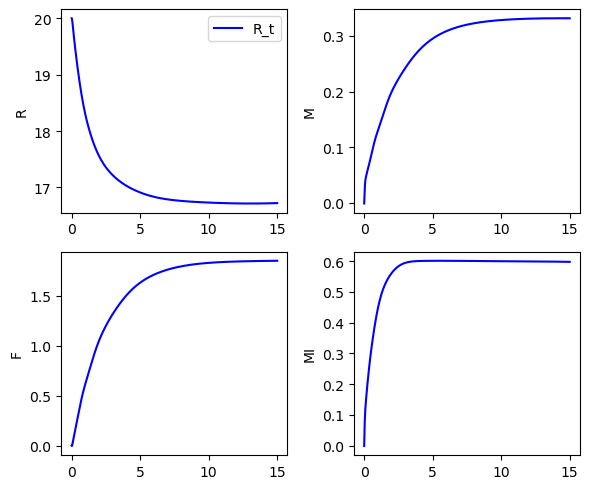

It 50000: loss = 8.38e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


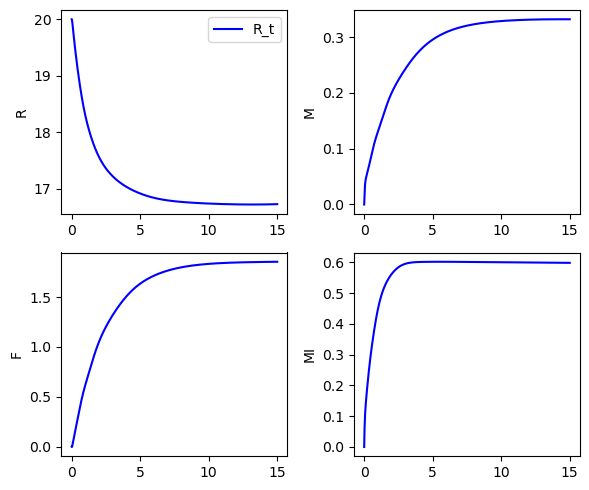

It 50500: loss = 8.38e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 0.00]


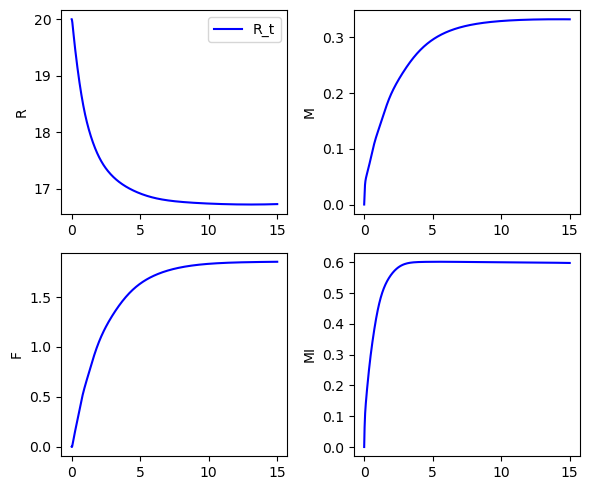

It 51000: loss = 8.42e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


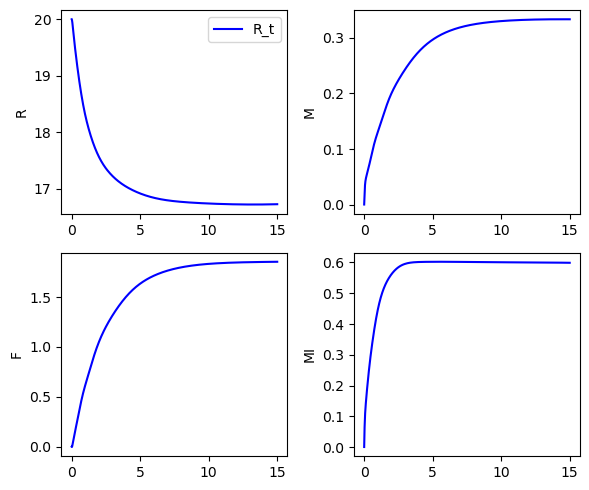

It 51500: loss = 8.62e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


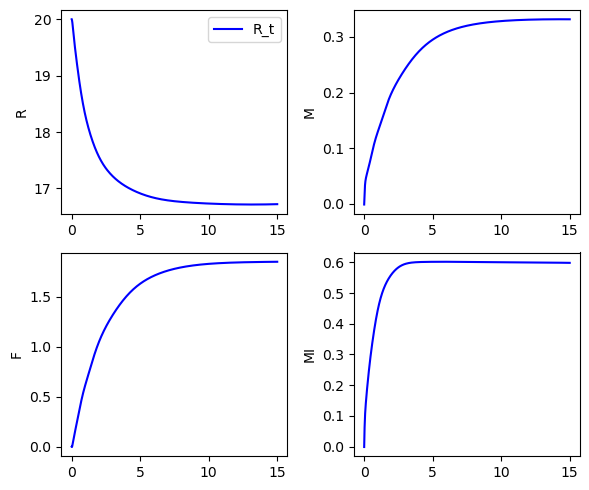

It 52000: loss = 1.15e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.01 -0.00 -0.01]


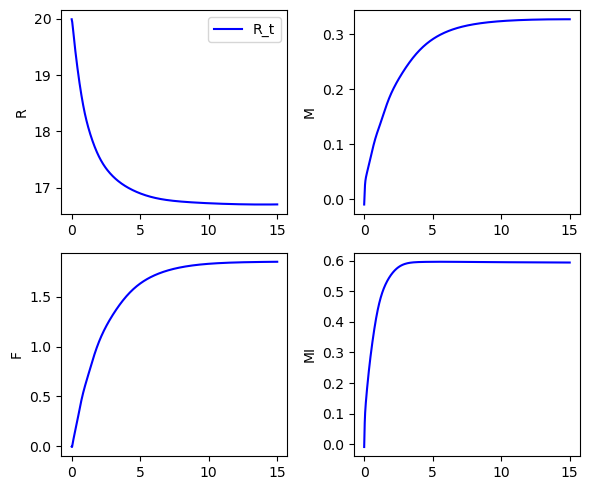

It 52500: loss = 8.97e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.00 -0.00 -0.00]


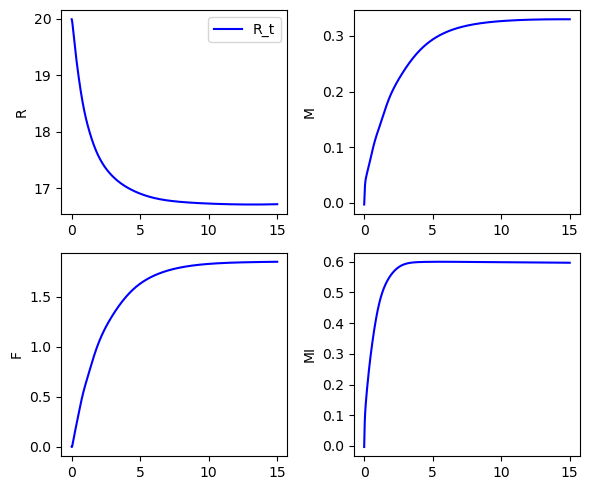

It 53000: loss = 8.38e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


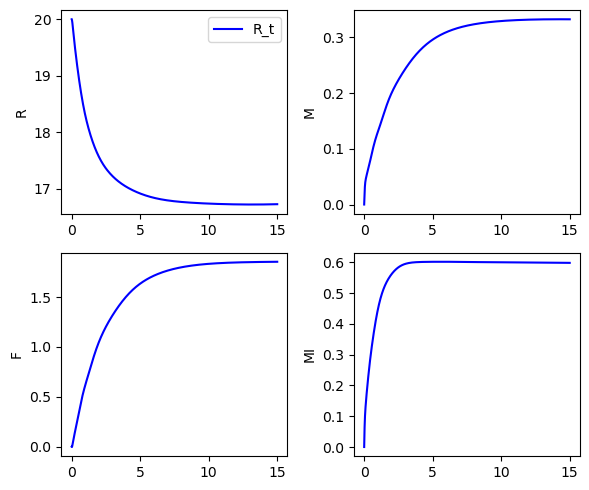

It 53500: loss = 2.22e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.03 0.01 0.00 0.01]


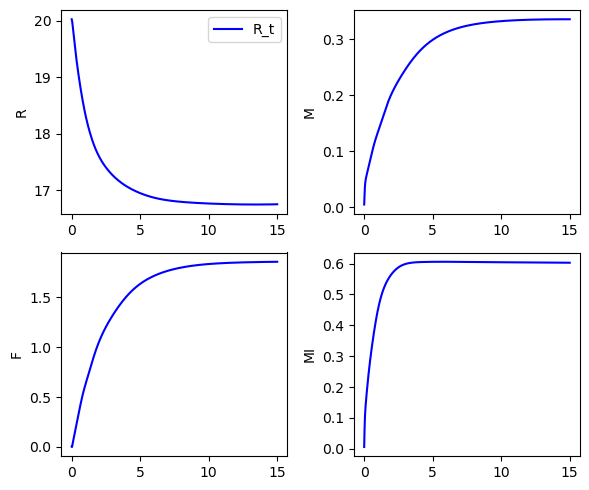

It 54000: loss = 8.38e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


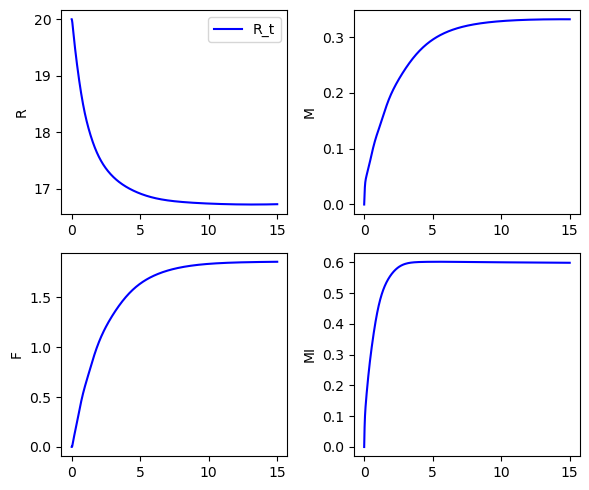

It 54500: loss = 9.10e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 0.00 0.00 0.00]


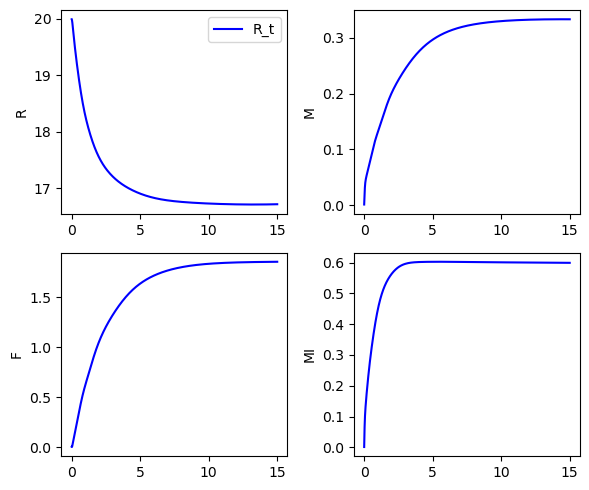

It 55000: loss = 8.43e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


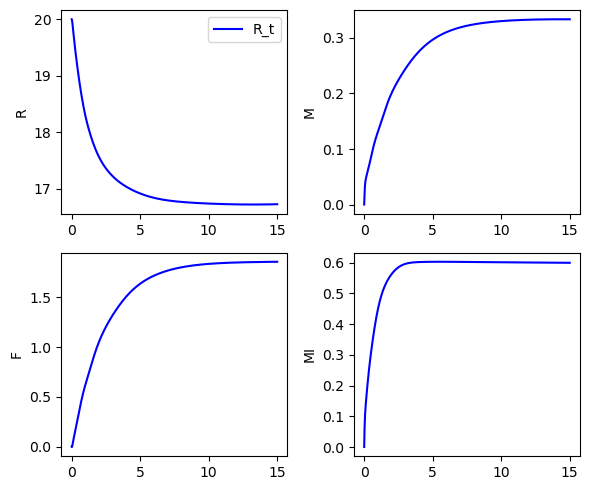

It 55500: loss = 8.39e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


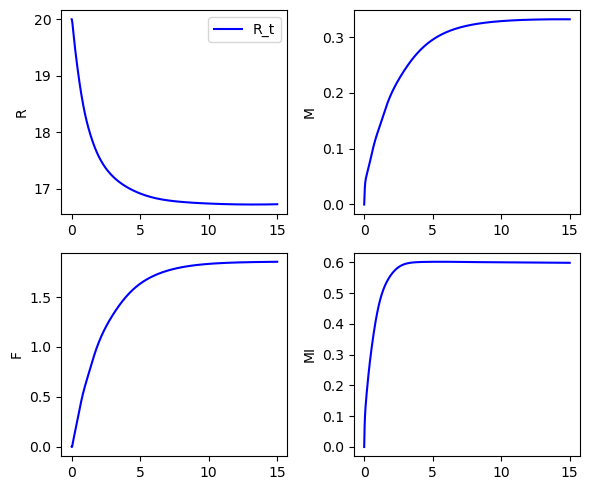

It 56000: loss = 8.37e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


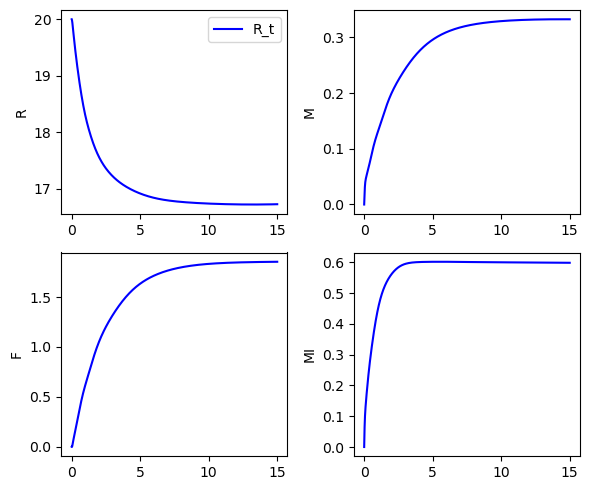

It 56500: loss = 8.40e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


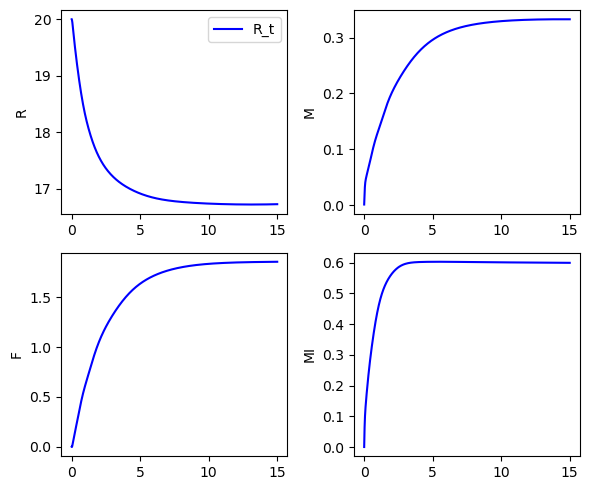

It 57000: loss = 9.40e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.01 0.00 0.01]


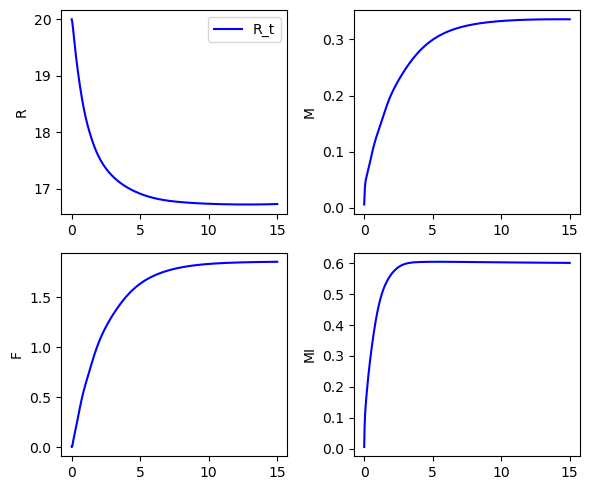

It 57500: loss = 1.43e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.98 -0.01 -0.00 -0.01]


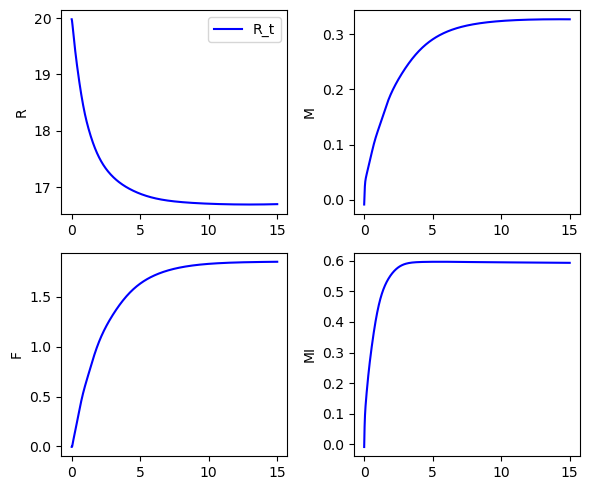

It 58000: loss = 8.37e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


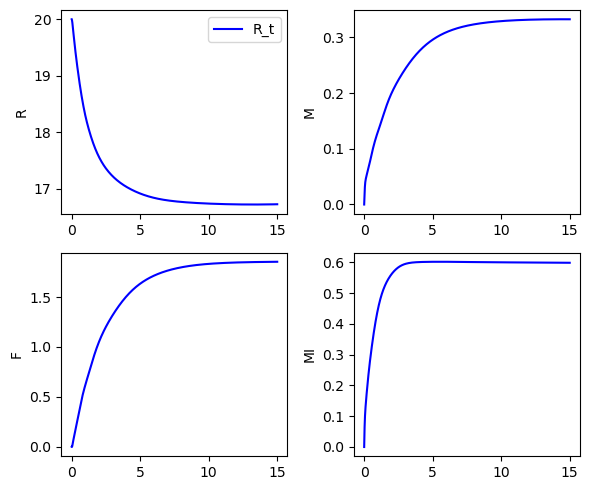

It 58500: loss = 8.38e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


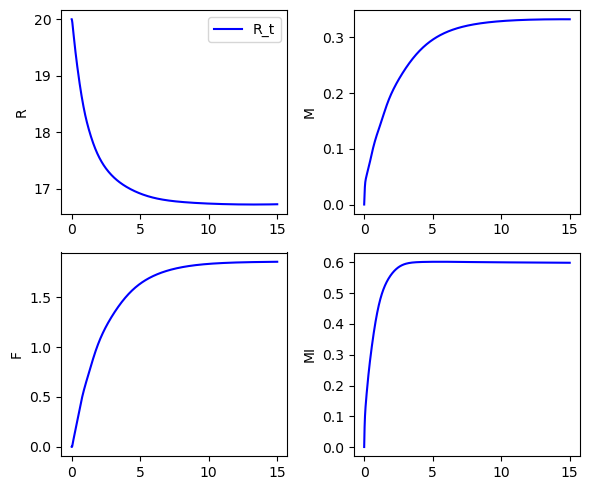

It 59000: loss = 8.40e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


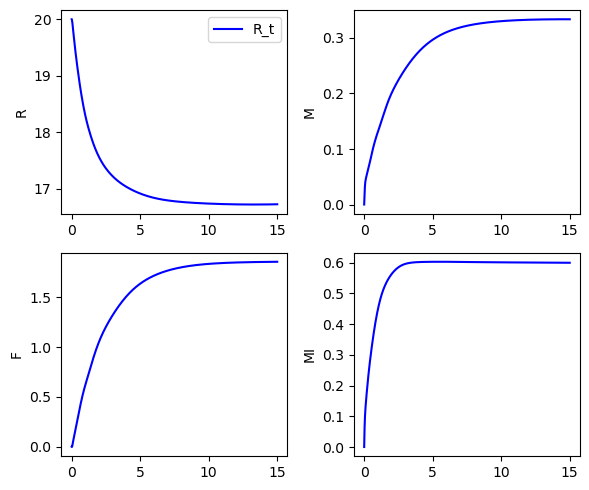

It 59500: loss = 8.37e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


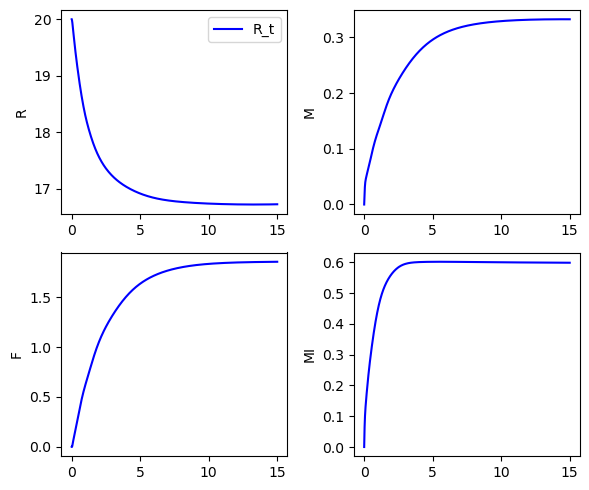

It 60000: loss = 8.56e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 -0.00 0.00 0.00]


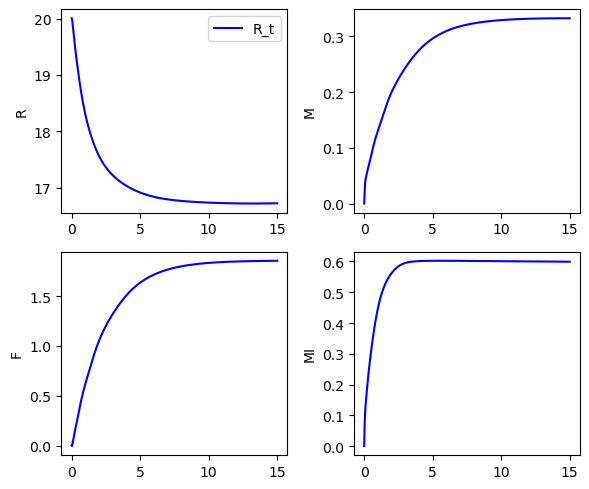

It 60500: loss = 8.37e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


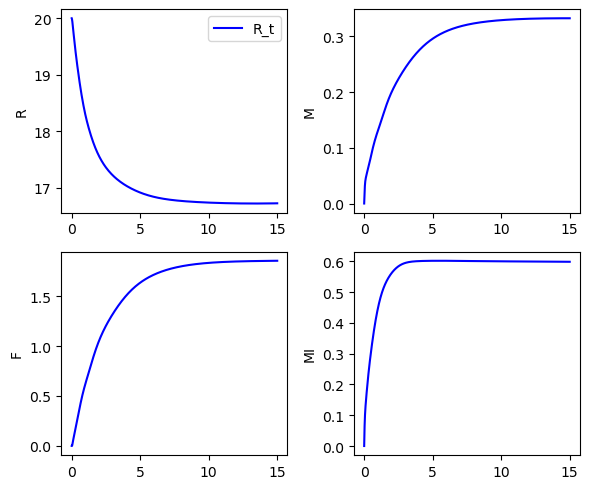

It 61000: loss = 8.42e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


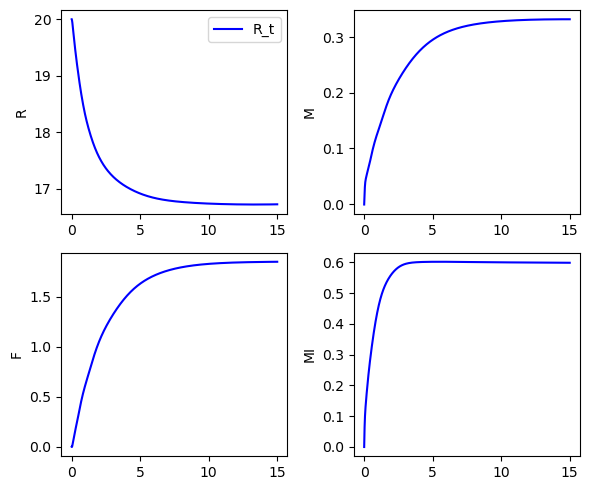

It 61500: loss = 8.43e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


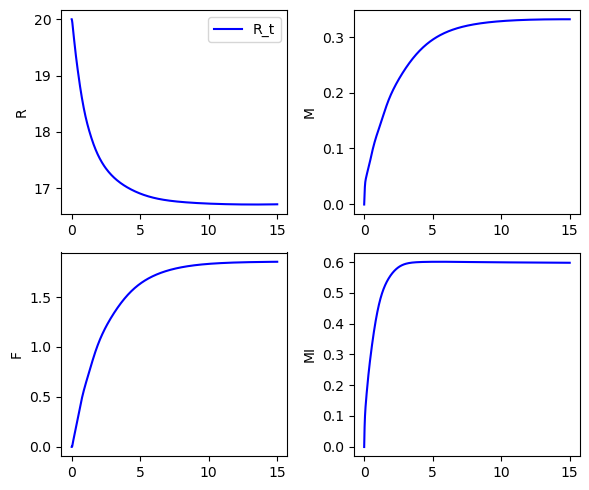

It 62000: loss = 8.37e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


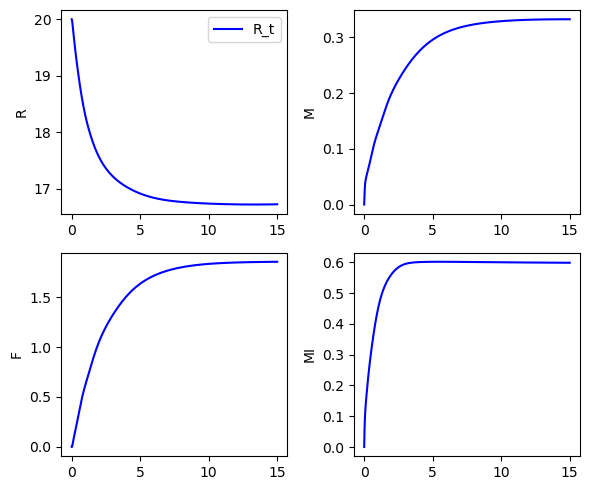

It 62500: loss = 8.37e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


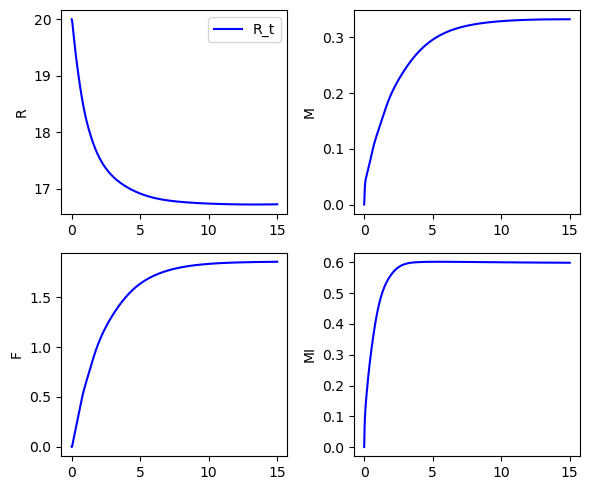

It 63000: loss = 9.04e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 -0.00 -0.00 -0.00]


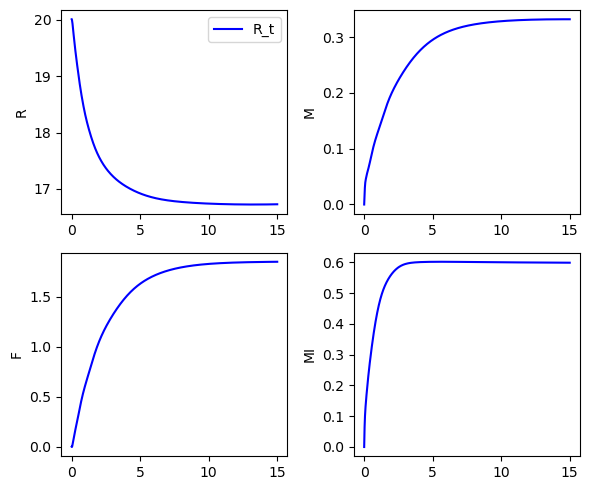

It 63500: loss = 3.27e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.96 -0.02 -0.01 -0.02]


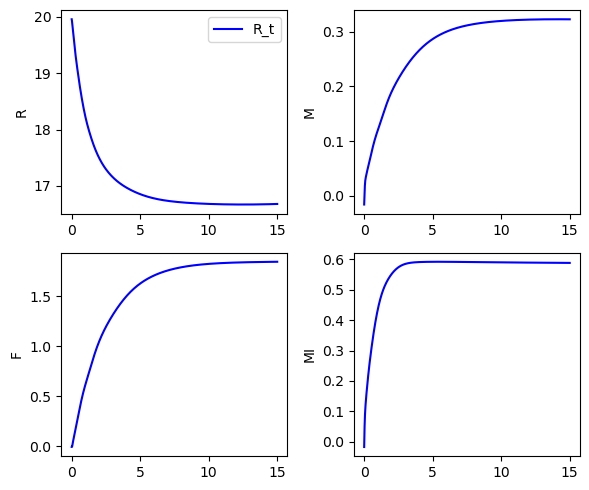

It 64000: loss = 5.38e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.03 0.02 0.02 0.02]


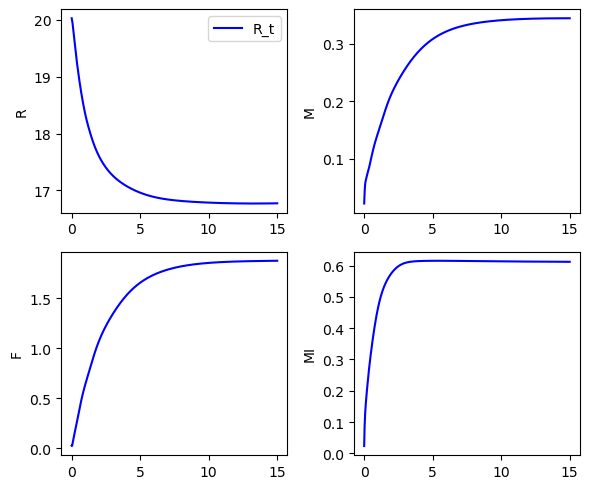

It 64500: loss = 8.39e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


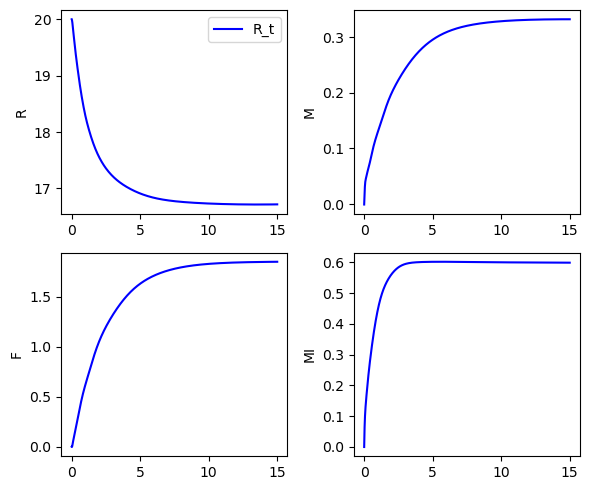

It 65000: loss = 8.72e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


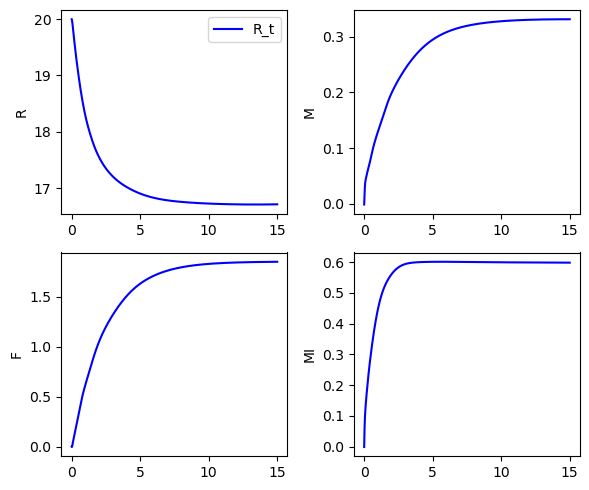

It 65500: loss = 8.90e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.00 -0.00 0.00]


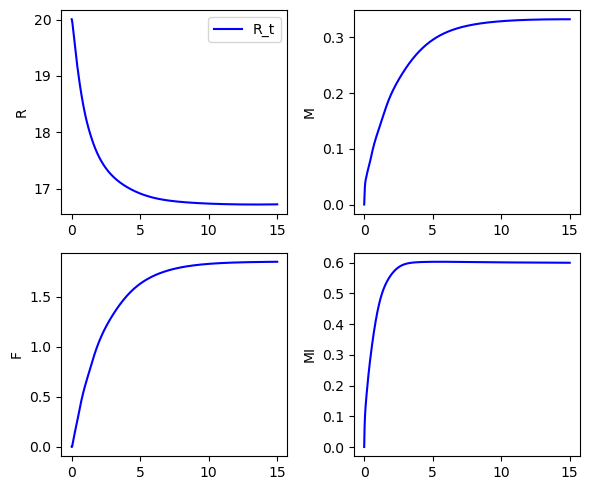

It 66000: loss = 8.38e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 -0.00]


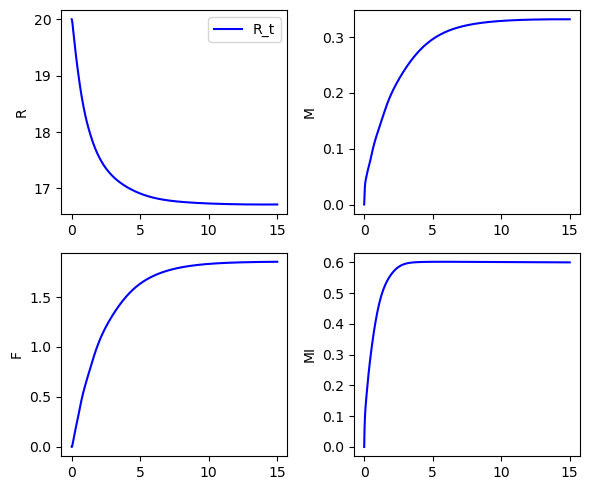

It 66500: loss = 1.06e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 -0.01 -0.01 -0.01]


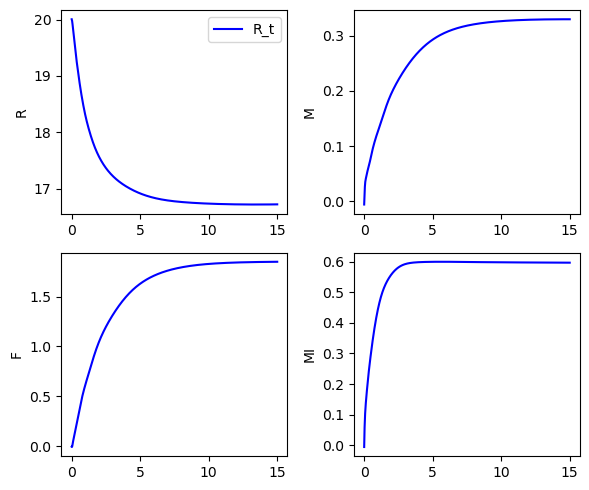

It 67000: loss = 1.10e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.00 -0.00 -0.01]


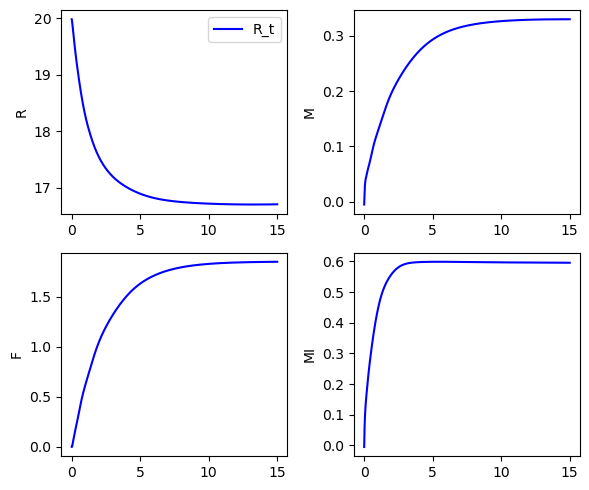

It 67500: loss = 8.38e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


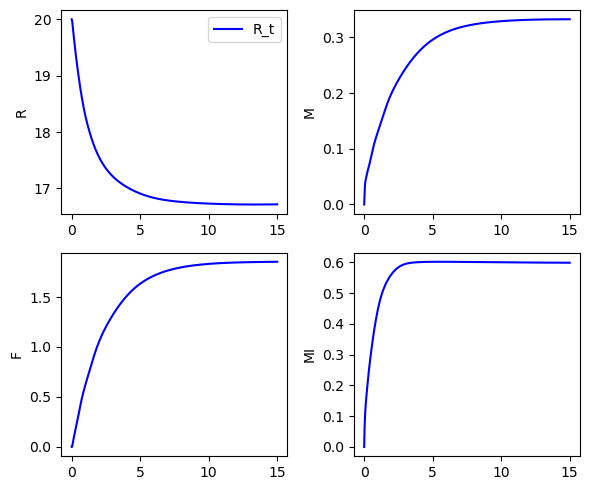

It 68000: loss = 9.89e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.02 0.00 0.00 -0.00]


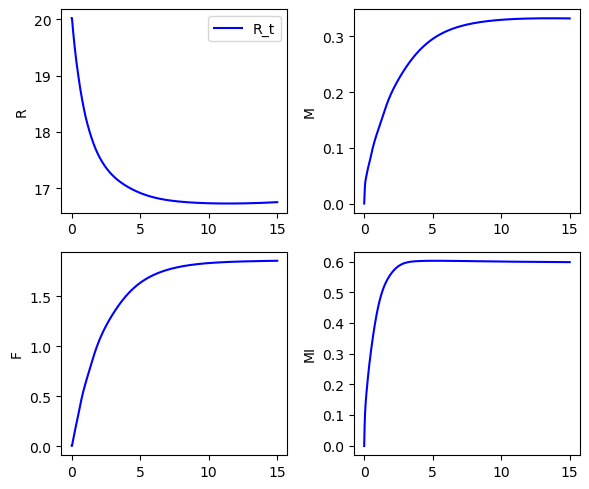

It 68500: loss = 8.37e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


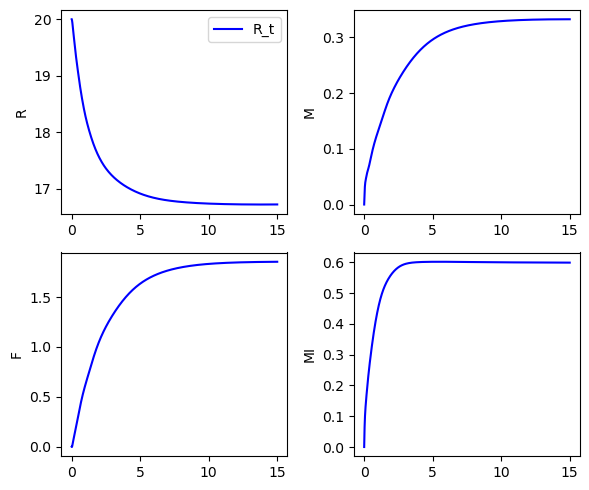

It 69000: loss = 3.44e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.04 0.02 0.01 0.02]


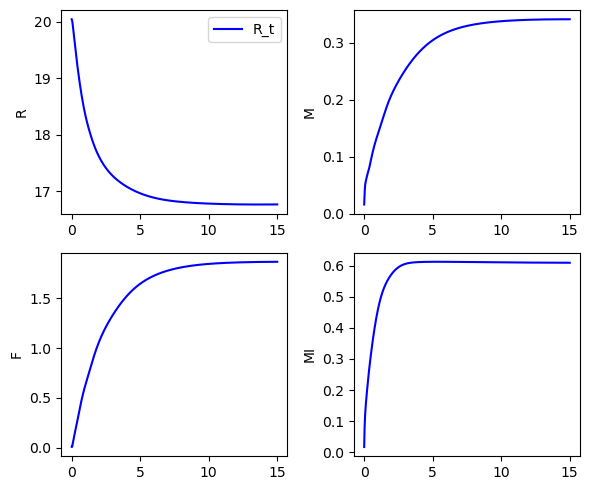

It 69500: loss = 9.48e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.00 -0.00 -0.00]


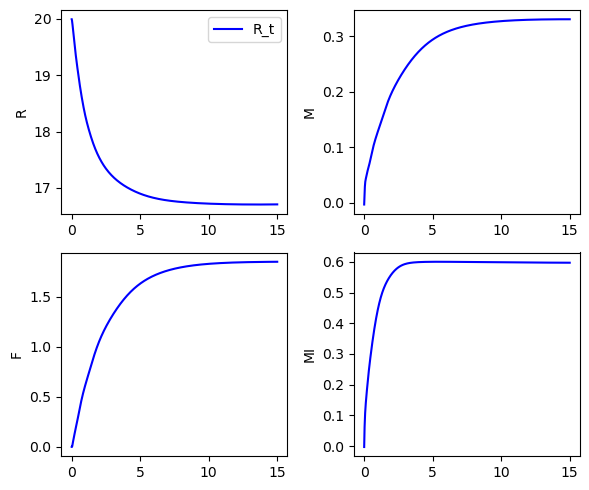

It 70000: loss = 8.37e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


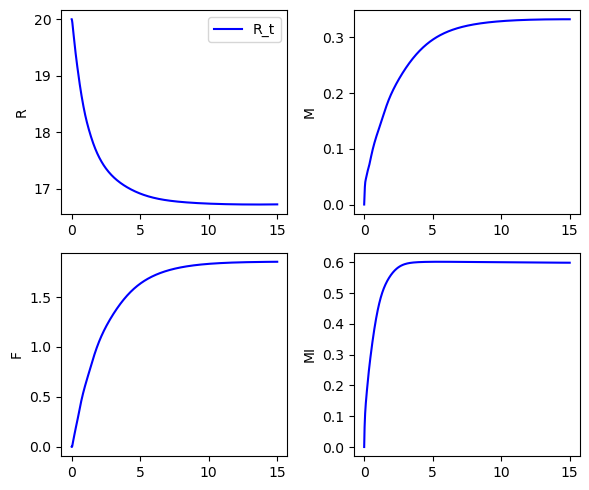

It 70500: loss = 8.37e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


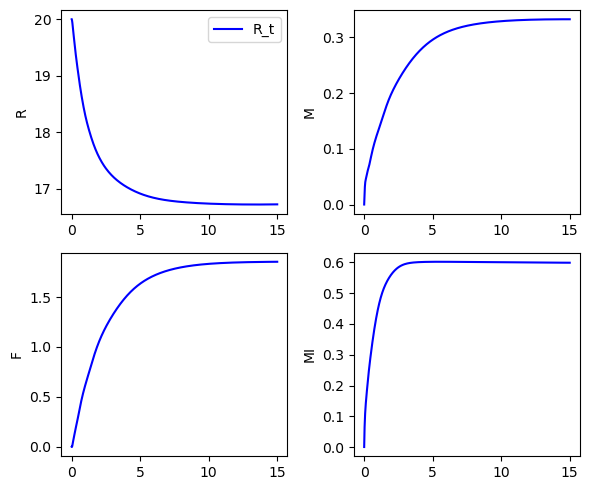

It 71000: loss = 8.37e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


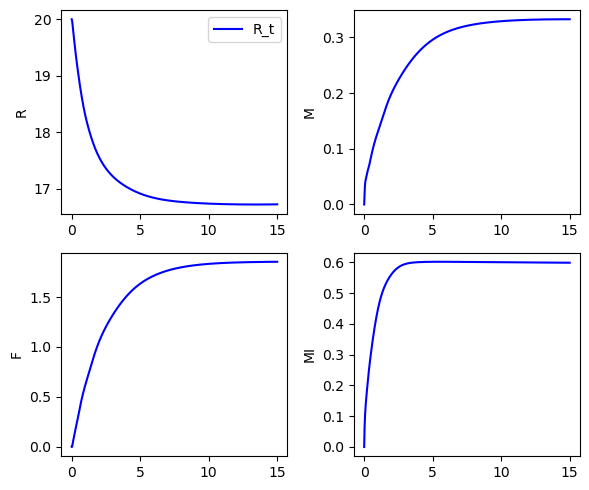

It 71500: loss = 8.37e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


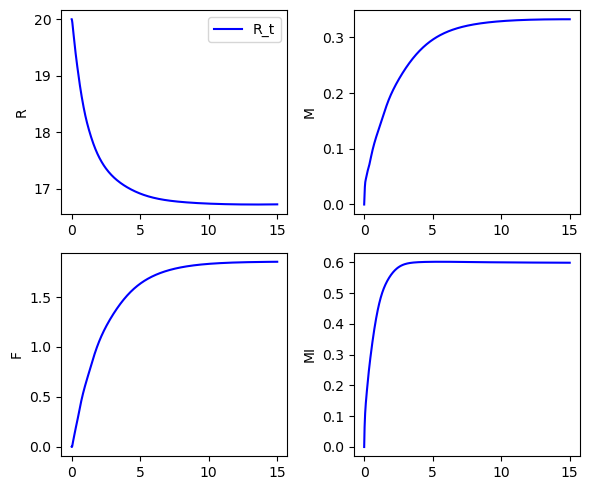

It 72000: loss = 8.37e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 0.00]


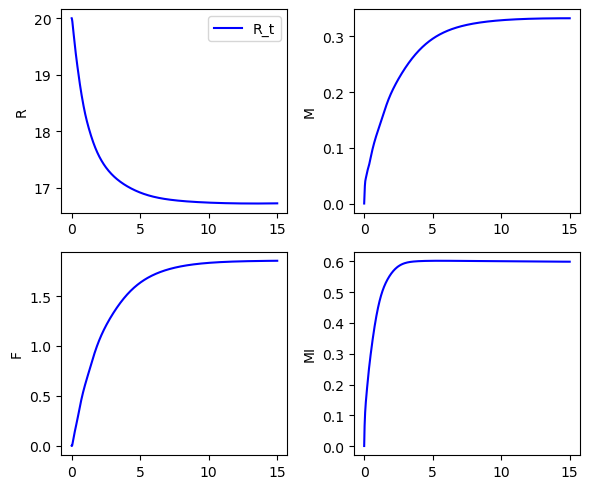

It 72500: loss = 8.37e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


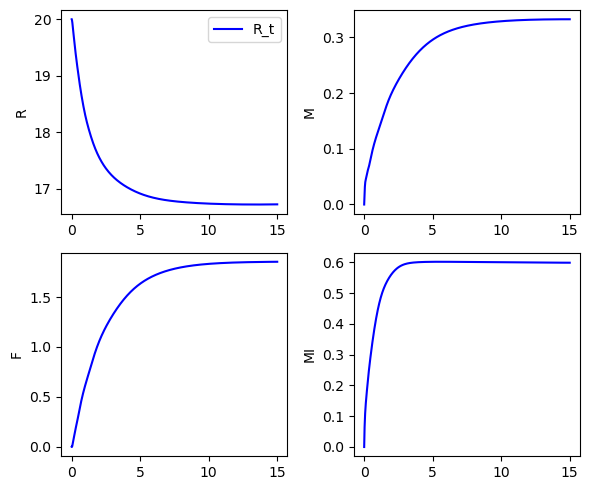

It 73000: loss = 9.54e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


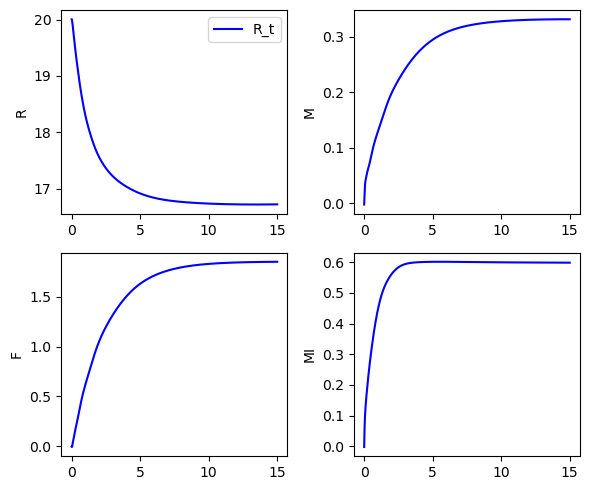

It 73500: loss = 1.92e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.98 -0.01 -0.01 -0.01]


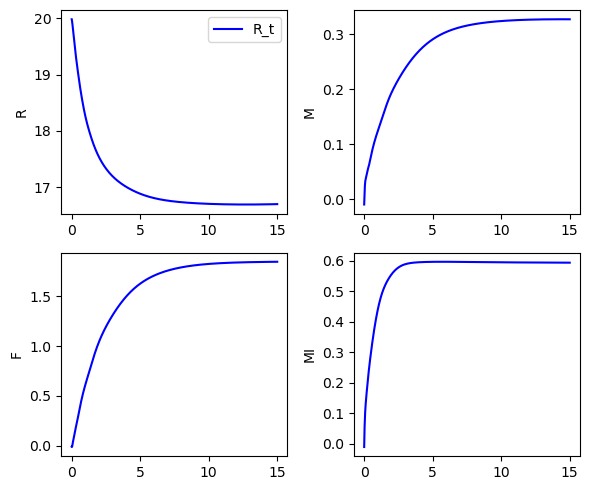

It 74000: loss = 8.64e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.00 0.00 0.00]


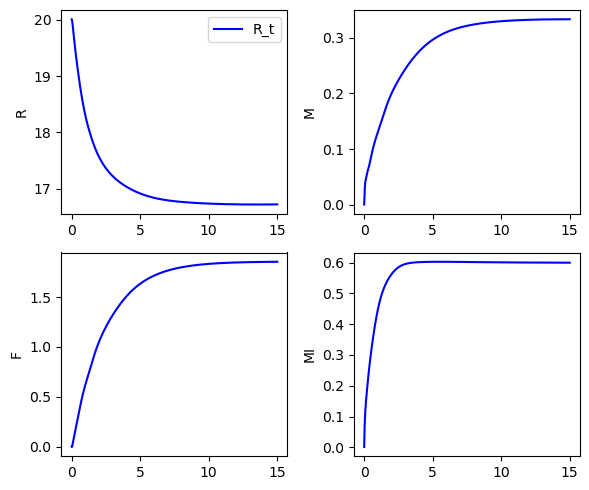

It 74500: loss = 8.46e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


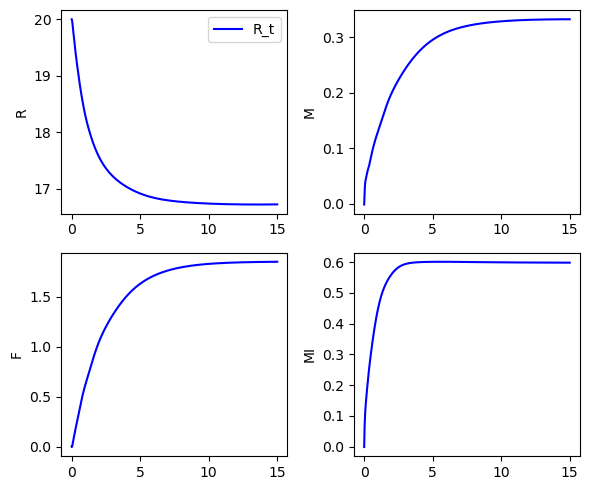

It 75000: loss = 8.37e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


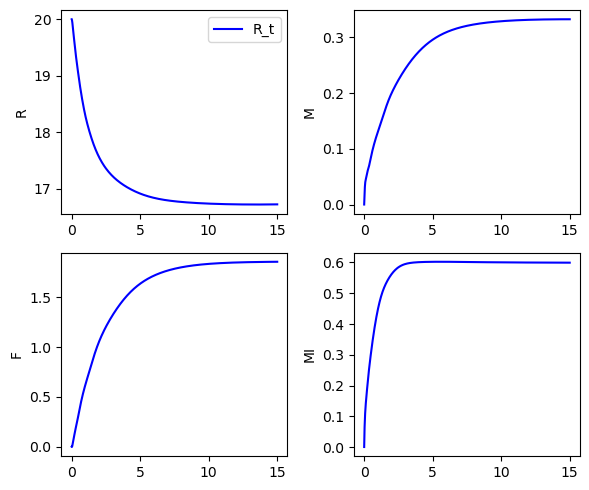

It 75500: loss = 1.06e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.01 0.01 0.01]


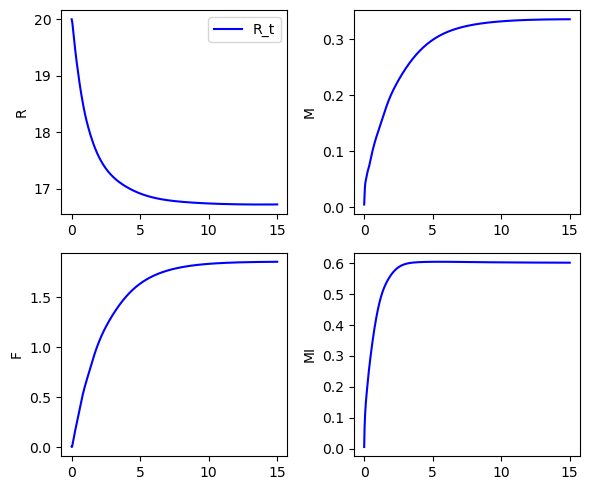

It 76000: loss = 9.35e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.00 -0.00 -0.00]


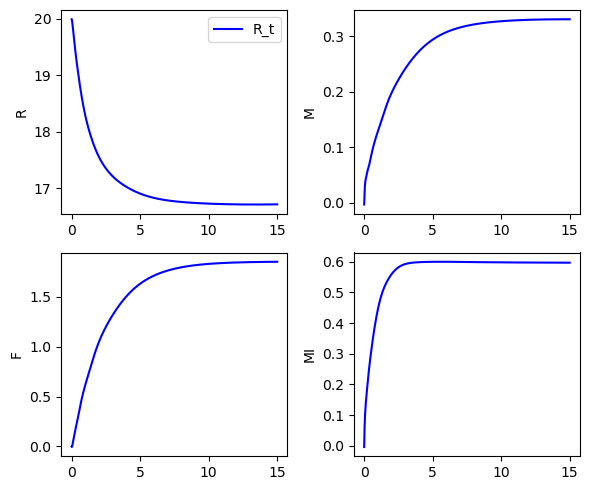

It 76500: loss = 4.53e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.96 -0.02 -0.02 -0.02]


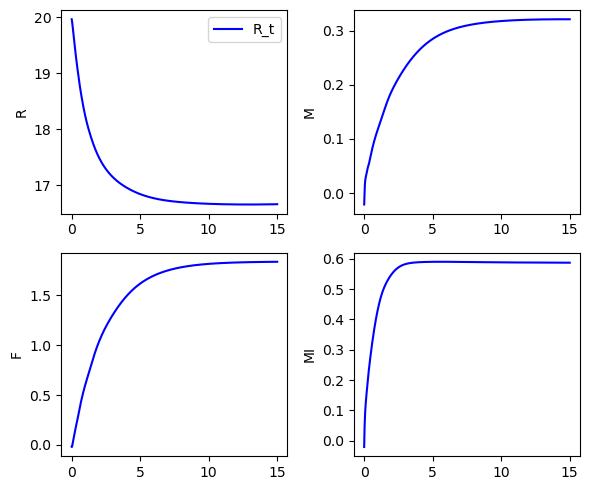

It 77000: loss = 8.39e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


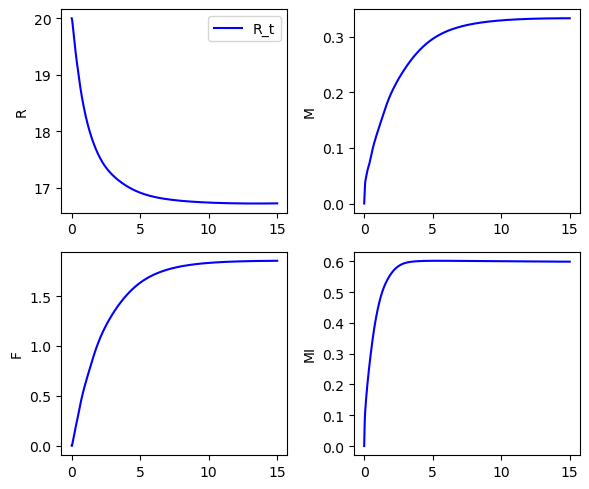

It 77500: loss = 8.39e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


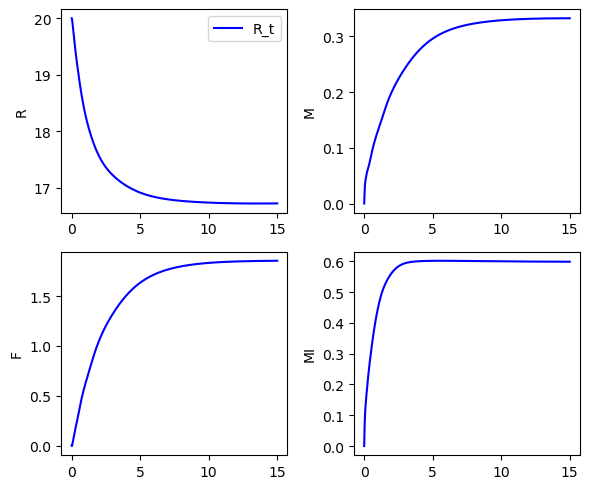

It 78000: loss = 1.65e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.01 0.01 0.01]


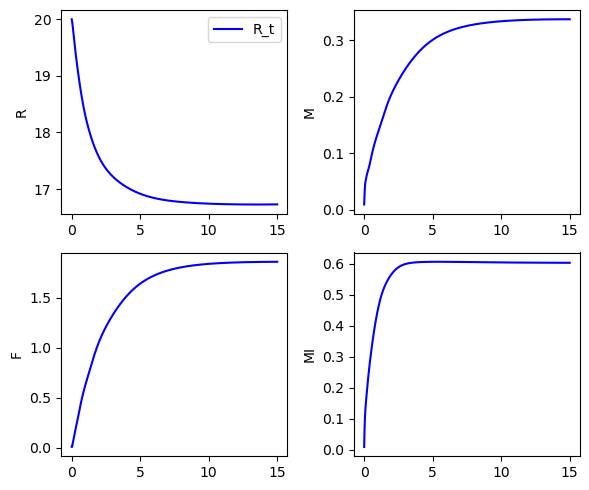

It 78500: loss = 8.46e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


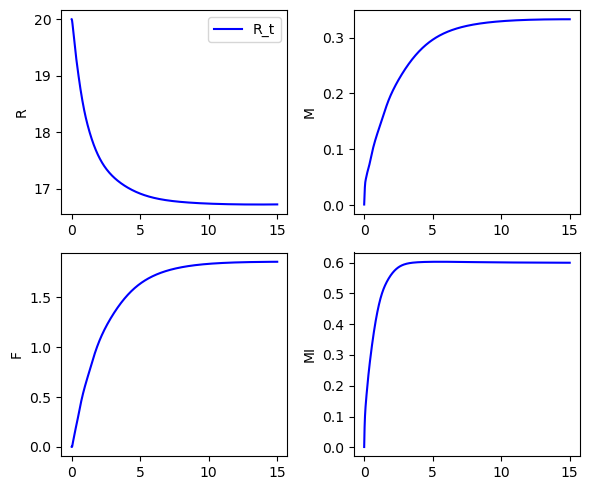

It 79000: loss = 3.08e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.02 0.02 0.02]


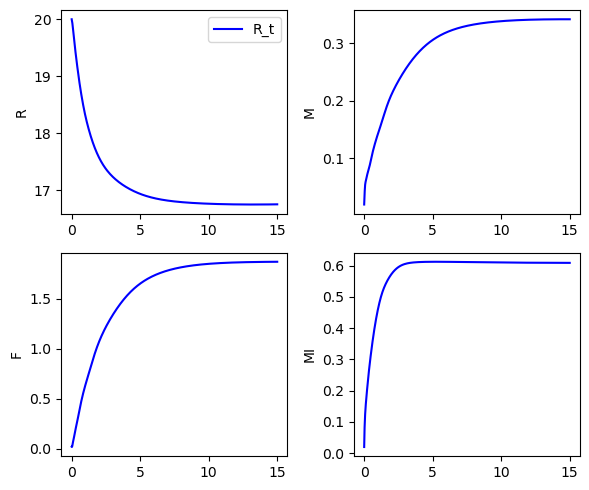

It 79500: loss = 2.41e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.97 -0.02 -0.01 -0.02]


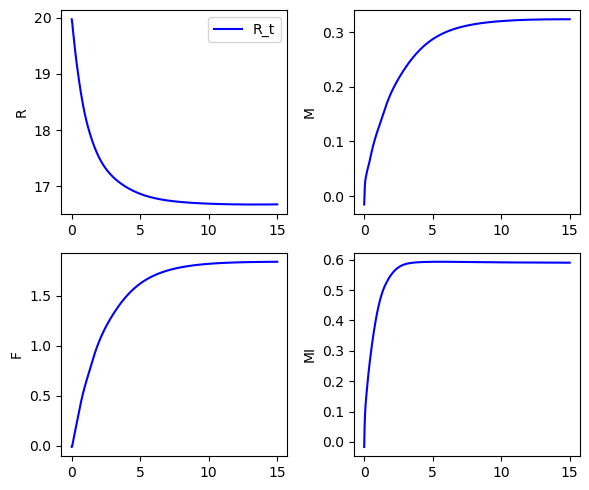

It 80000: loss = 8.36e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


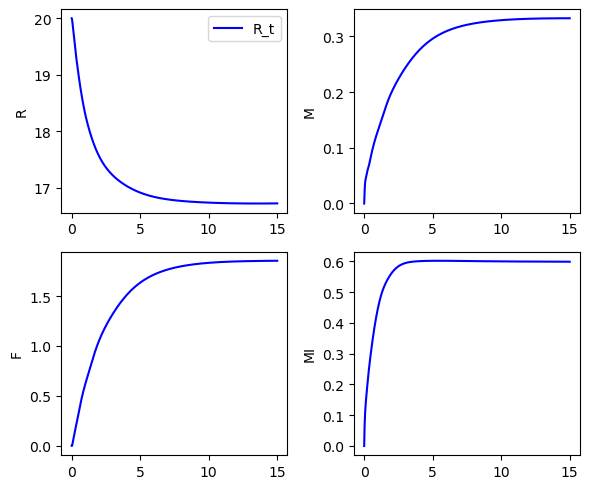

It 80500: loss = 8.37e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


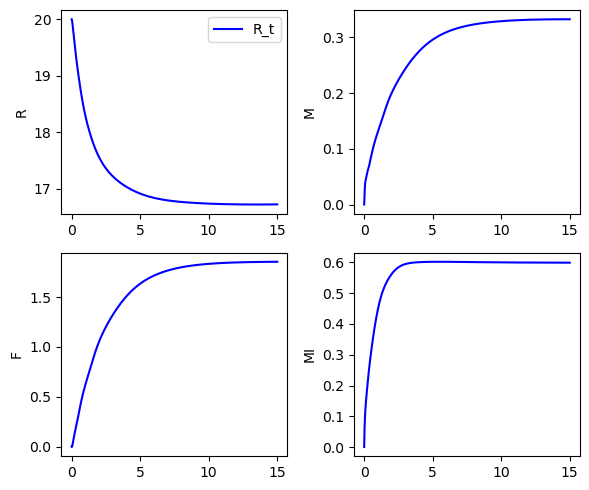

It 81000: loss = 8.54e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


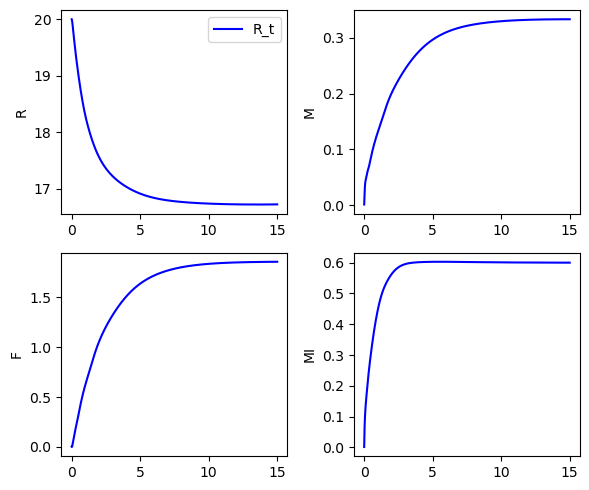

It 81500: loss = 8.37e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


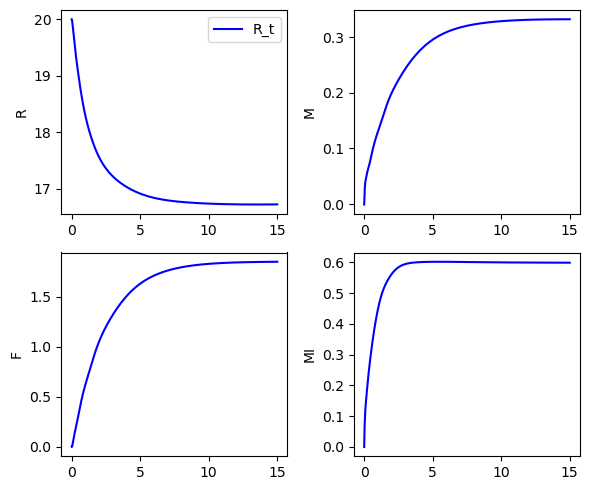

It 82000: loss = 1.60e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.01 -0.01 -0.01]


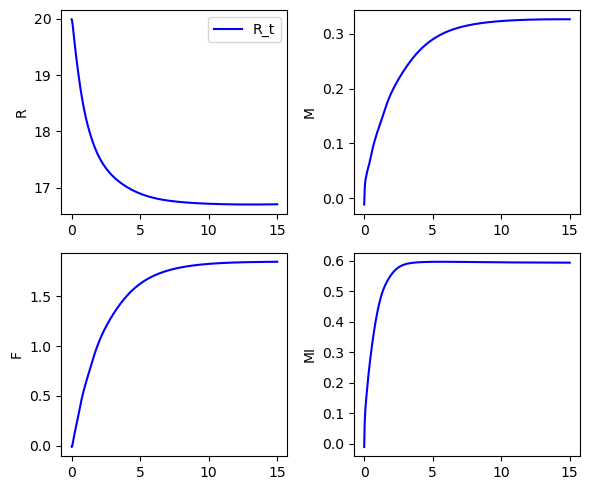

It 82500: loss = 8.36e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


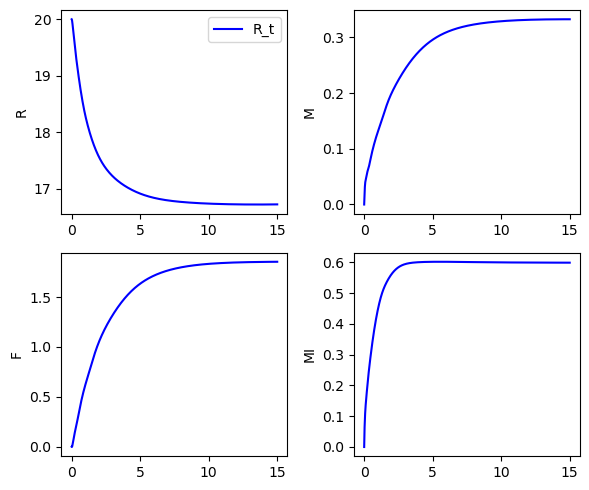

It 83000: loss = 8.45e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


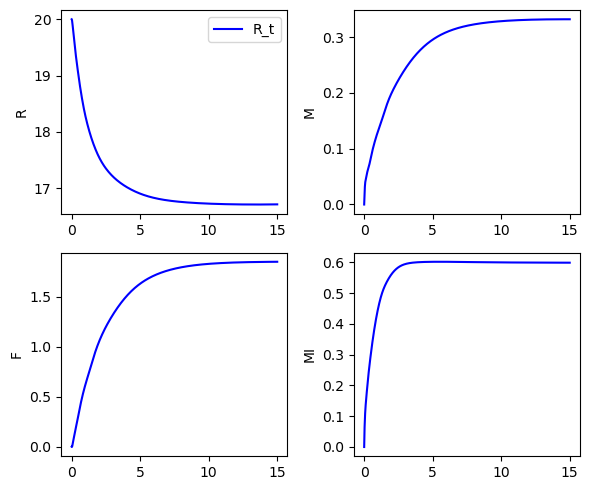

It 83500: loss = 8.37e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 0.00]


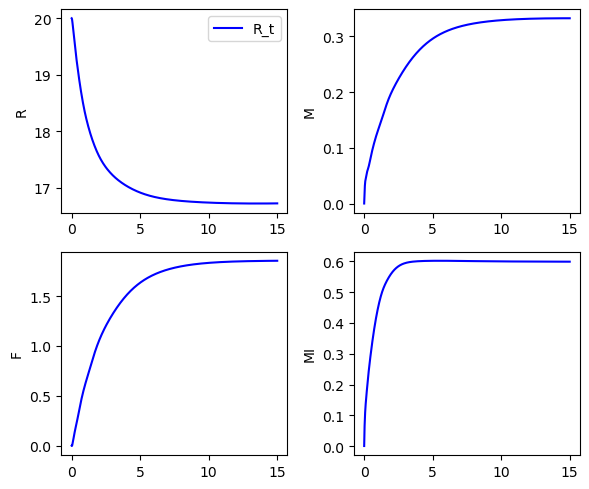

It 84000: loss = 8.36e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


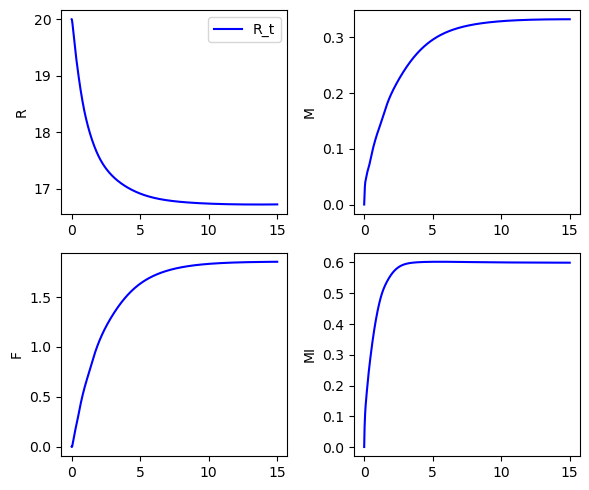

It 84500: loss = 8.64e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


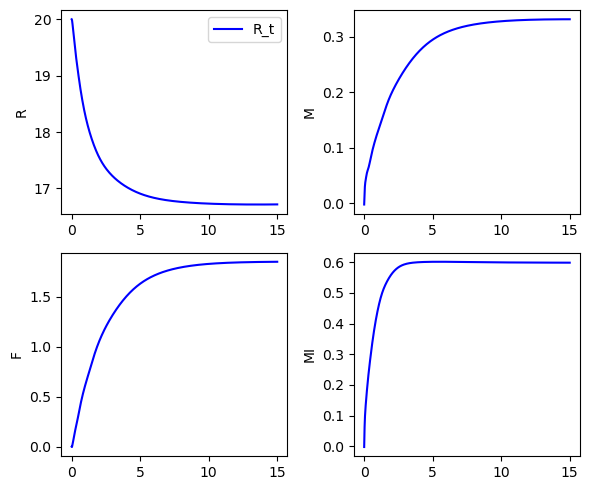

It 85000: loss = 9.35e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


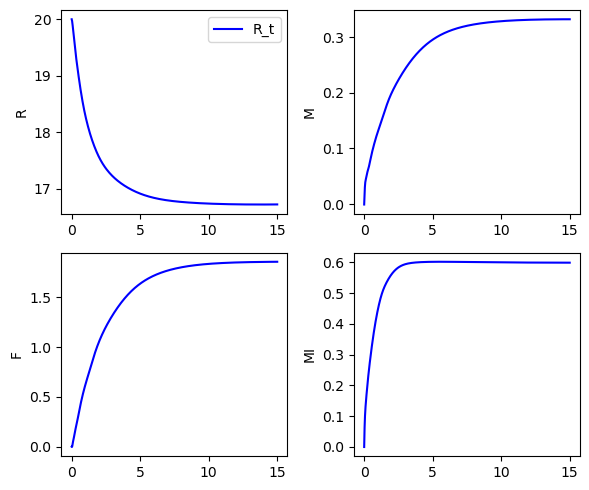

It 85500: loss = 8.66e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


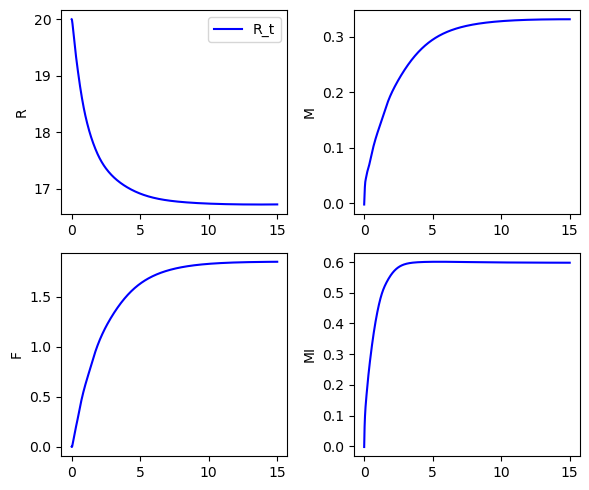

It 86000: loss = 8.36e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


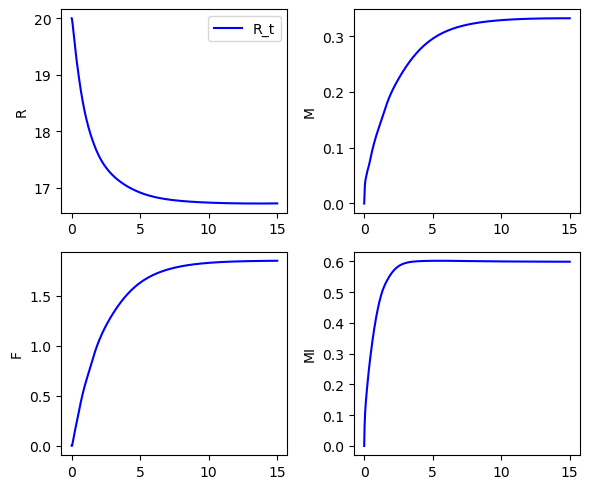

It 86500: loss = 4.15e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.03 0.02 0.02 0.02]


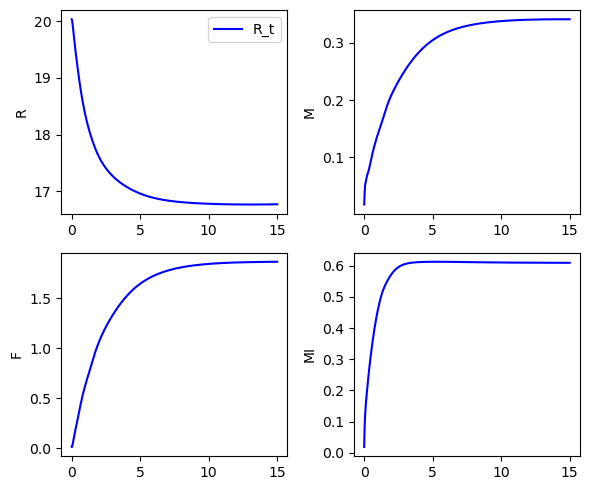

It 87000: loss = 9.53e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.00 -0.00 -0.00]


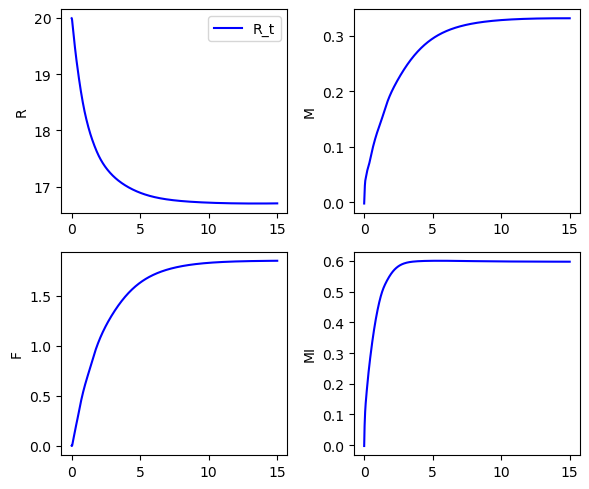

It 87500: loss = 8.36e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


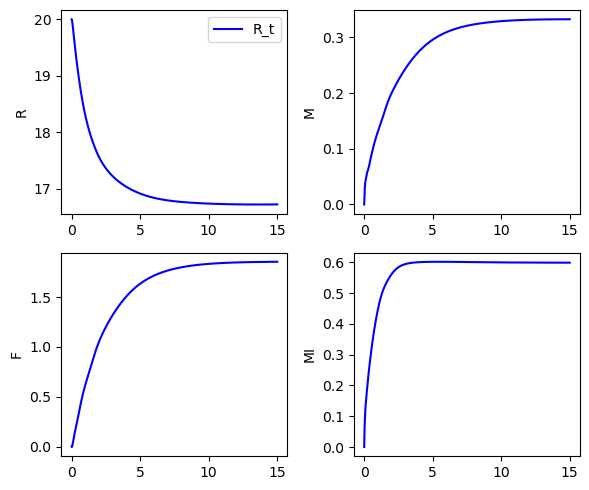

It 88000: loss = 8.83e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 -0.00 -0.00 0.00]


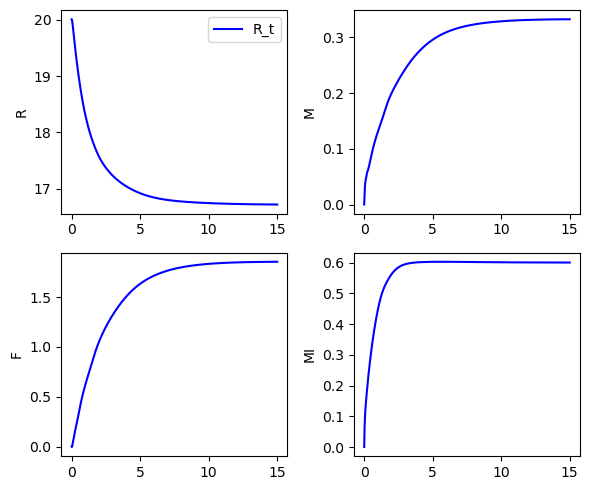

It 88500: loss = 8.36e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


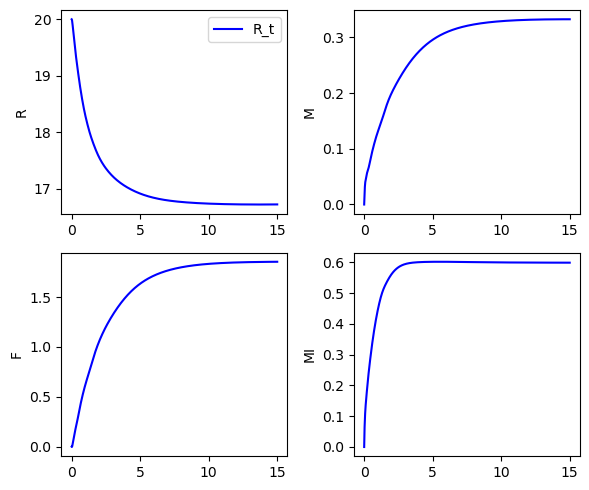

It 89000: loss = 8.74e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.00 0.00 0.00]


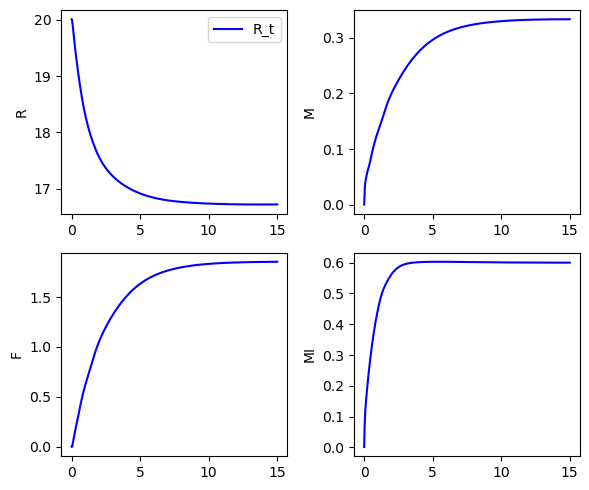

It 89500: loss = 8.37e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


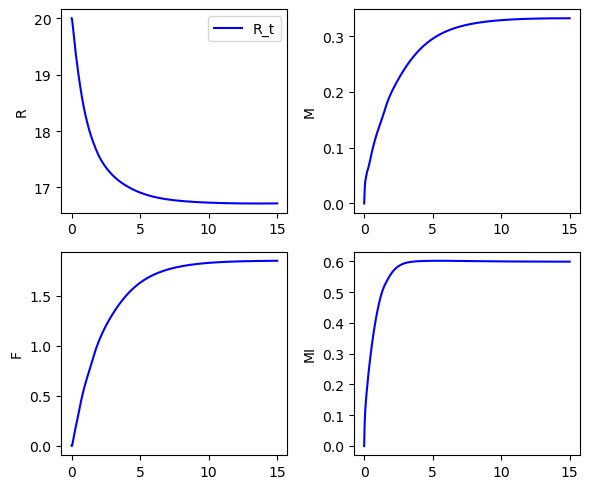

It 90000: loss = 8.36e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


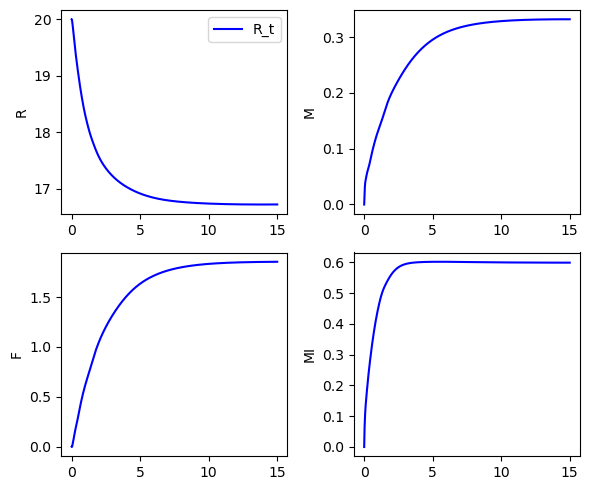

It 90500: loss = 8.38e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


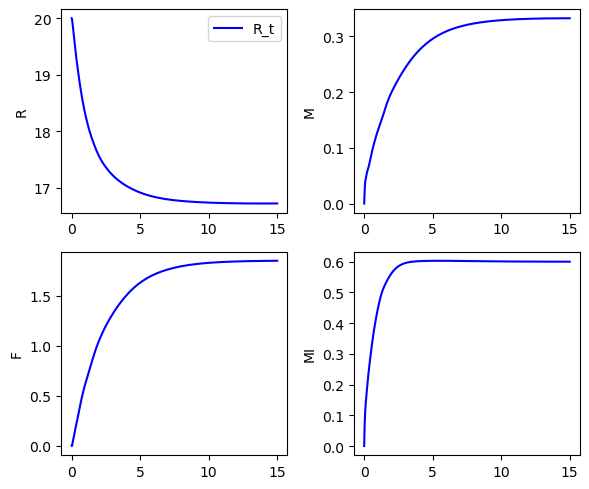

It 91000: loss = 8.60e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


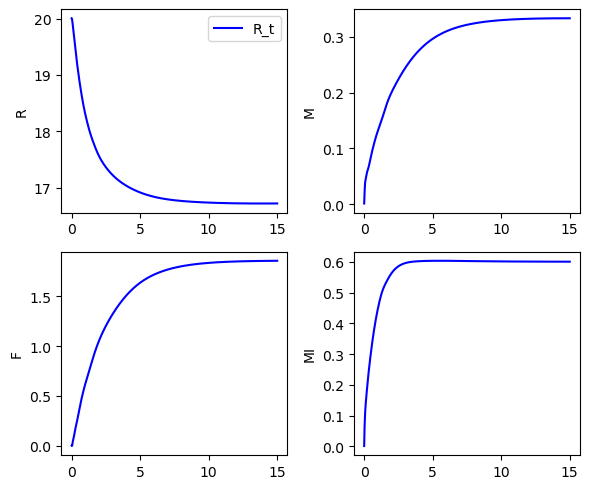

It 91500: loss = 1.85e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.98 -0.01 -0.01 -0.01]


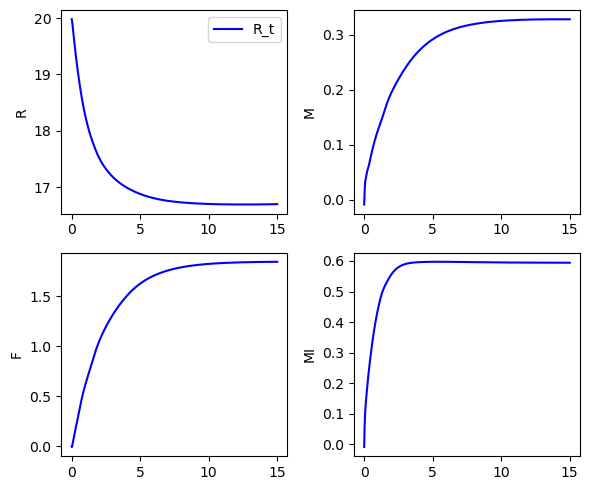

It 92000: loss = 1.53e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.01 0.01 0.01]


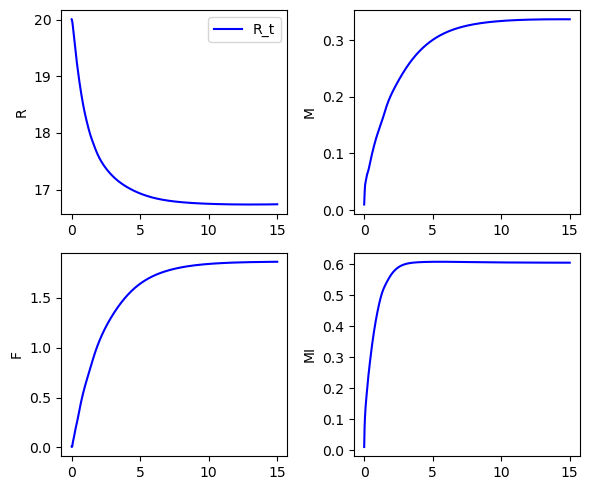

It 92500: loss = 8.39e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


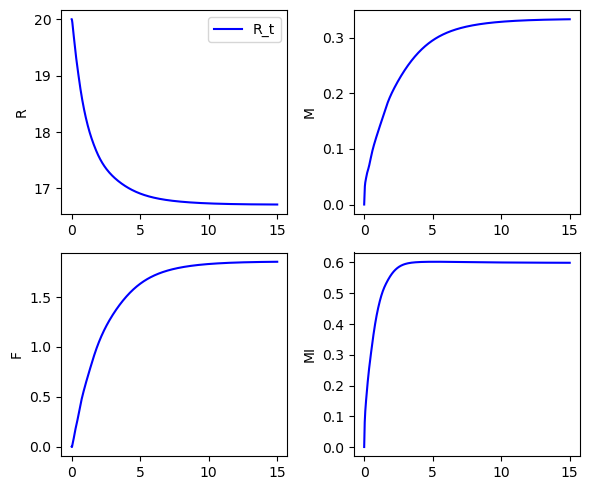

It 93000: loss = 8.37e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


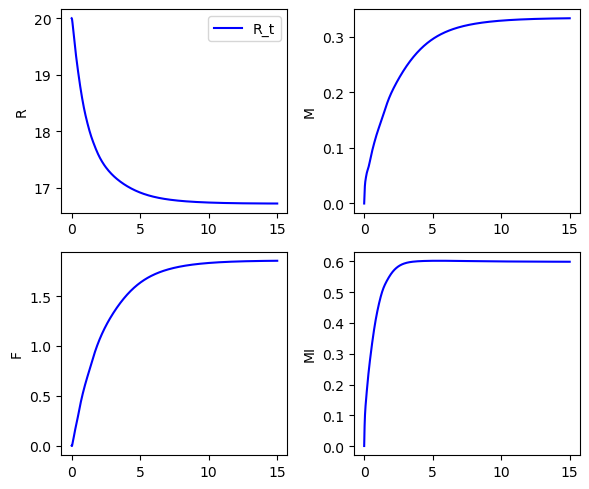

It 93500: loss = 8.36e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


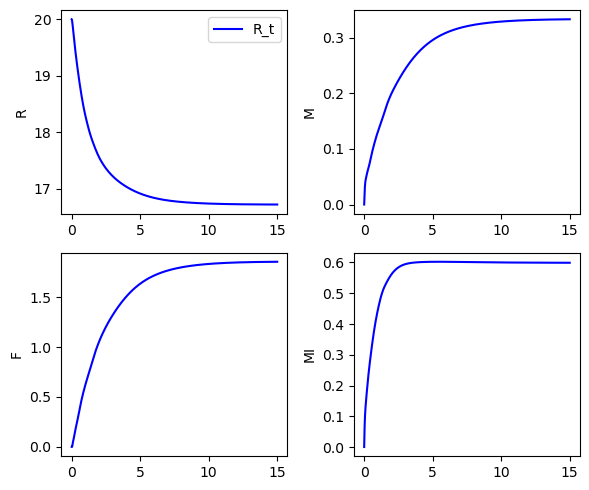

It 94000: loss = 9.96e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.01 -0.00 -0.01]


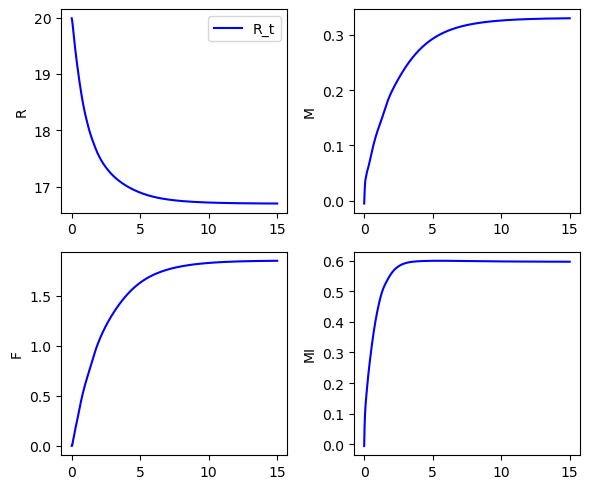

It 94500: loss = 9.68e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 0.00]


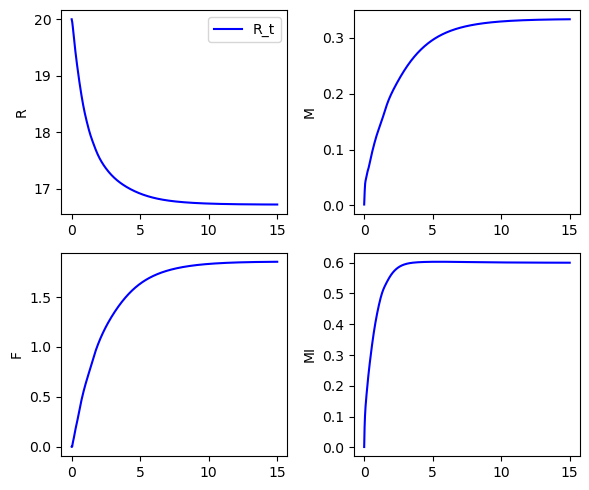

It 95000: loss = 8.36e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


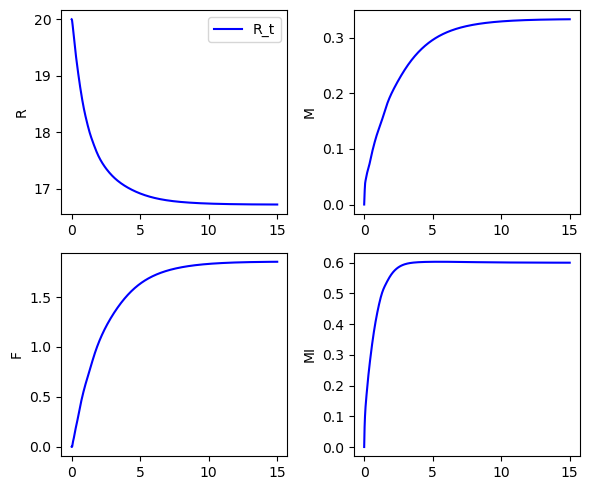

It 95500: loss = 1.18e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.01 -0.00 -0.01]


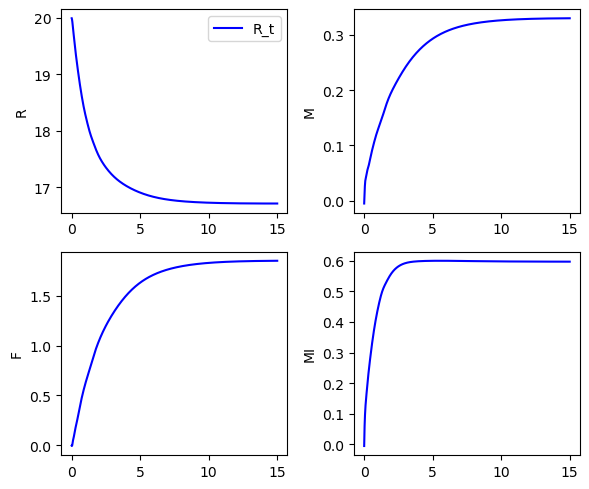

It 96000: loss = 2.42e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.01 -0.01 -0.01]


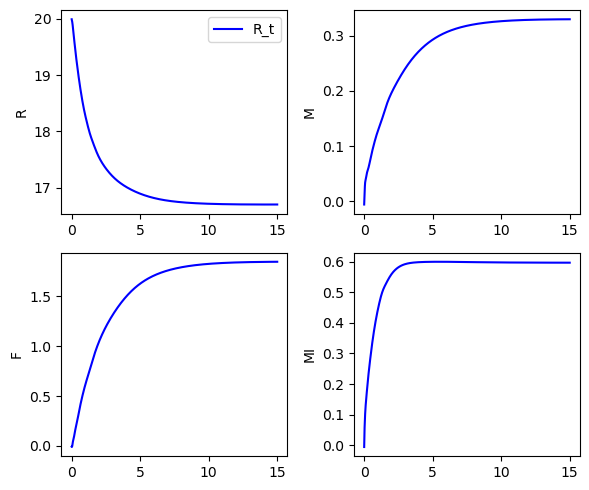

It 96500: loss = 8.37e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 -0.00]


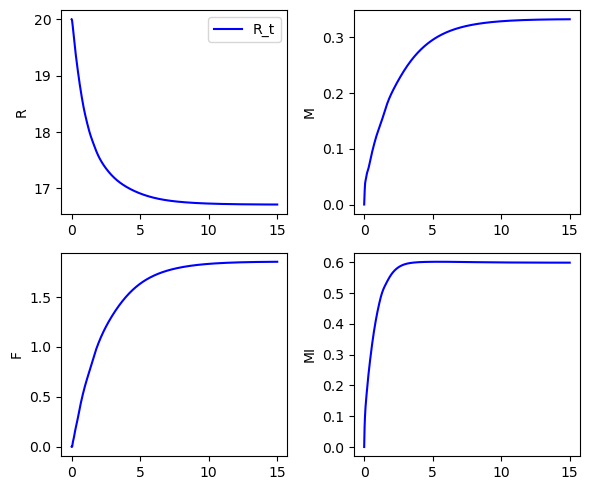

It 97000: loss = 8.35e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


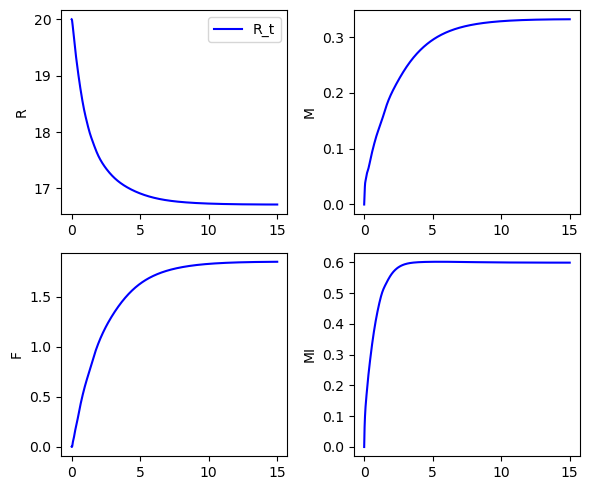

It 97500: loss = 1.41e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.00 0.00 0.00]


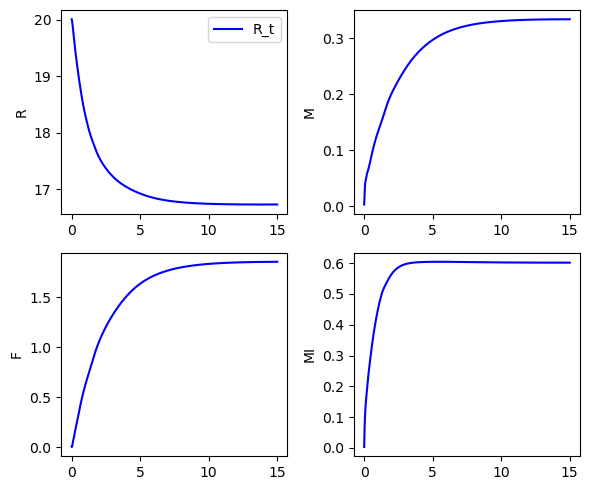

It 98000: loss = 8.47e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 0.00]


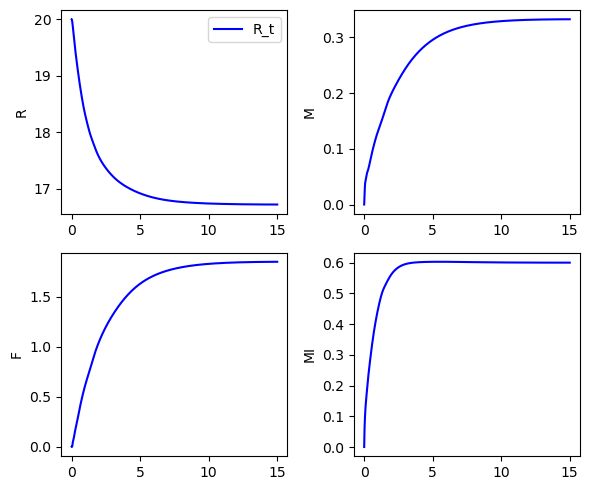

It 98500: loss = 8.54e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


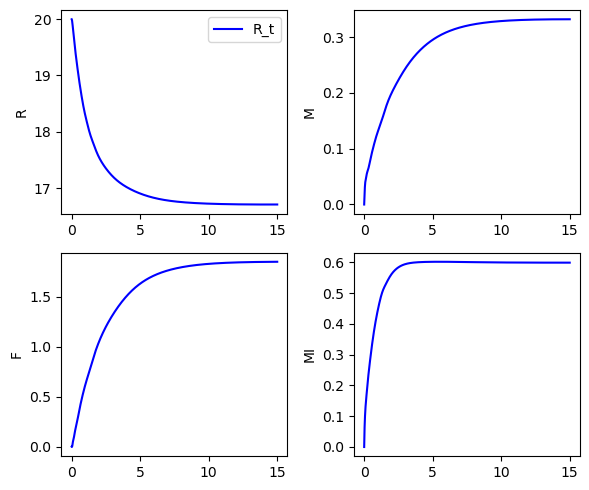

It 99000: loss = 1.11e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.01 -0.01 -0.01]


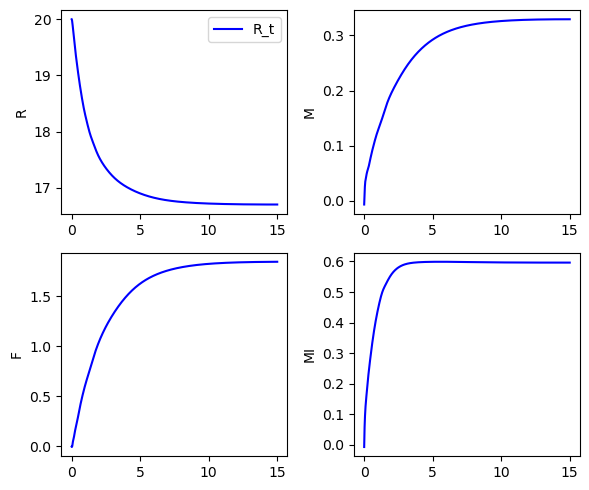

It 99500: loss = 9.16e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.00 -0.00 0.00]


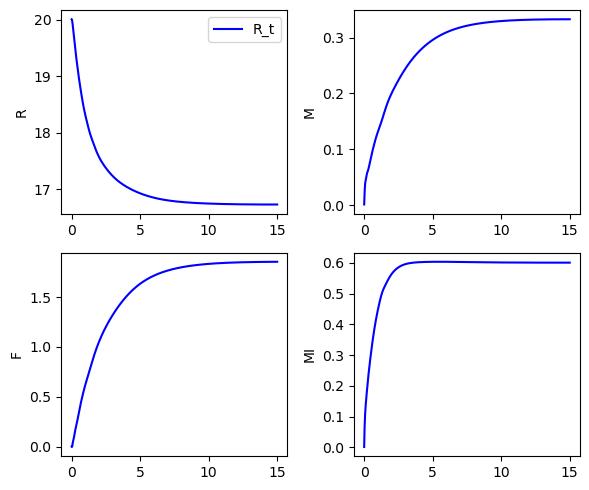

It 100000: loss = 9.00e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.00 0.00 0.00]


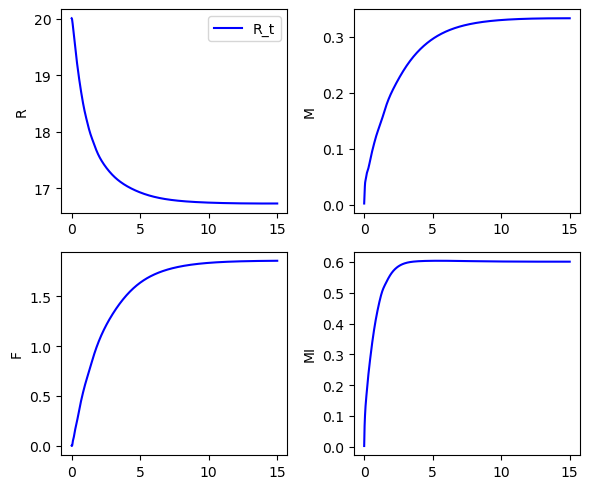

It 100500: loss = 8.68e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.00 0.00 0.00]


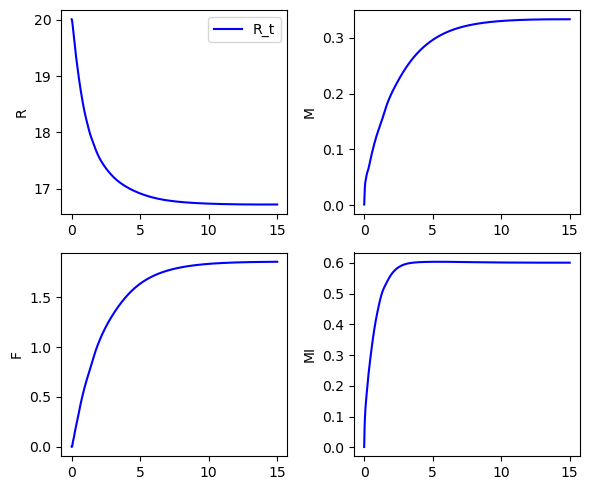

It 101000: loss = 8.78e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.00 -0.00 -0.00]


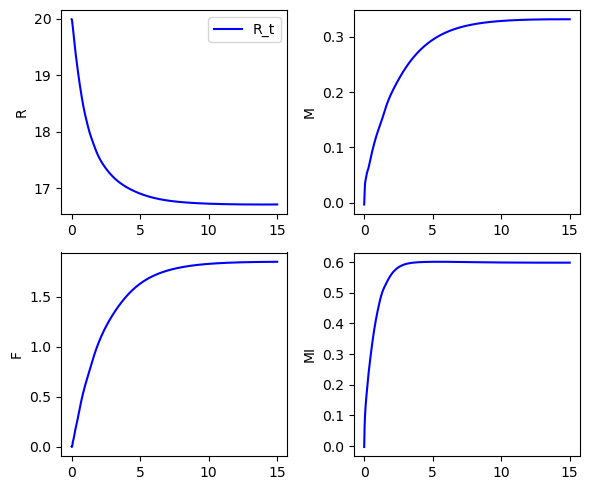

It 101500: loss = 8.35e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


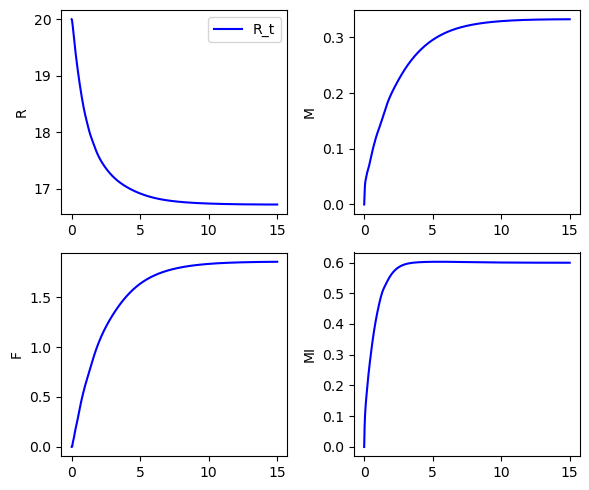

It 102000: loss = 8.34e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


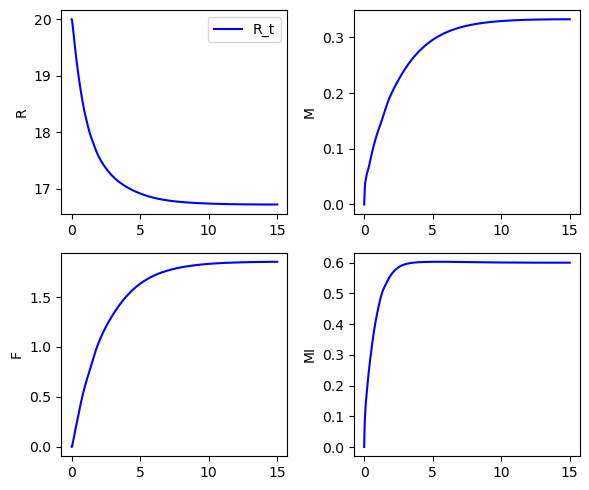

It 102500: loss = 4.39e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.04 0.02 0.02 0.02]


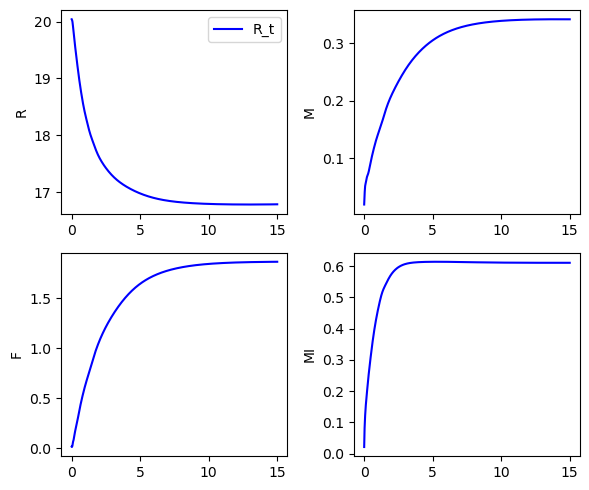

It 103000: loss = 1.07e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.01 0.00 0.01]


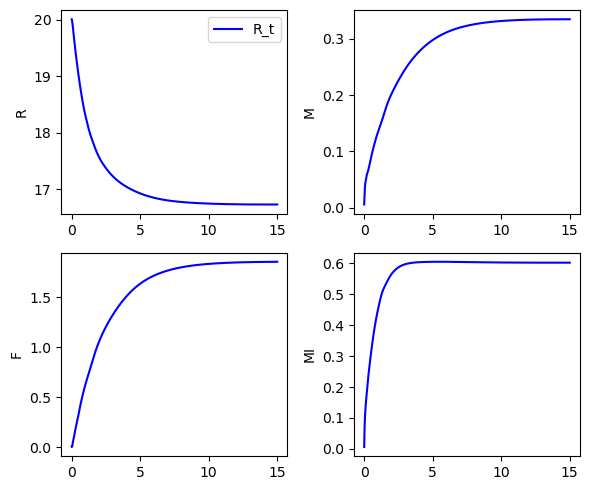

It 103500: loss = 8.45e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


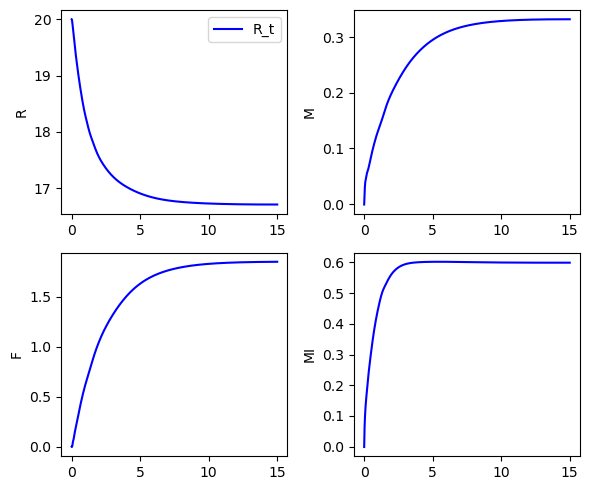

It 104000: loss = 8.41e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


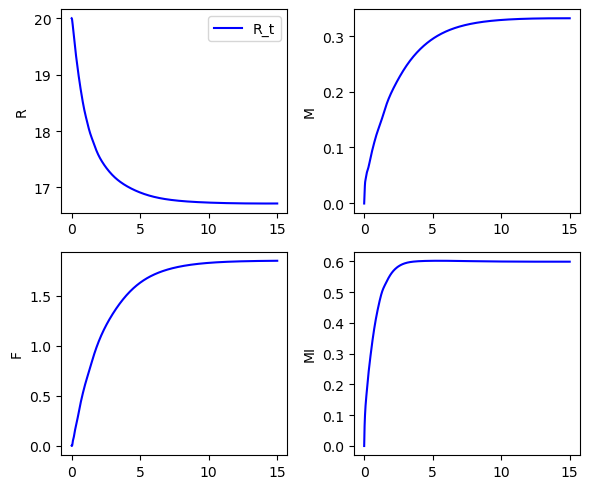

It 104500: loss = 1.18e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.01 0.01 0.01]


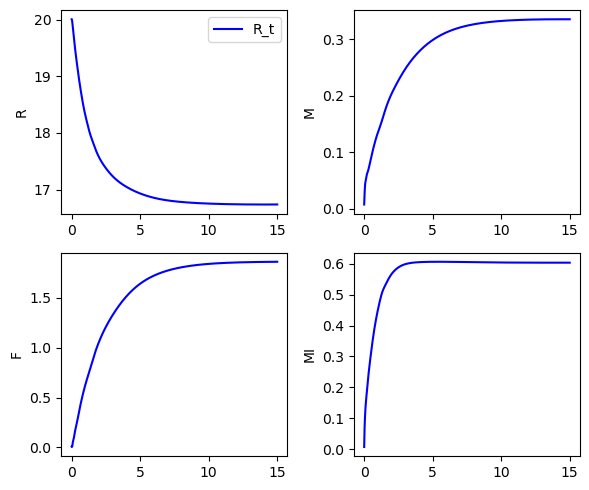

It 105000: loss = 2.75e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.02 0.01 0.01 0.01]


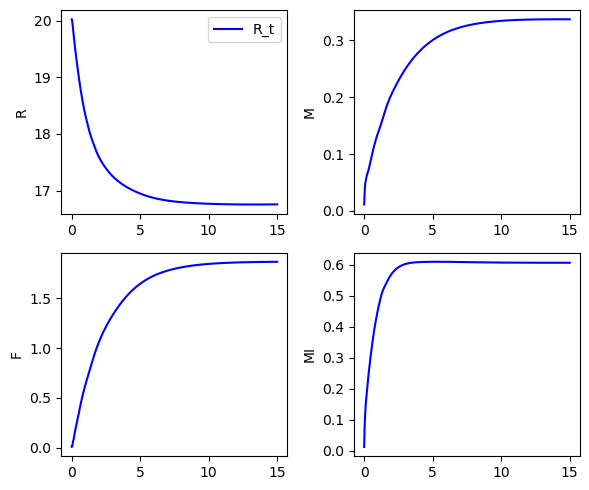

It 105500: loss = 1.33e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.01 0.01 0.01]


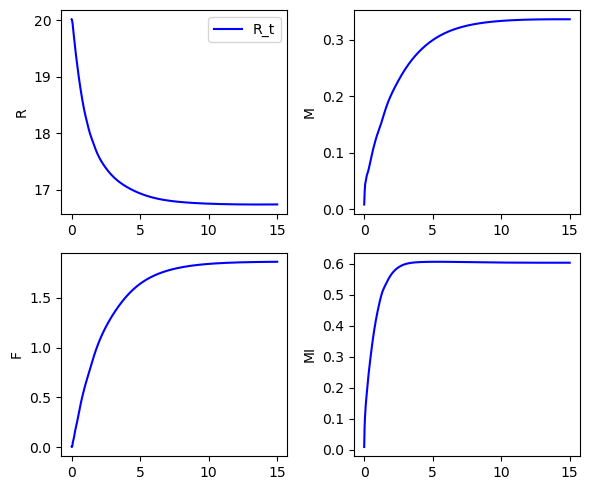

It 106000: loss = 8.41e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


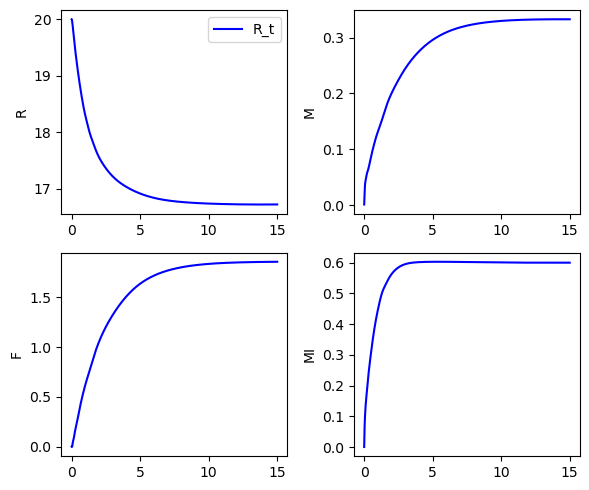

It 106500: loss = 8.40e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


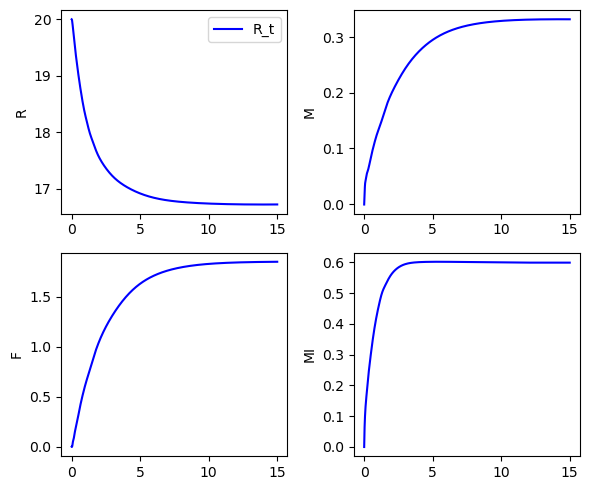

It 107000: loss = 1.12e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 -0.00 -0.00 -0.00]


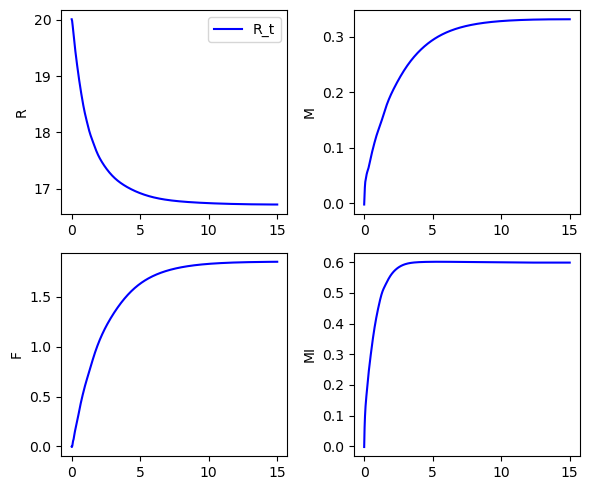

It 107500: loss = 9.59e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.00 0.00 0.00]


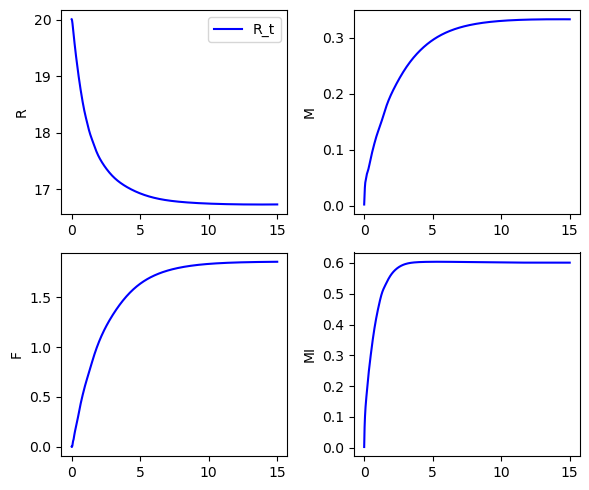

It 108000: loss = 1.28e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.01 0.00 0.01]


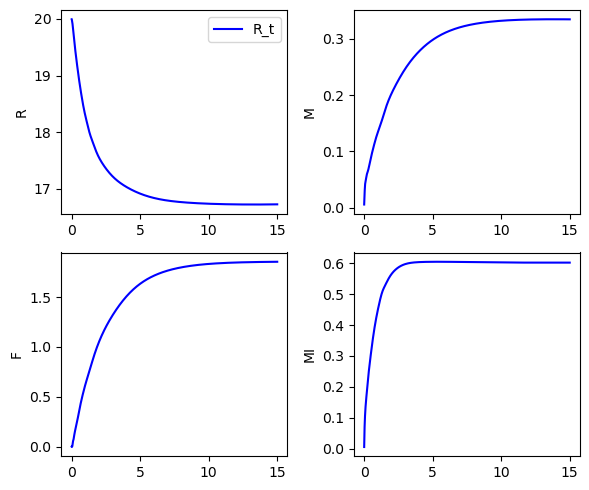

It 108500: loss = 1.39e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.02 0.01 0.01 0.01]


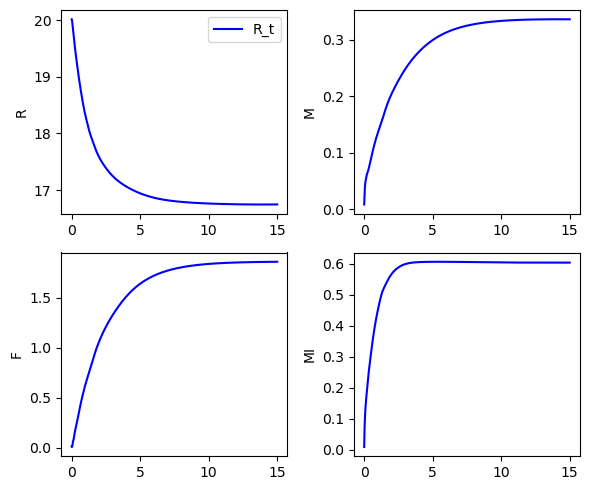

It 109000: loss = 8.86e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 0.00 -0.00 0.00]


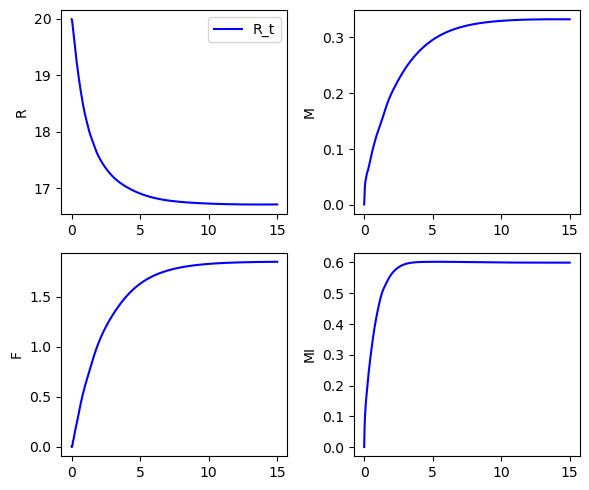

It 109500: loss = 1.21e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.01 -0.01 -0.01]


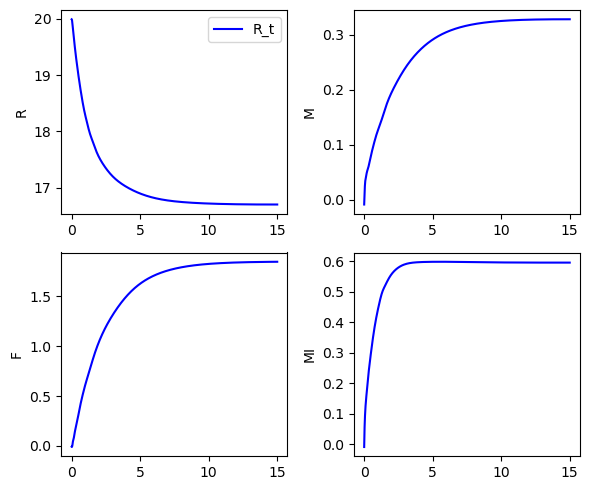

It 110000: loss = 8.35e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


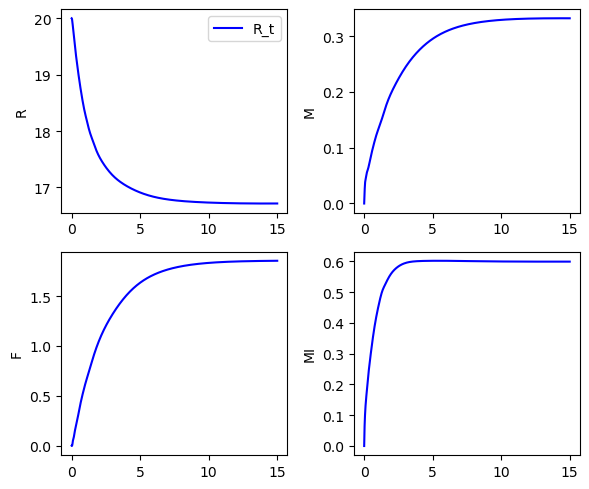

It 110500: loss = 9.41e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.00 -0.00 -0.00]


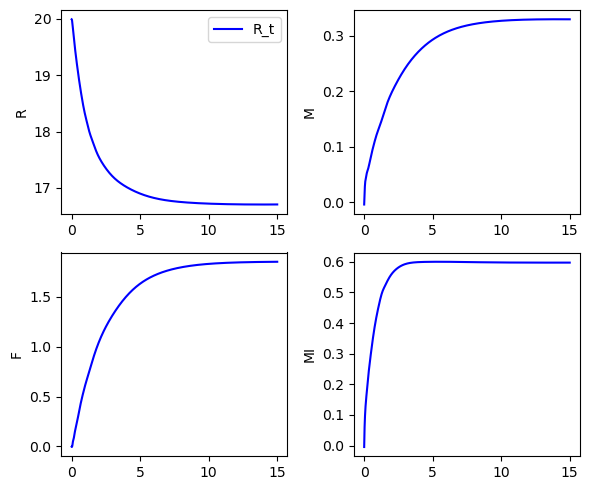

It 111000: loss = 8.43e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 0.00]


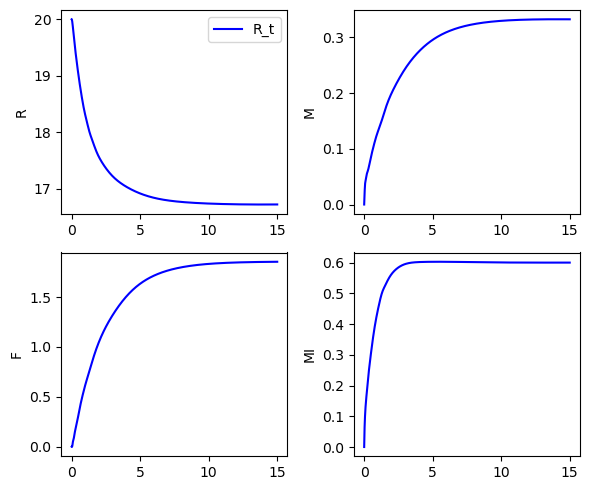

It 111500: loss = 1.09e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.01 -0.00 -0.01]


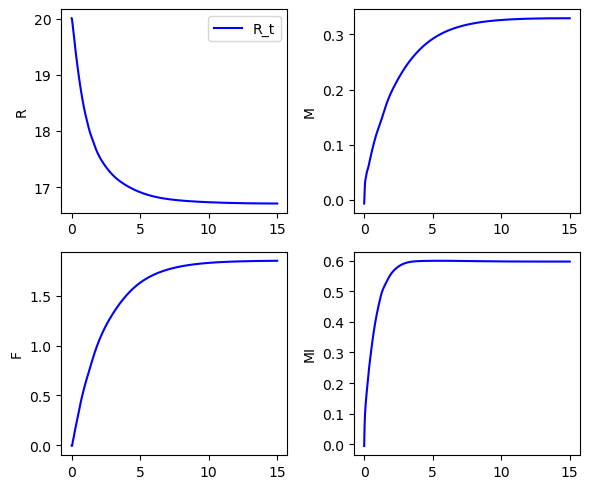

It 112000: loss = 8.57e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


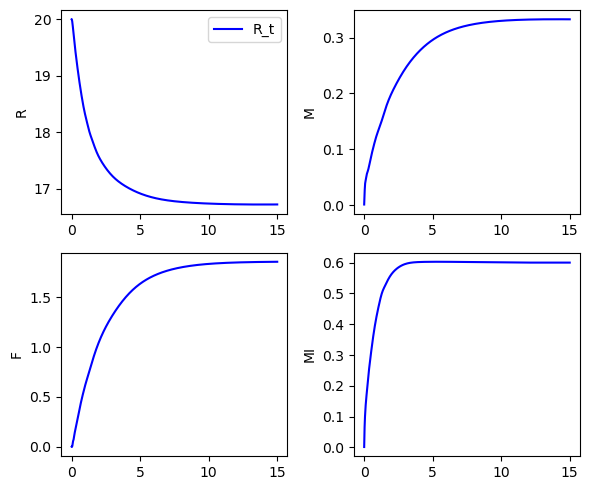

It 112500: loss = 9.26e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


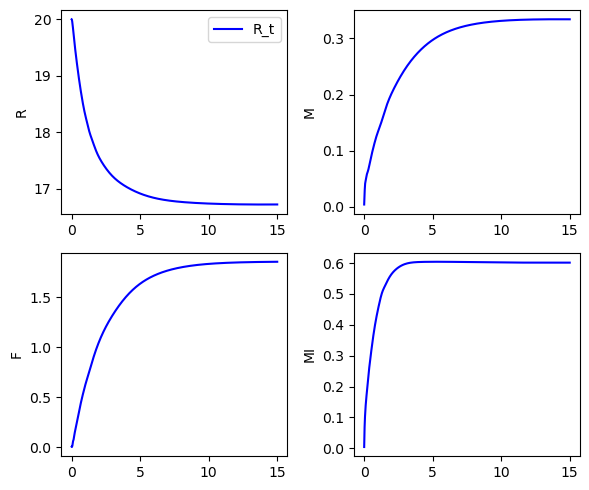

It 113000: loss = 8.61e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 0.00]


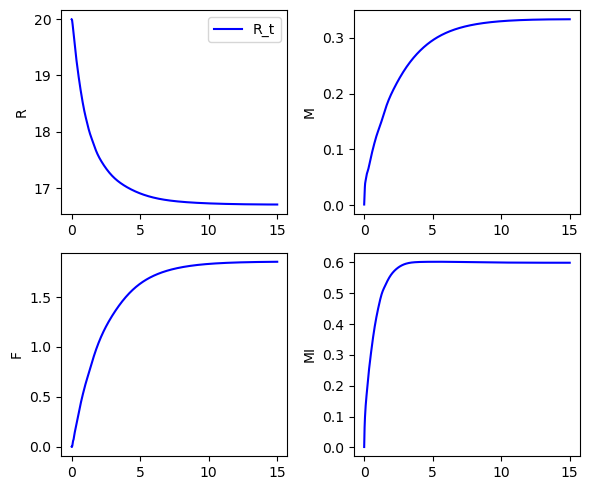

It 113500: loss = 1.90e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 0.01 0.02 0.01]


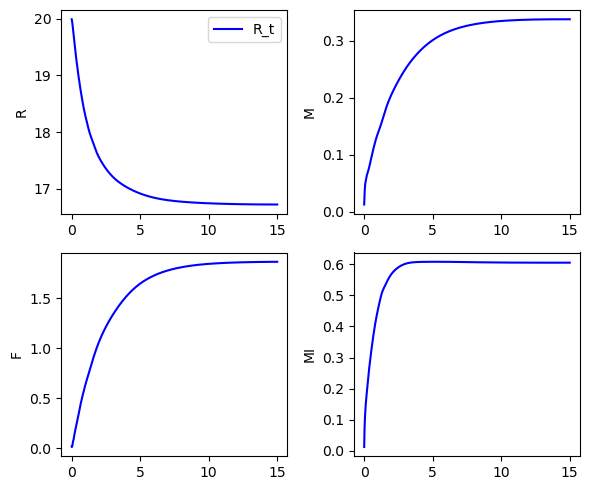

It 114000: loss = 9.30e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 -0.00 -0.00 -0.00]


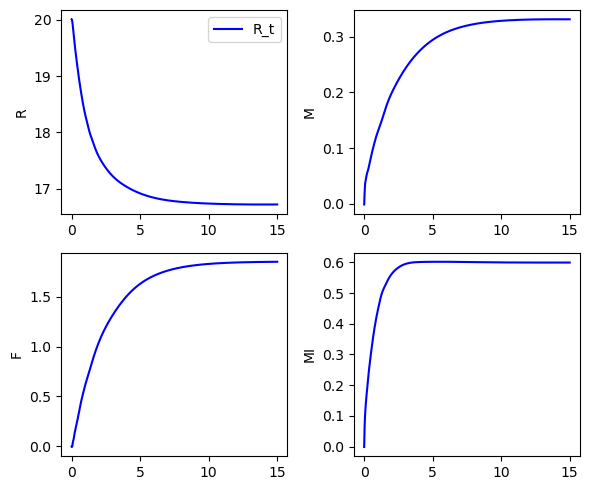

It 114500: loss = 9.29e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.00 -0.00 -0.00]


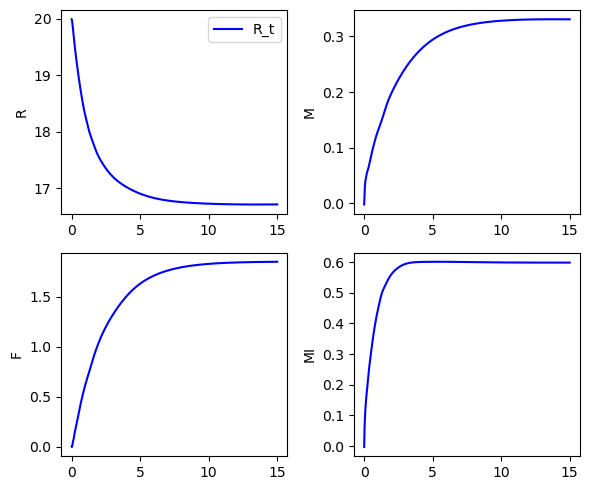

It 115000: loss = 1.74e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.98 0.00 0.00 0.00]


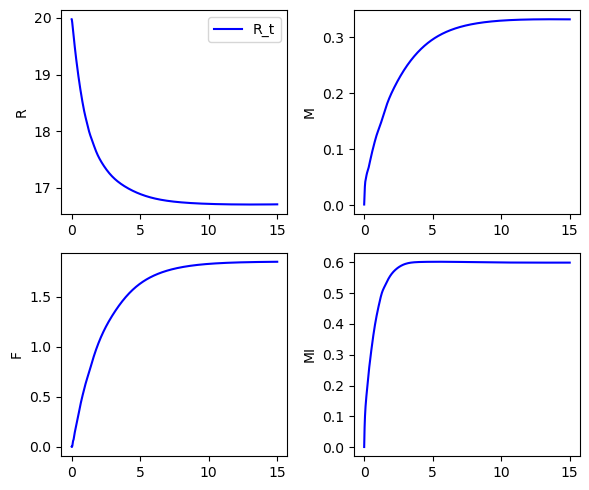

It 115500: loss = 8.42e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


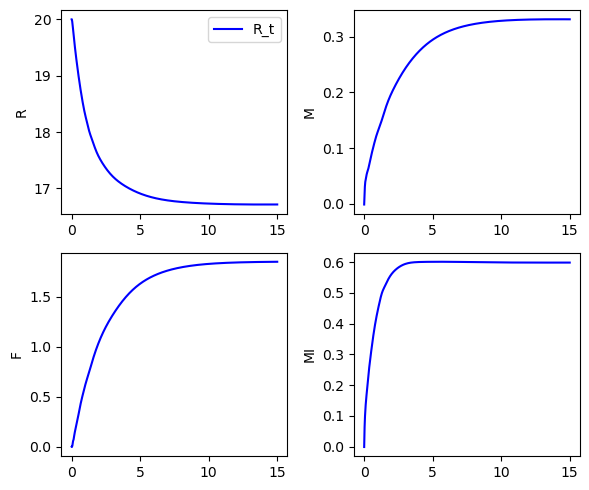

It 116000: loss = 8.33e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


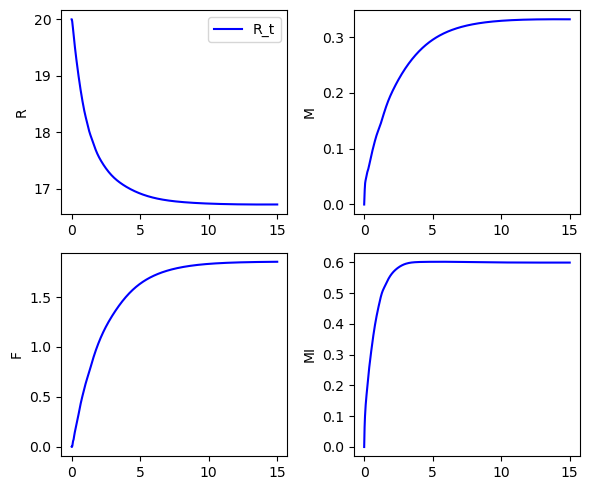

It 116500: loss = 8.60e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


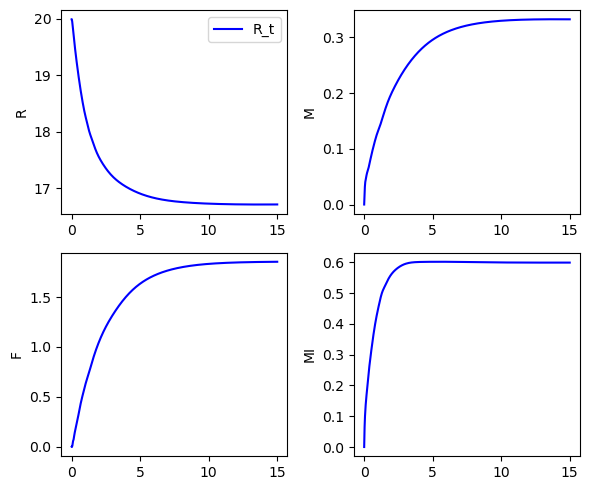

It 117000: loss = 8.88e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.00 -0.00 -0.00]


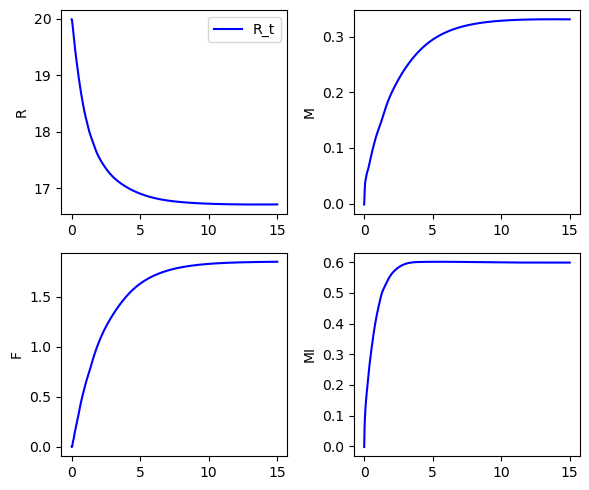

It 117500: loss = 1.04e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.00 -0.00 -0.00]


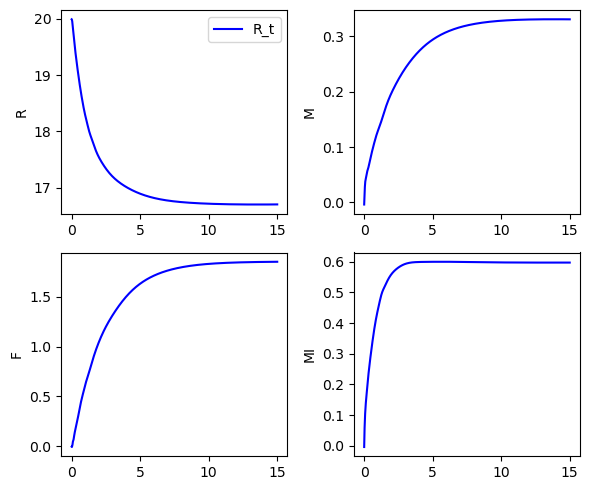

It 118000: loss = 1.91e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.02 0.01 0.01 0.01]


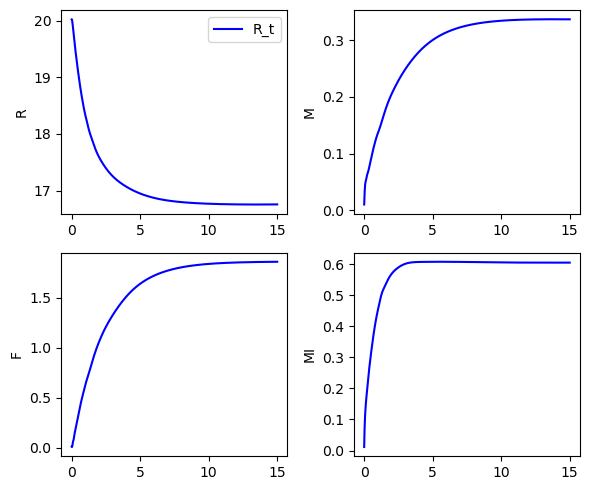

It 118500: loss = 8.43e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


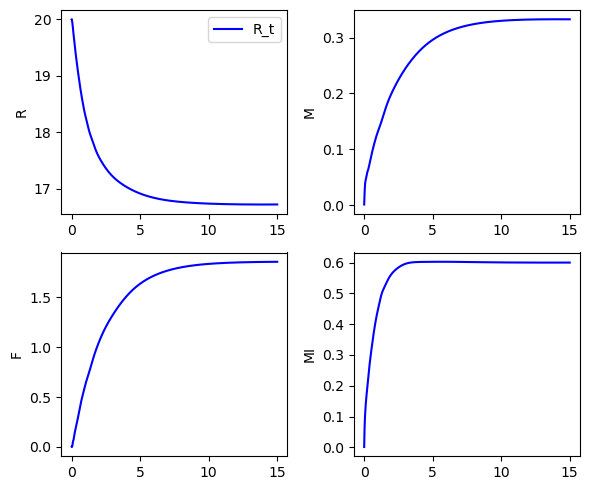

It 119000: loss = 8.33e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


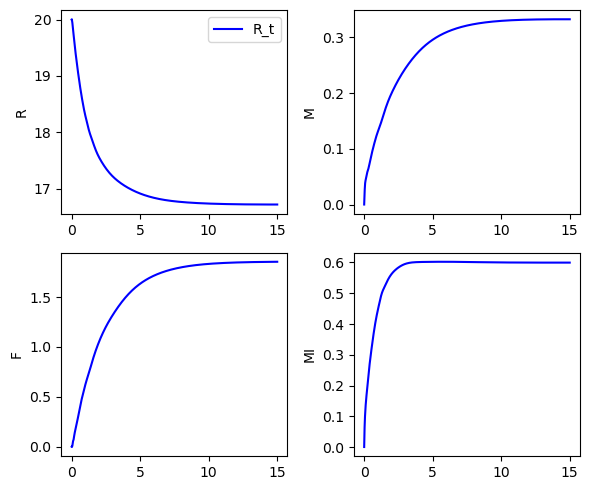

It 119500: loss = 8.36e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


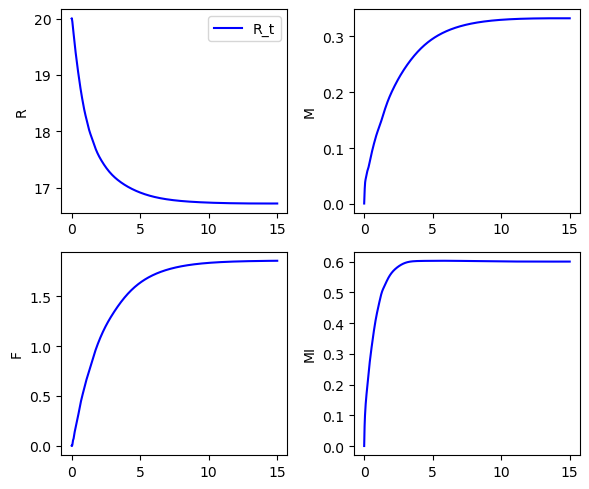

It 120000: loss = 8.33e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


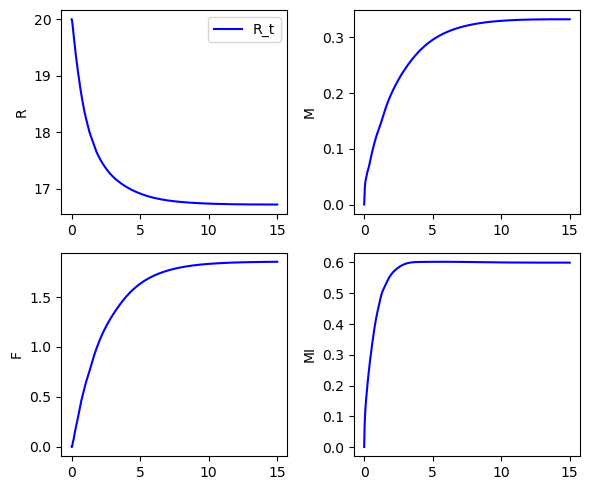

It 120500: loss = 1.51e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.02 -0.01 -0.01 -0.00]


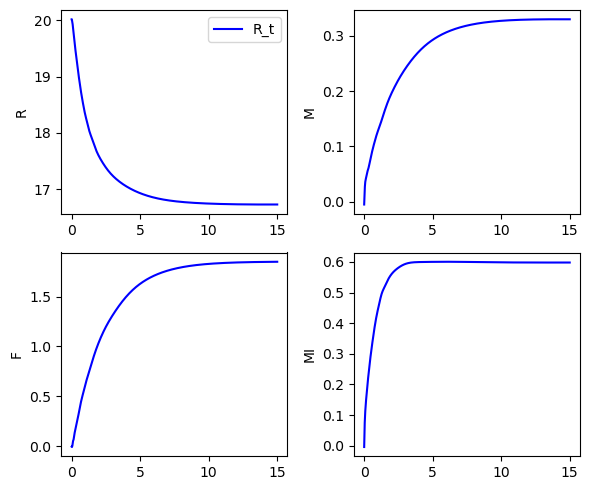

It 121000: loss = 8.32e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


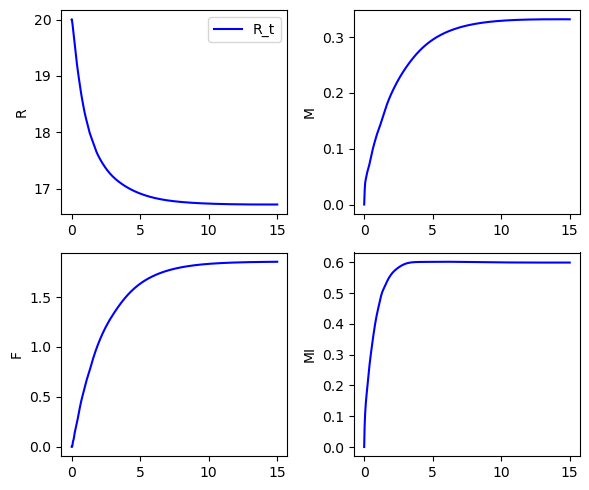

It 121500: loss = 8.87e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.00 -0.00 -0.00]


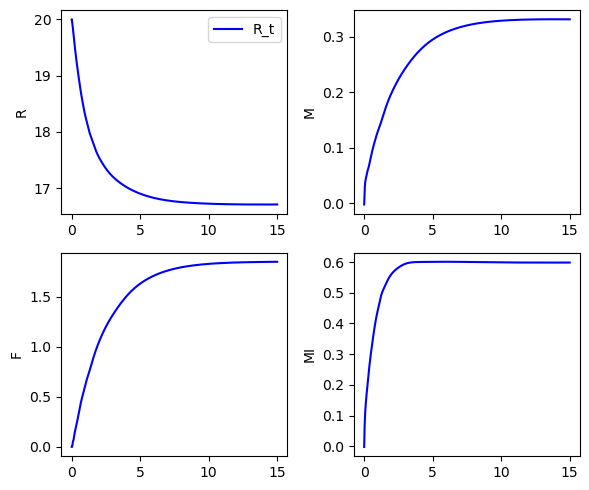

It 122000: loss = 8.40e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


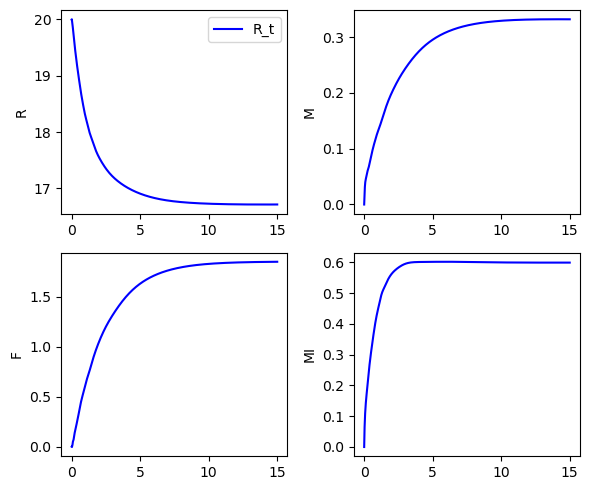

It 122500: loss = 8.31e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


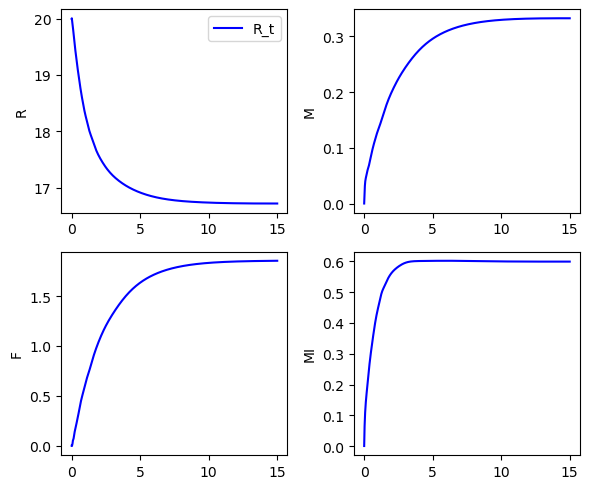

It 123000: loss = 8.31e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


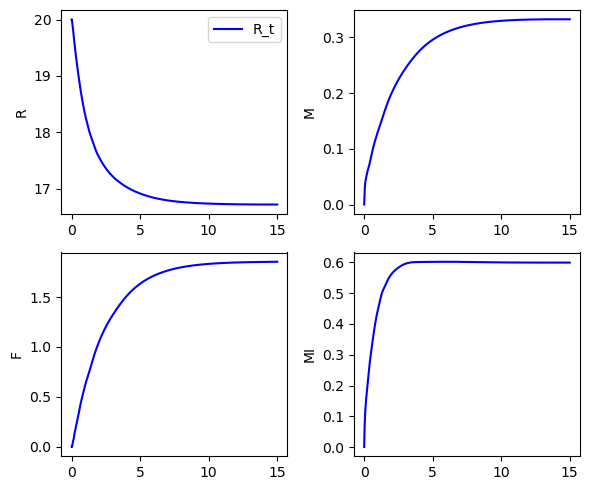

It 123500: loss = 9.47e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 -0.00 -0.00 -0.00]


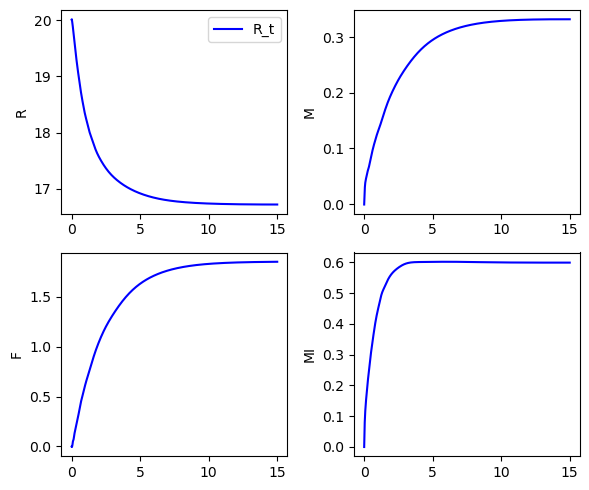

It 124000: loss = 1.02e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 0.01 -0.00 0.01]


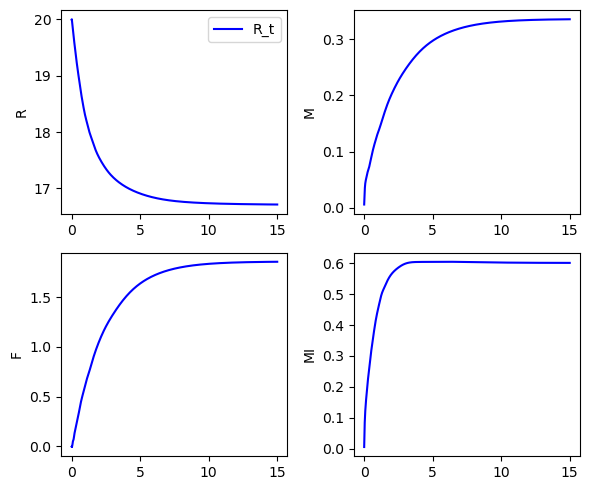

It 124500: loss = 8.31e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


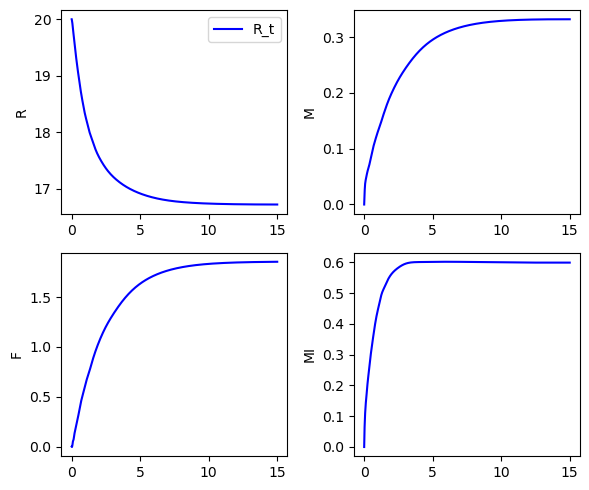

It 125000: loss = 8.73e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


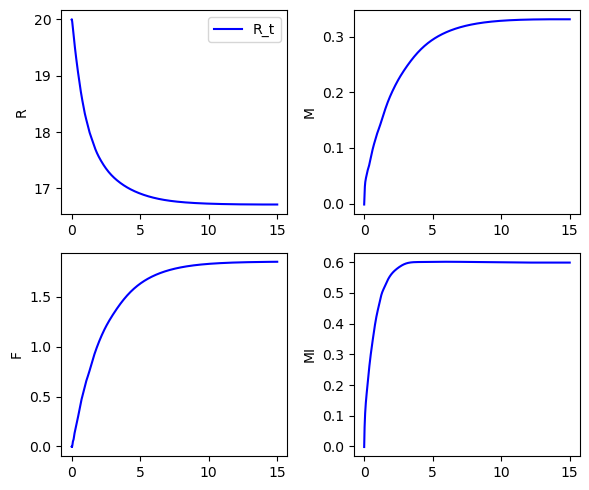

It 125500: loss = 8.88e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


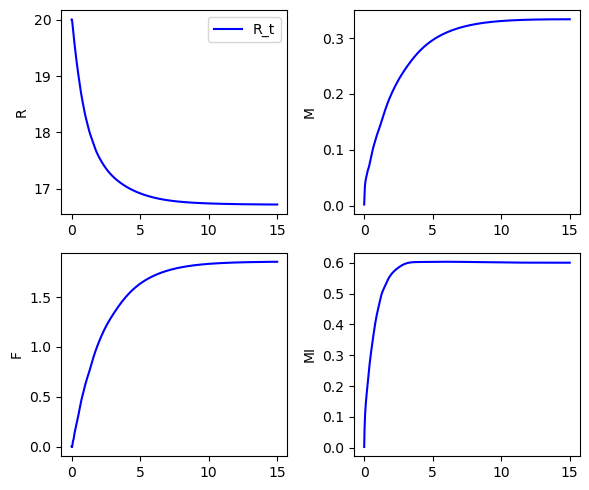

It 126000: loss = 8.30e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


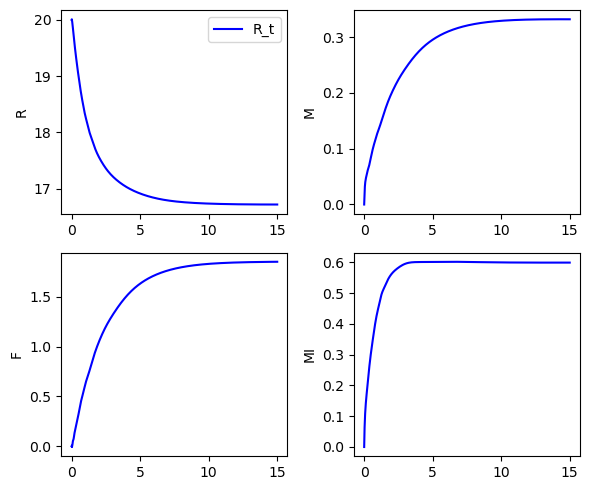

It 126500: loss = 1.05e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 0.00 0.00 0.00]


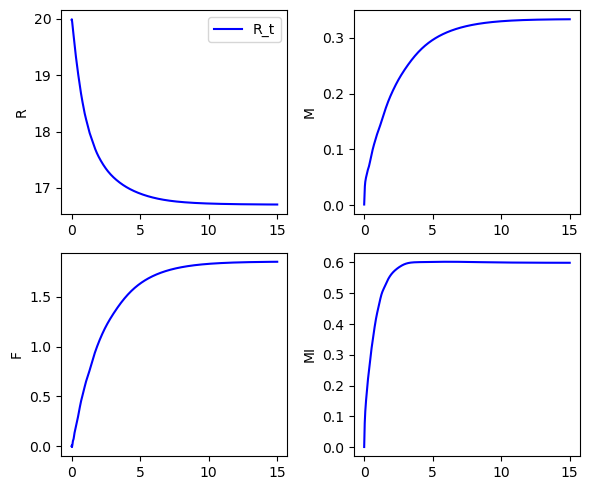

It 127000: loss = 2.31e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.98 0.01 0.01 0.01]


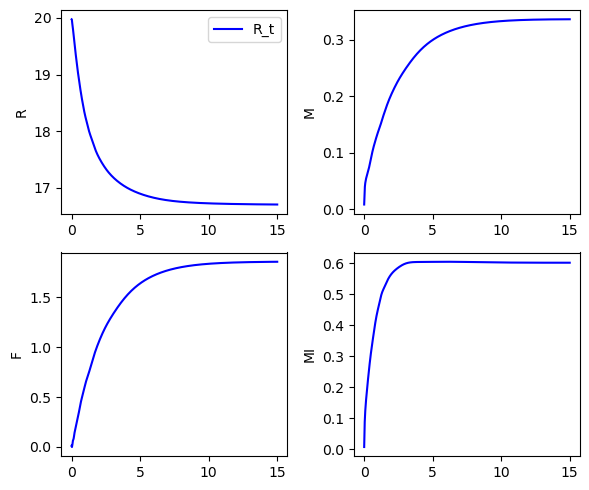

It 127500: loss = 1.25e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 0.00 0.00 0.00]


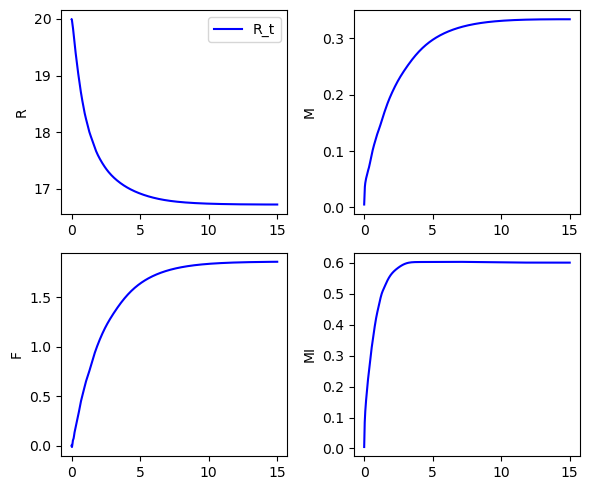

It 128000: loss = 8.44e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 0.00]


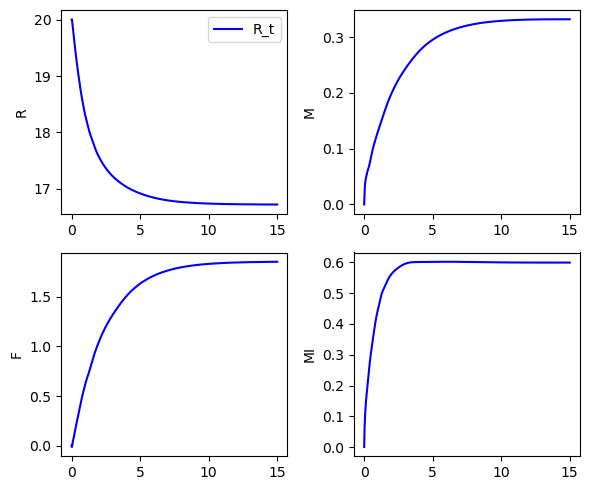

It 128500: loss = 8.30e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 -0.00]


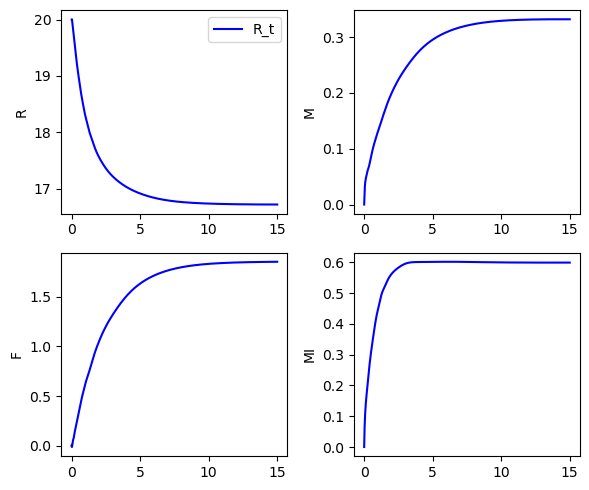

It 129000: loss = 8.33e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


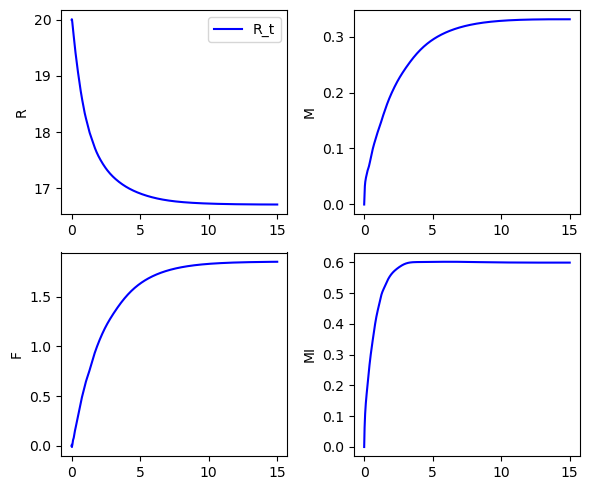

It 129500: loss = 3.69e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 0.03 0.02 0.03]


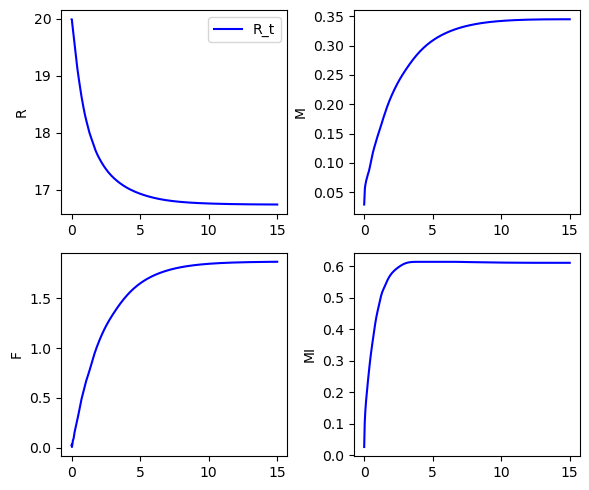

It 130000: loss = 1.06e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.01 0.01 0.01]


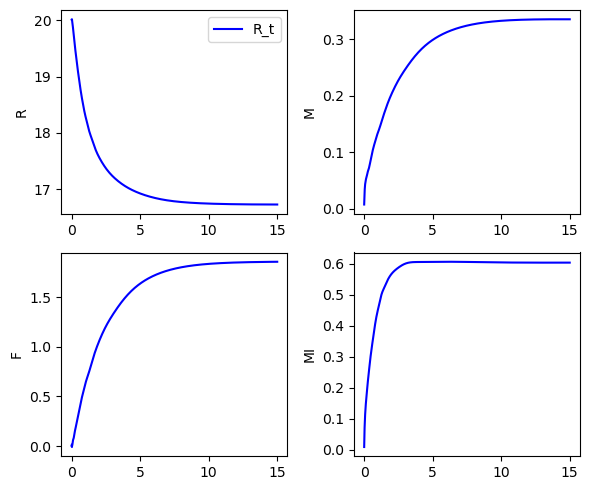

It 130500: loss = 8.30e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


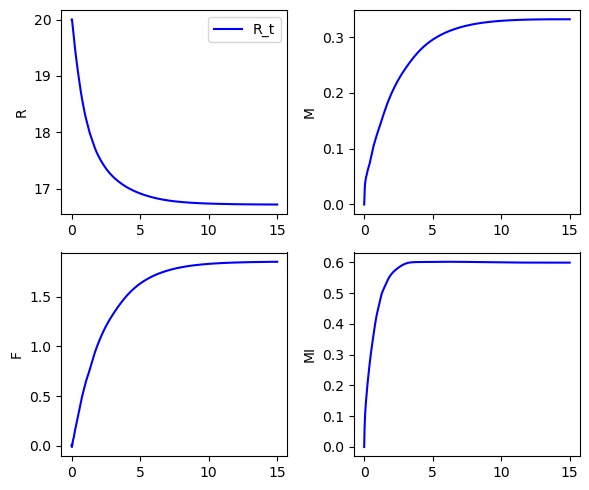

It 131000: loss = 8.30e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


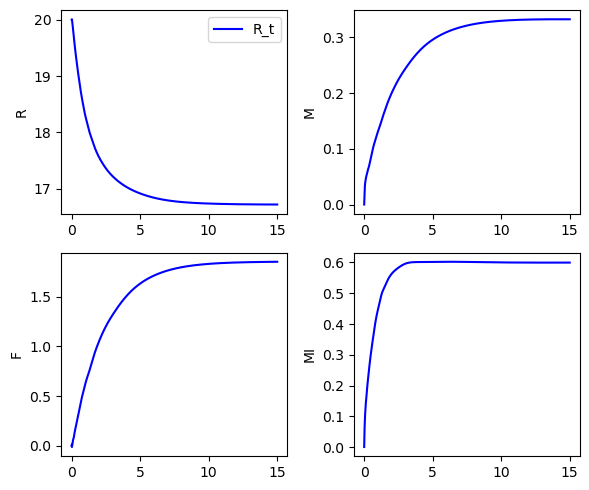

It 131500: loss = 8.30e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


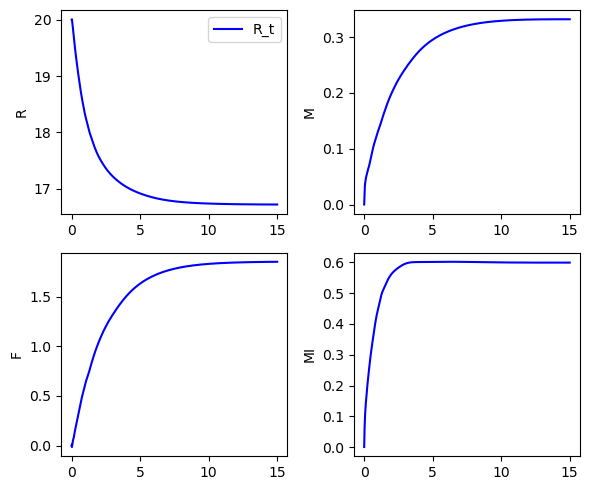

It 132000: loss = 1.21e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.00 0.00 0.00]


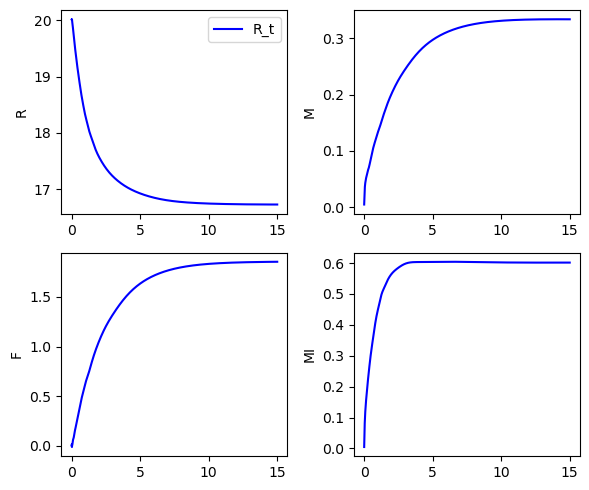

It 132500: loss = 8.30e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


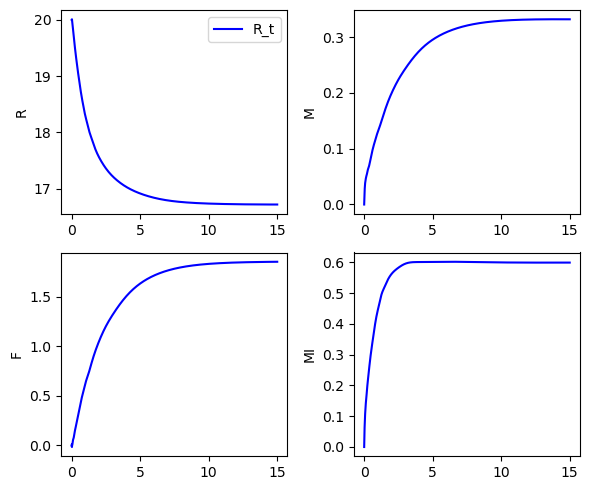

It 133000: loss = 8.30e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


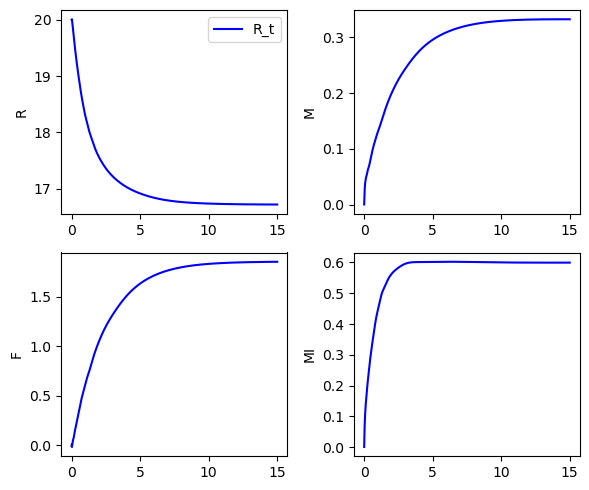

It 133500: loss = 8.29e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


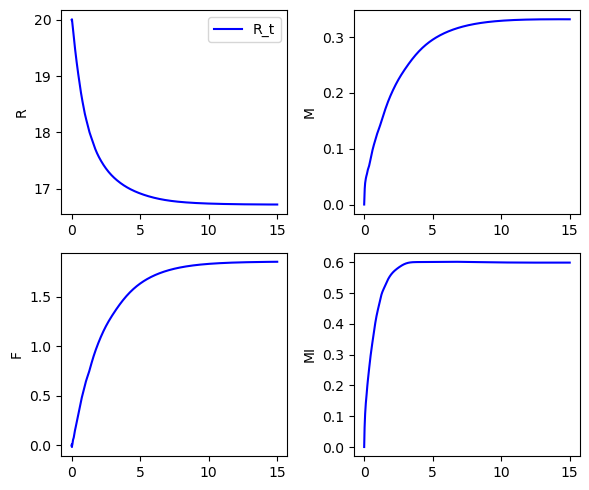

It 134000: loss = 1.06e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 0.00]


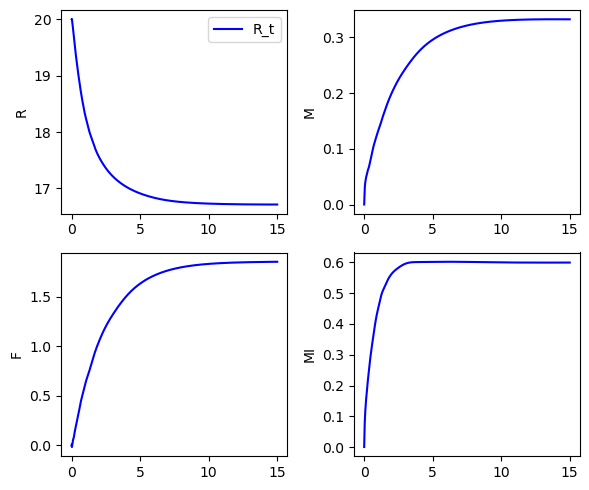

It 134500: loss = 8.37e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


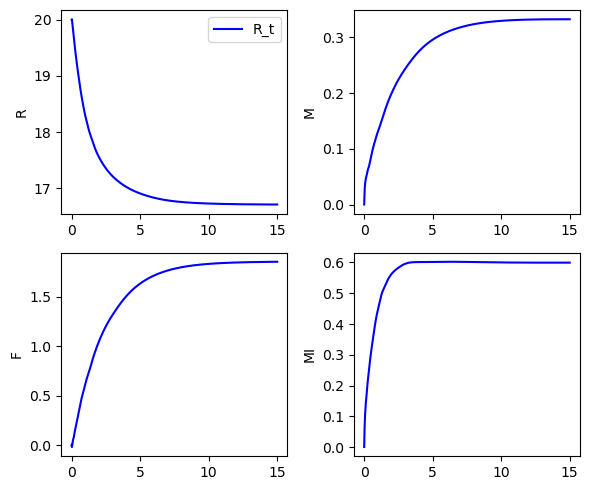

It 135000: loss = 1.12e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.00 -0.00 0.00]


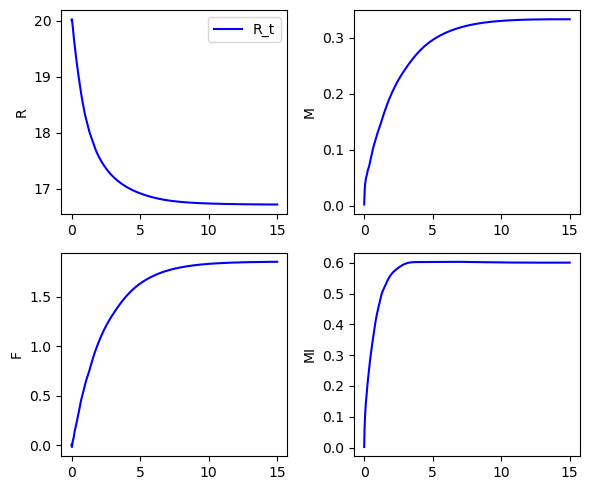

It 135500: loss = 8.45e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


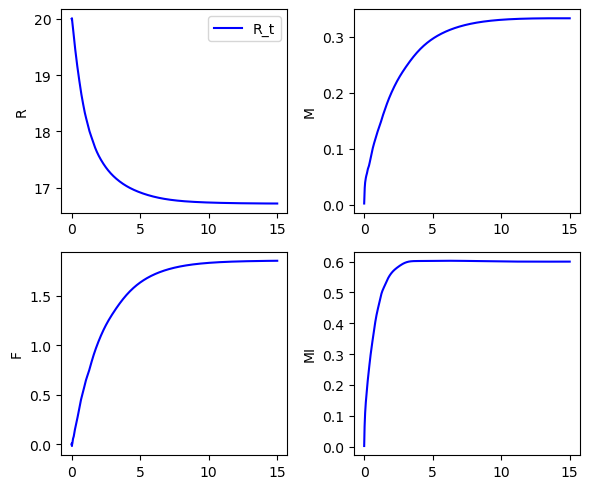

It 136000: loss = 8.30e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


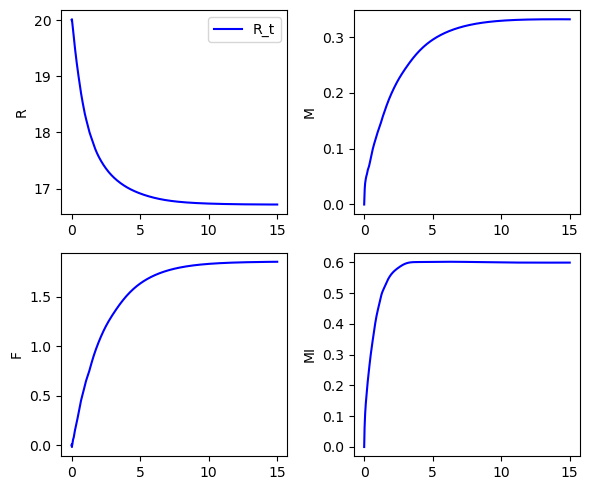

It 136500: loss = 9.16e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 -0.01 -0.00 -0.00]


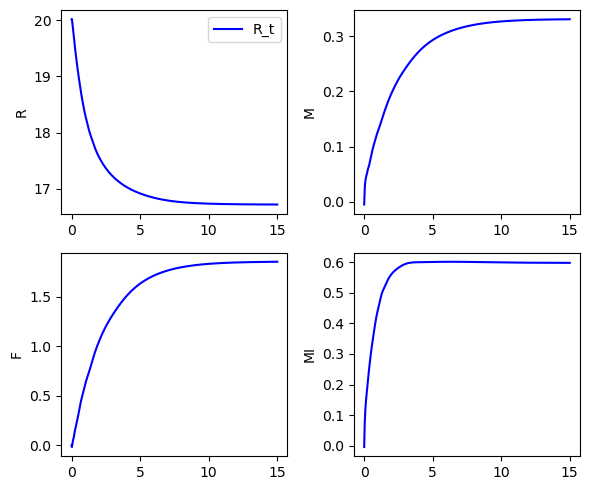

It 137000: loss = 1.17e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.01 -0.01 -0.01]


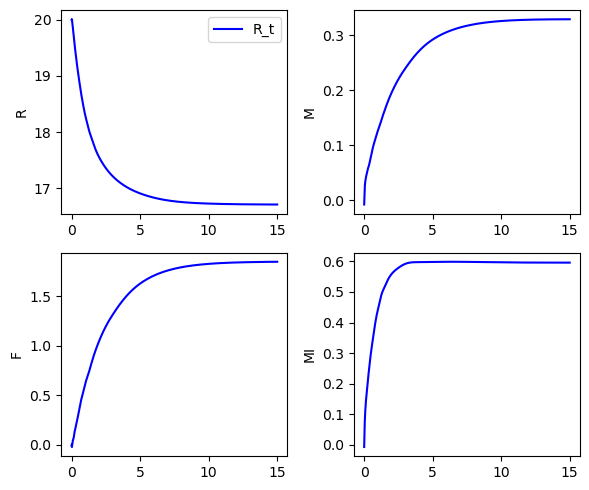

It 137500: loss = 1.82e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.97 0.00 -0.00 -0.00]


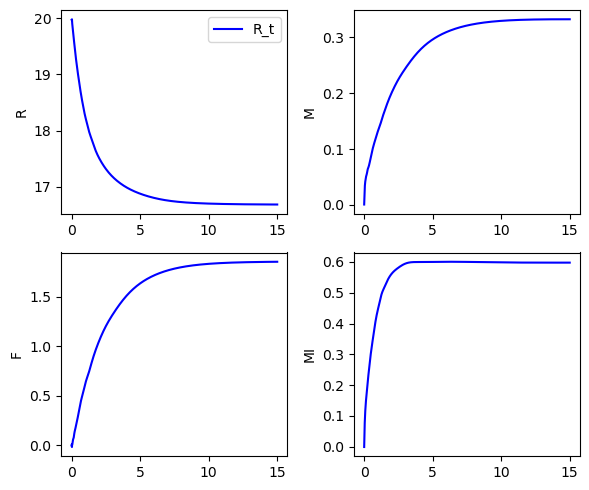

It 138000: loss = 8.32e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 -0.00]


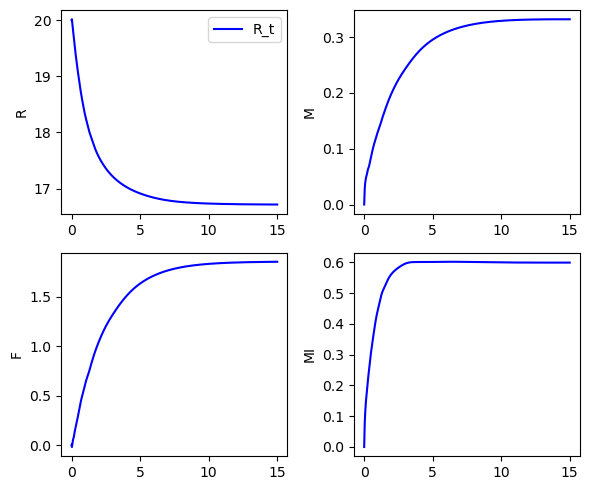

It 138500: loss = 8.47e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


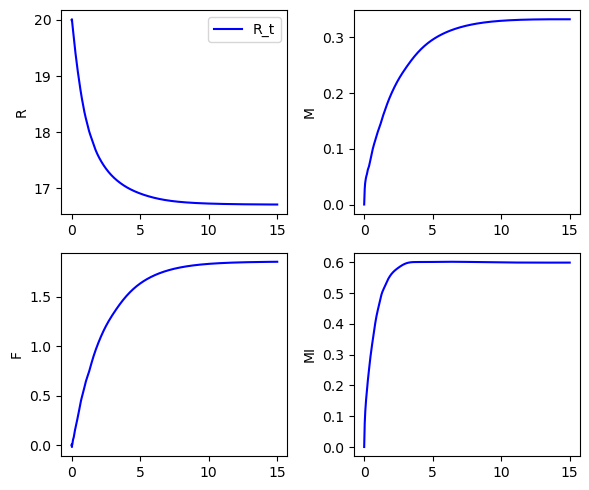

It 139000: loss = 8.96e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


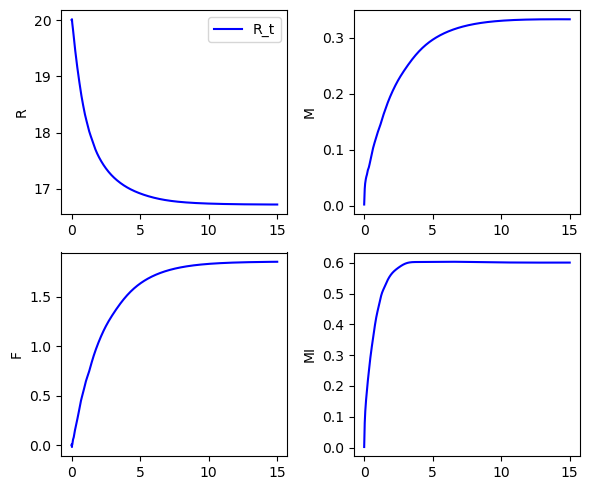

It 139500: loss = 8.30e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


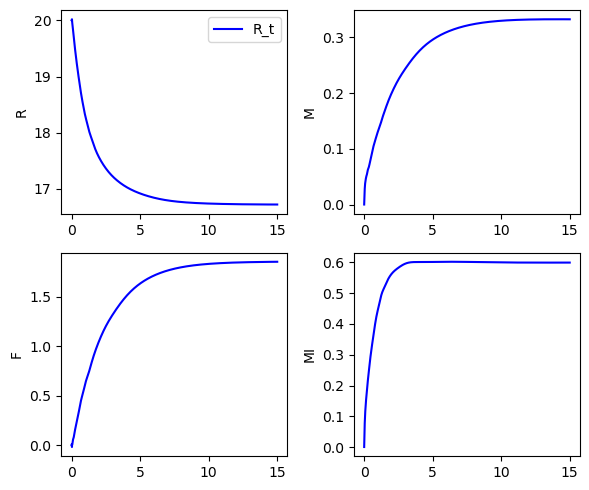

It 140000: loss = 8.45e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


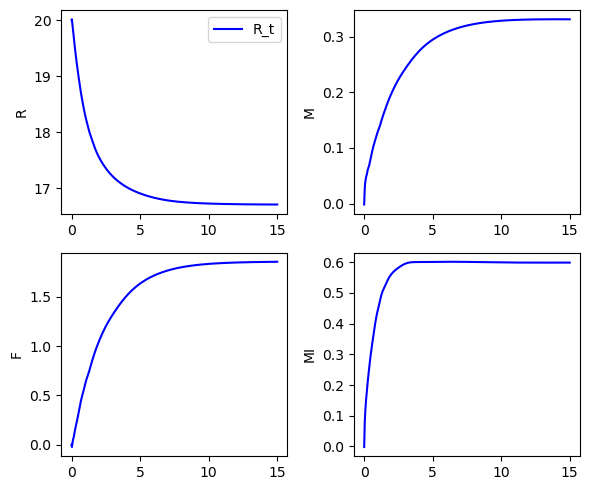

It 140500: loss = 8.29e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


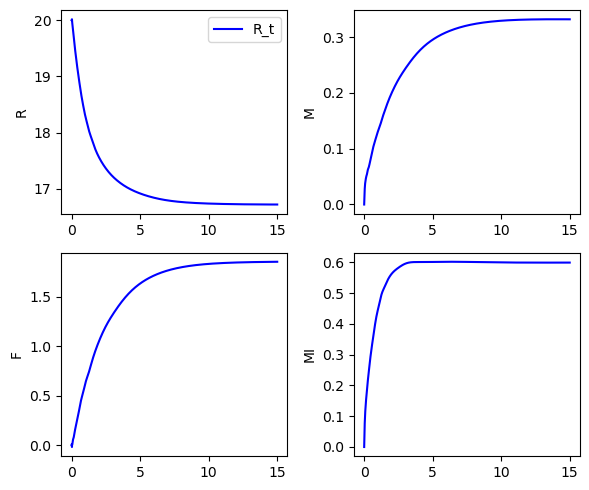

It 141000: loss = 2.49e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.02 0.01 0.01 0.01]


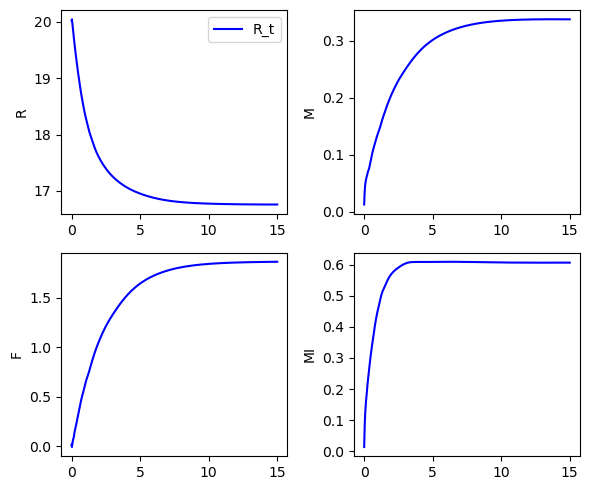

It 141500: loss = 8.31e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


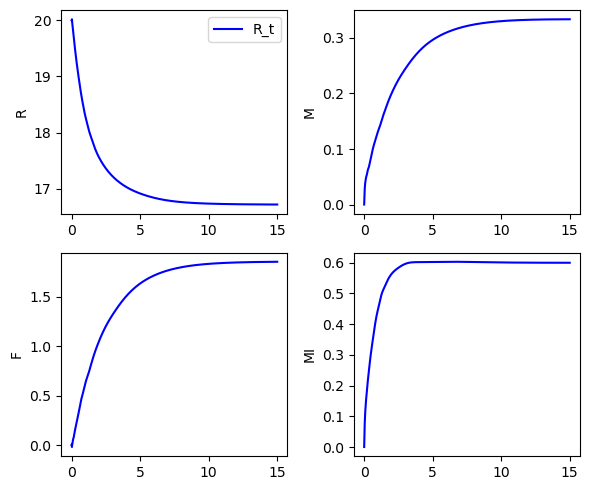

It 142000: loss = 1.33e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.01 0.01 0.01]


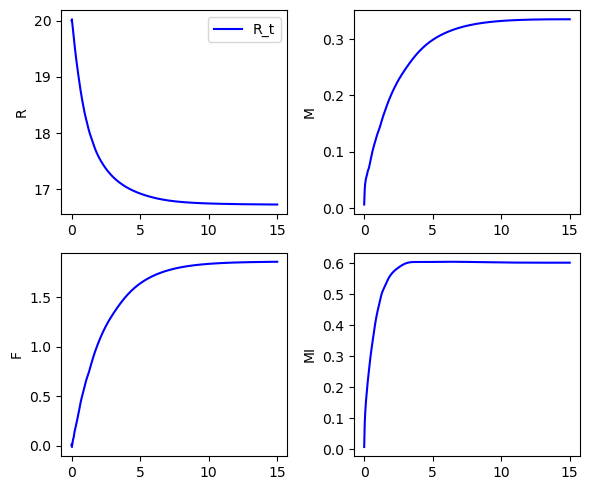

It 142500: loss = 8.29e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


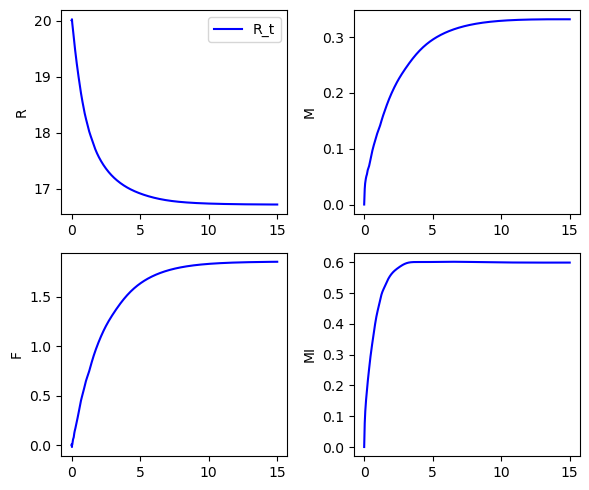

It 143000: loss = 8.29e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 -0.00]


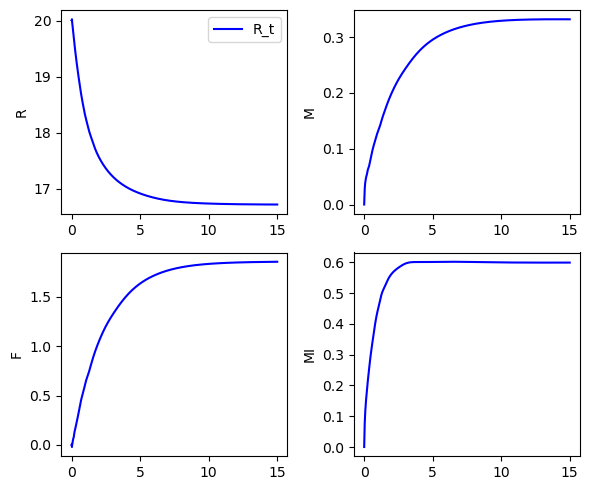

It 143500: loss = 9.86e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.00 -0.00 -0.00]


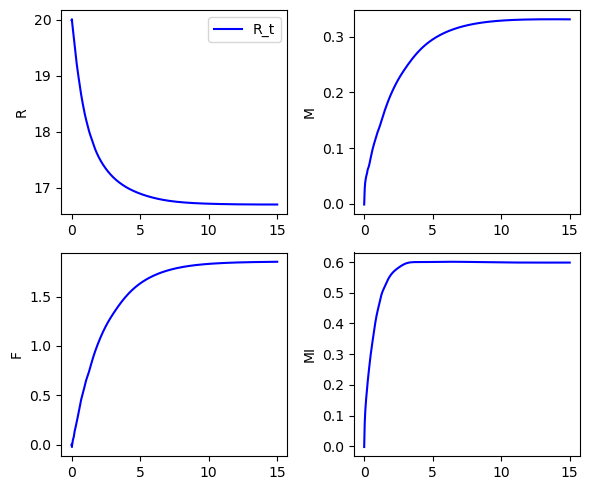

It 144000: loss = 8.29e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


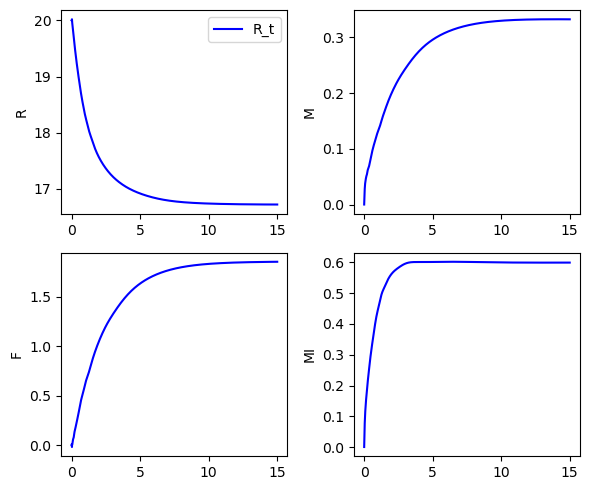

It 144500: loss = 8.35e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


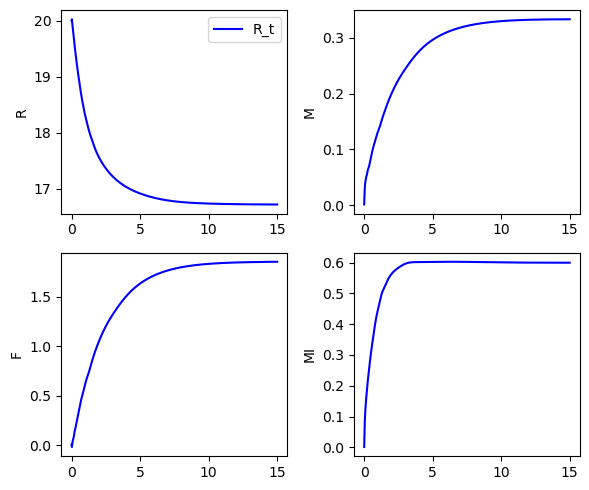

It 145000: loss = 8.80e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 0.00 -0.00 0.00]


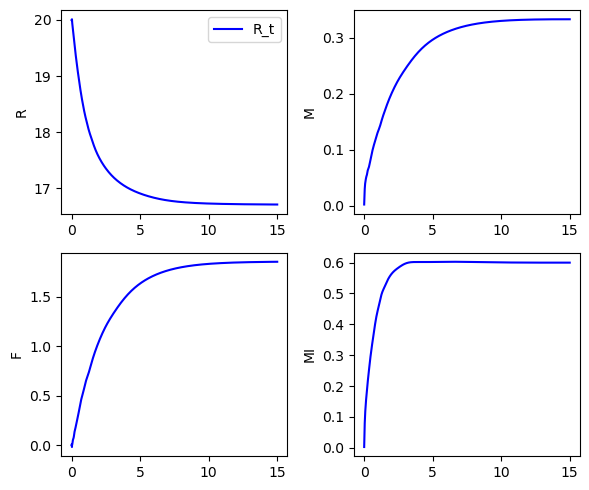

It 145500: loss = 8.32e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


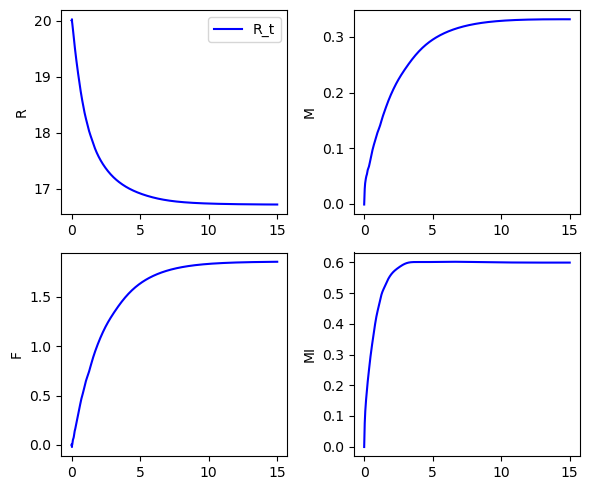

It 146000: loss = 2.01e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.02 0.01 0.01 0.01]


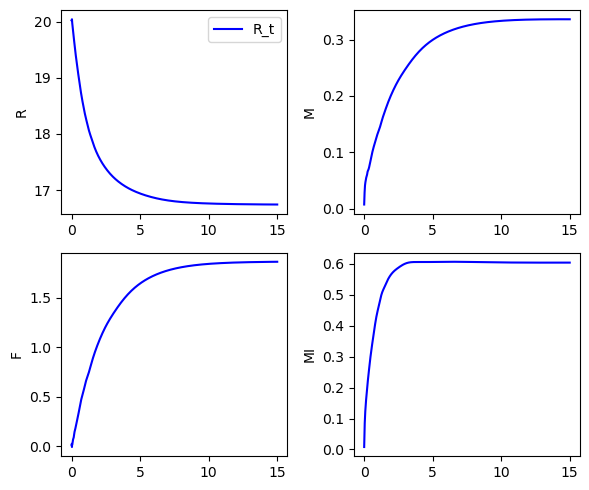

It 146500: loss = 9.12e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 -0.00 -0.00 -0.00]


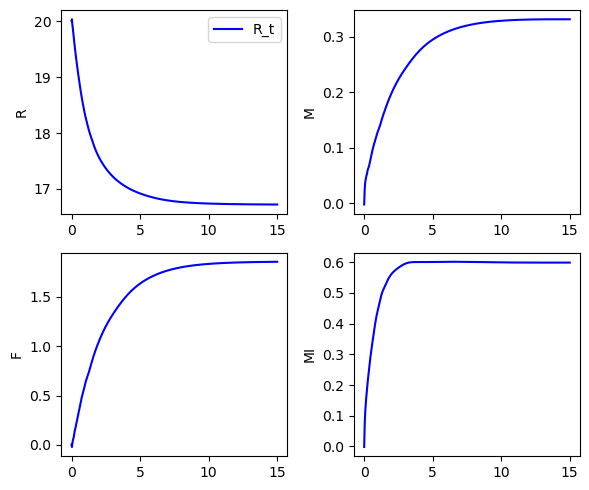

It 147000: loss = 1.49e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.01 -0.01 -0.01]


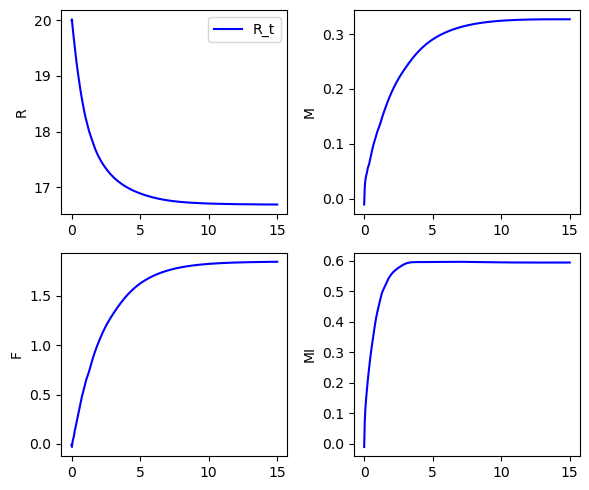

It 147500: loss = 8.28e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


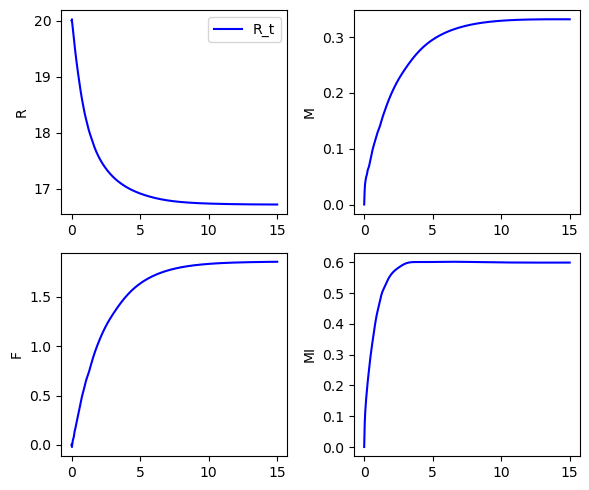

It 148000: loss = 8.33e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


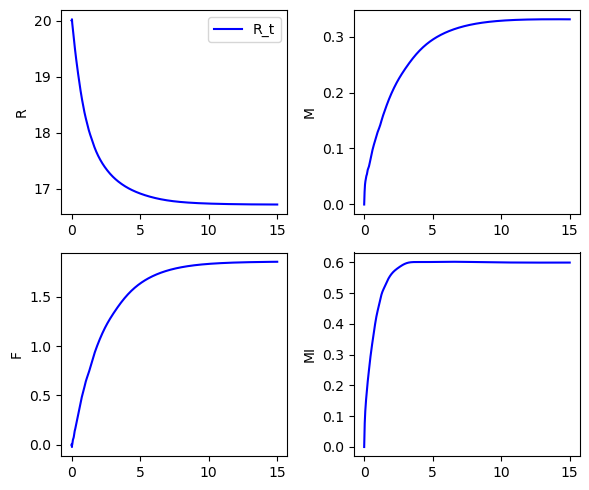

It 148500: loss = 8.33e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


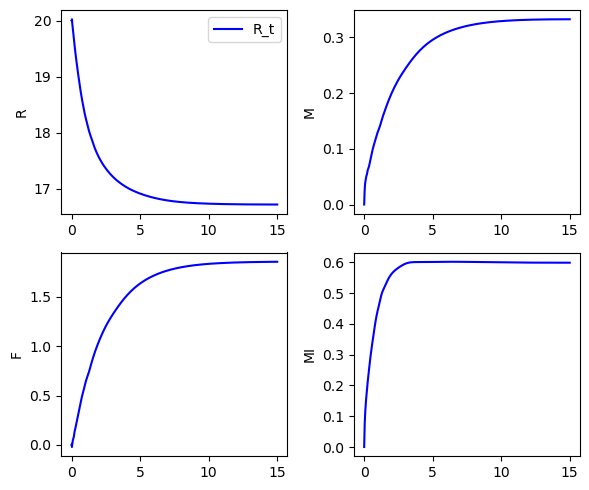

It 149000: loss = 8.96e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.00 -0.00 -0.00]


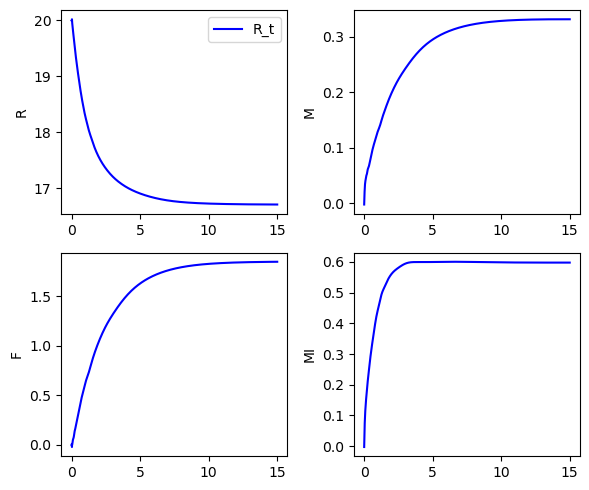

It 149500: loss = 1.18e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.01 -0.00 -0.01]


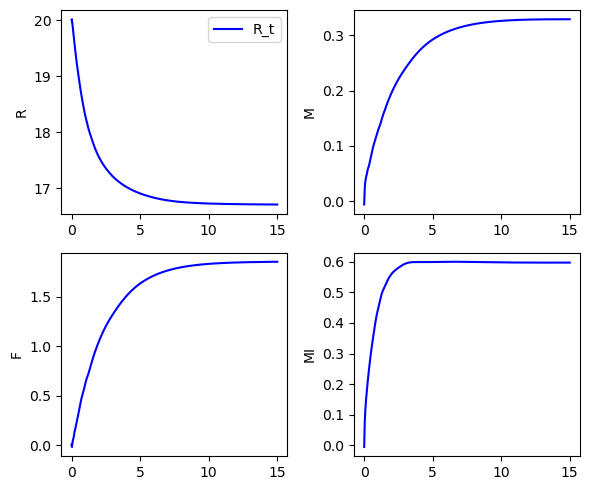

It 150000: loss = 1.01e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 -0.01 -0.00 -0.00]


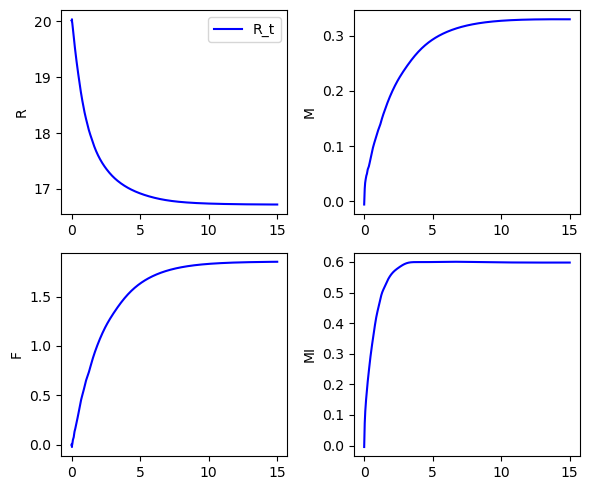

It 150500: loss = 8.28e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


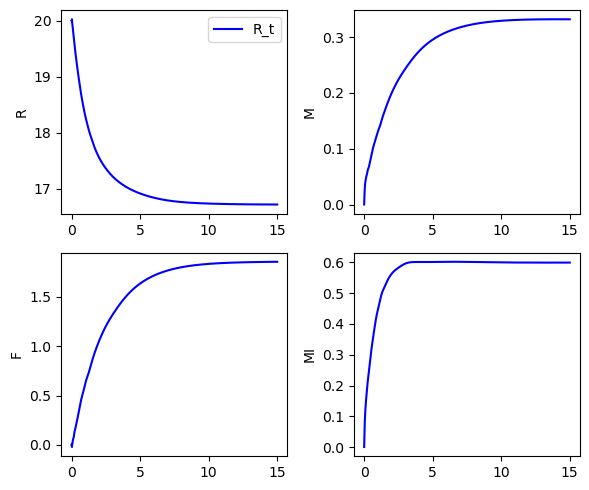

It 151000: loss = 8.34e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


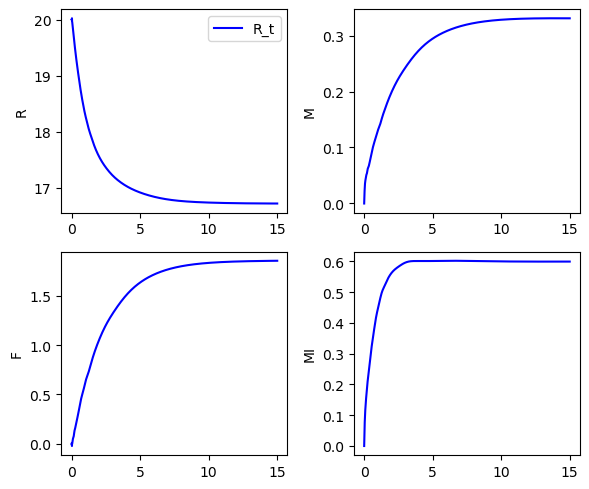

It 151500: loss = 9.55e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.01 0.00]


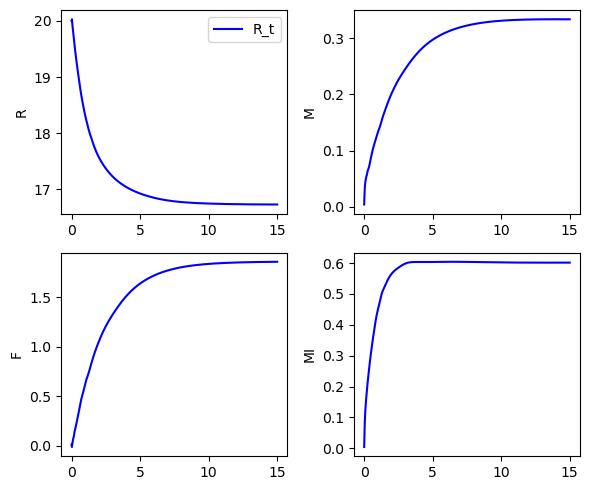

It 152000: loss = 8.32e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


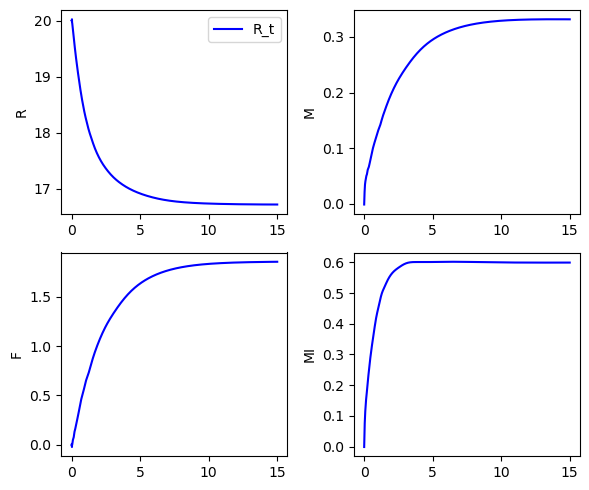

It 152500: loss = 9.99e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 0.00 0.00 0.00]


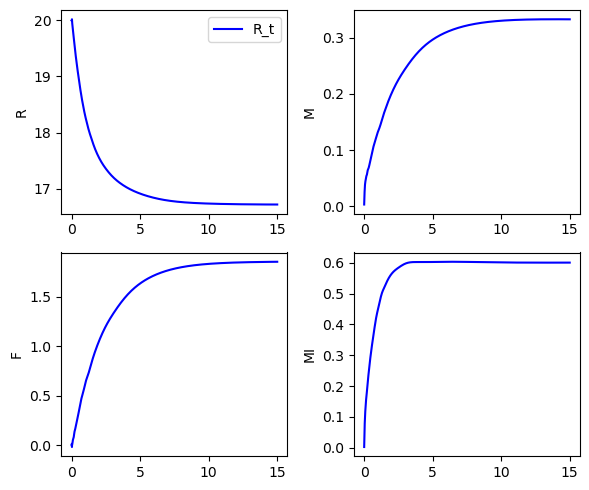

It 153000: loss = 8.66e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.00 0.00 0.00]


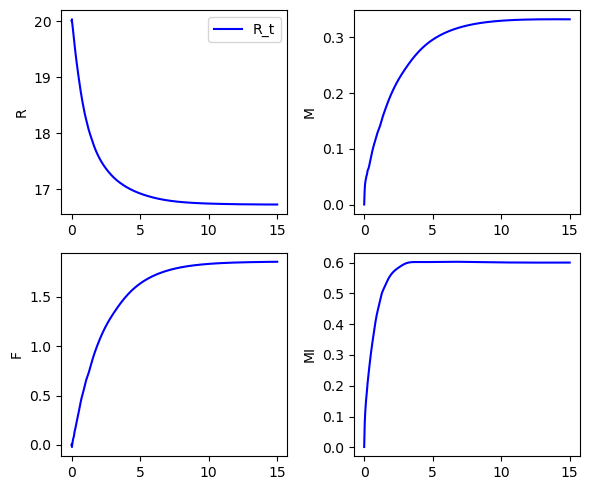

It 153500: loss = 1.87e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.03 -0.00 -0.00 0.00]


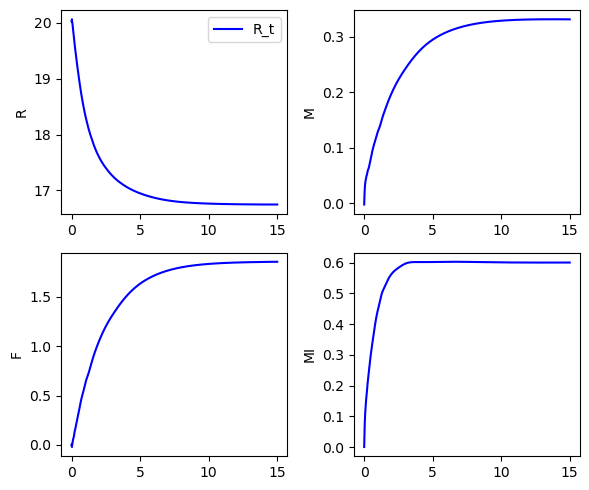

It 154000: loss = 8.36e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 0.00]


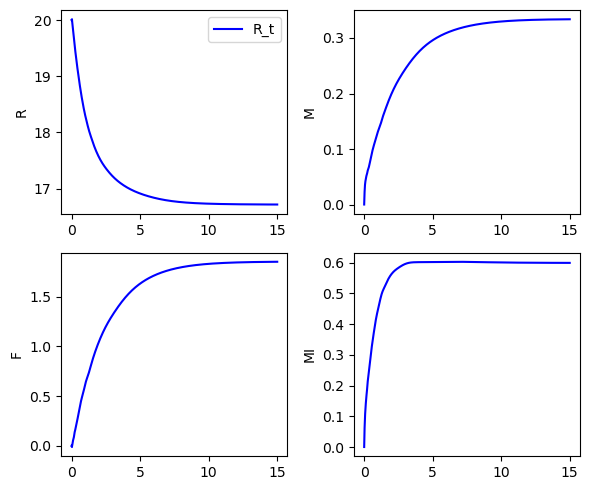

It 154500: loss = 9.41e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.01 0.00 0.01]


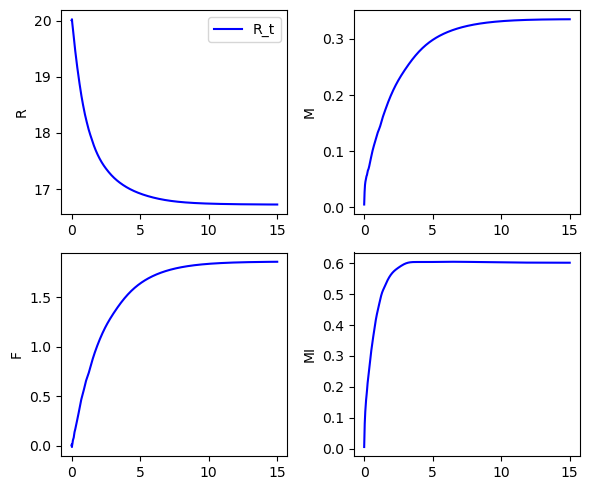

It 155000: loss = 8.28e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


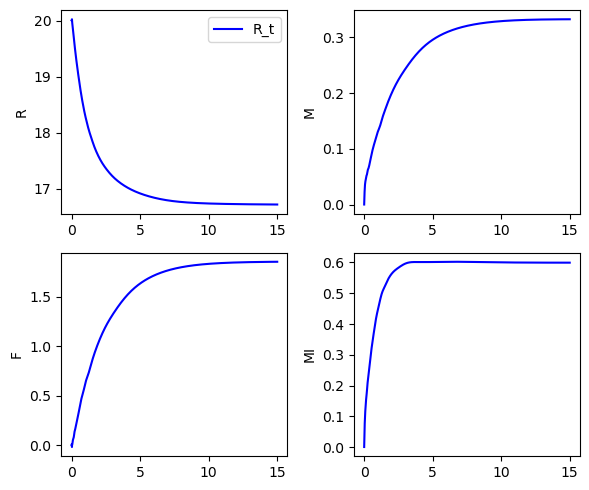

It 155500: loss = 1.64e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.01 -0.01 -0.01]


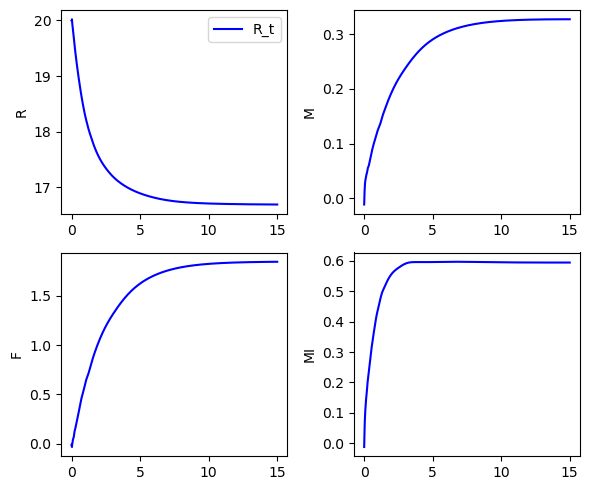

It 156000: loss = 1.11e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.00 0.00 0.00]


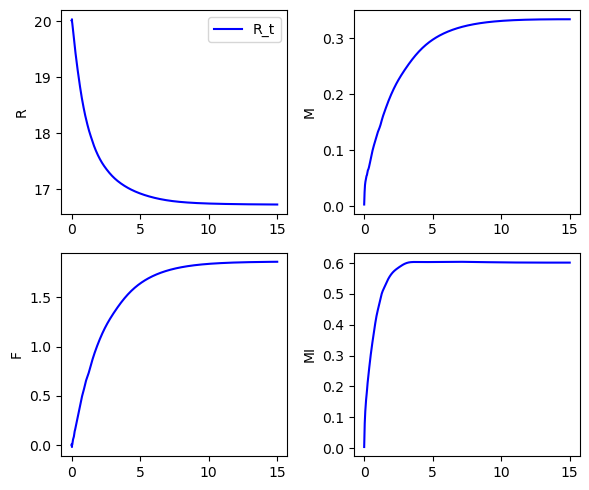

It 156500: loss = 8.28e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


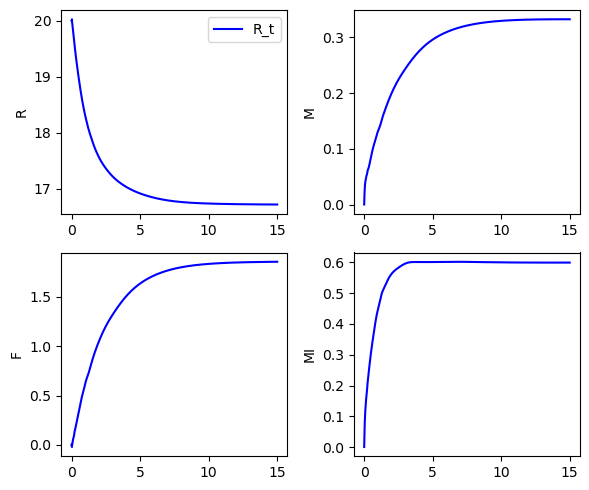

It 157000: loss = 8.29e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


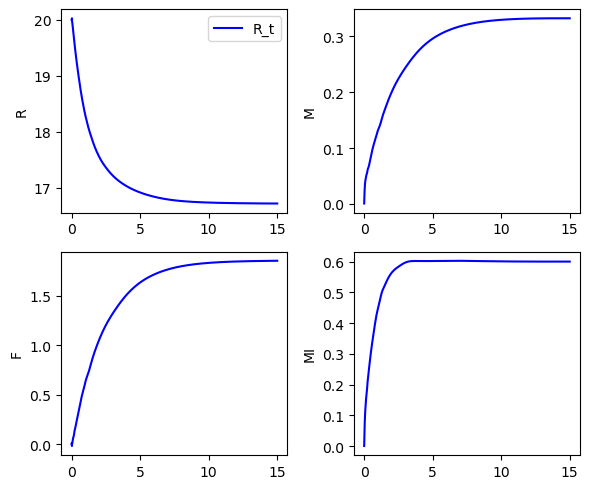

It 157500: loss = 8.84e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


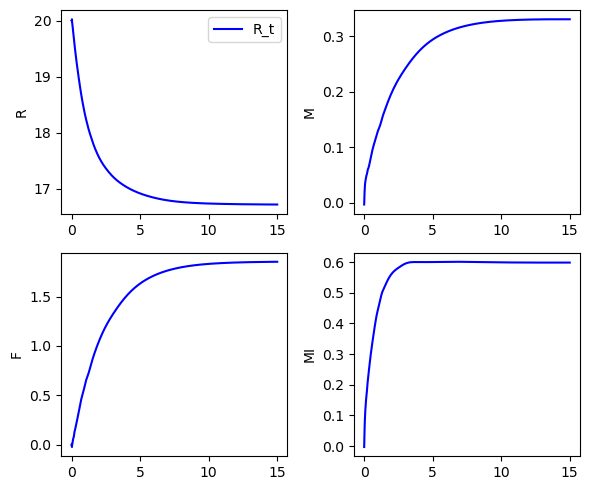

It 158000: loss = 1.15e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.01 0.01 0.01]


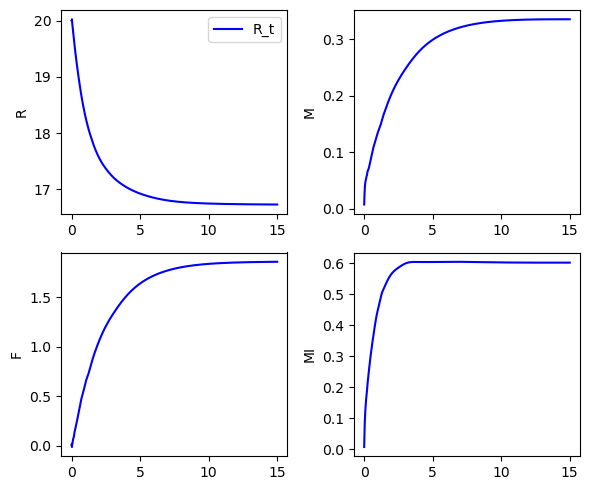

It 158500: loss = 8.32e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 0.00]


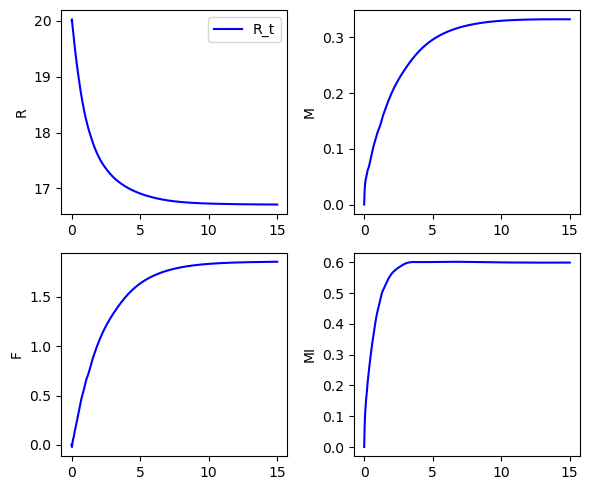

It 159000: loss = 1.11e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.01 0.01 0.01]


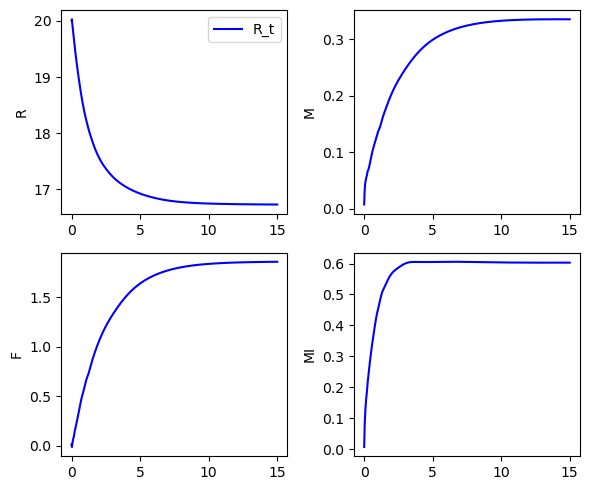

It 159500: loss = 8.71e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.00 -0.00 0.00]


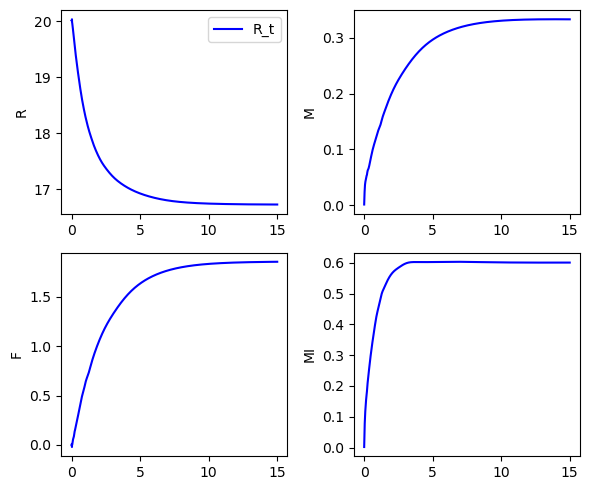

It 160000: loss = 1.38e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.98 0.01 0.00 0.00]


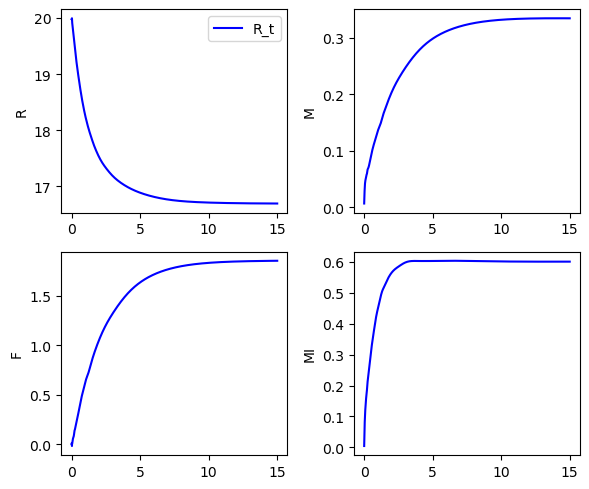

It 160500: loss = 1.43e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.01 0.01 0.01]


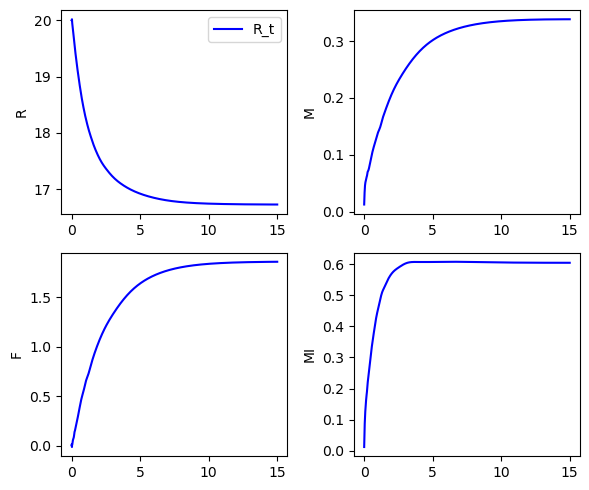

It 161000: loss = 8.85e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


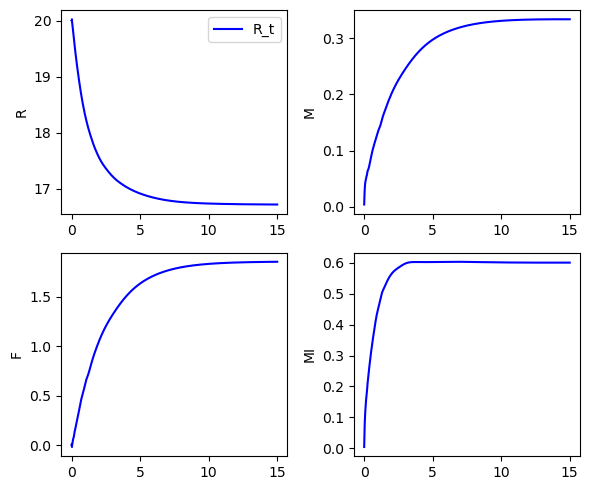

It 161500: loss = 8.48e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


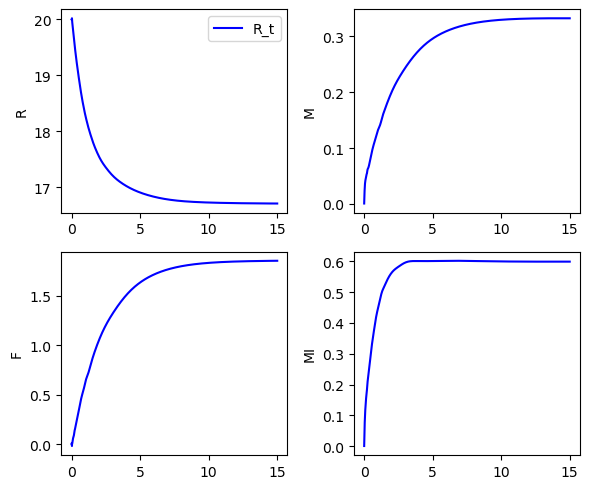

It 162000: loss = 8.31e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 0.00]


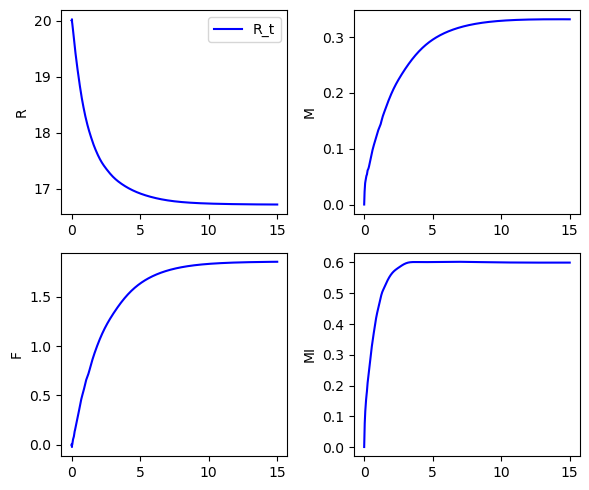

It 162500: loss = 8.59e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


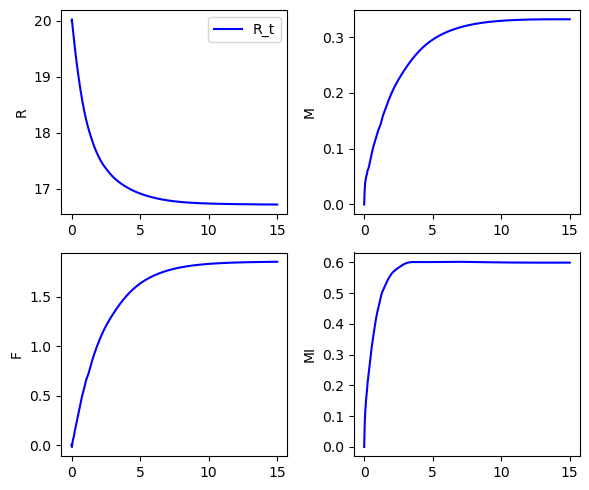

It 163000: loss = 1.52e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.00 -0.00 -0.00]


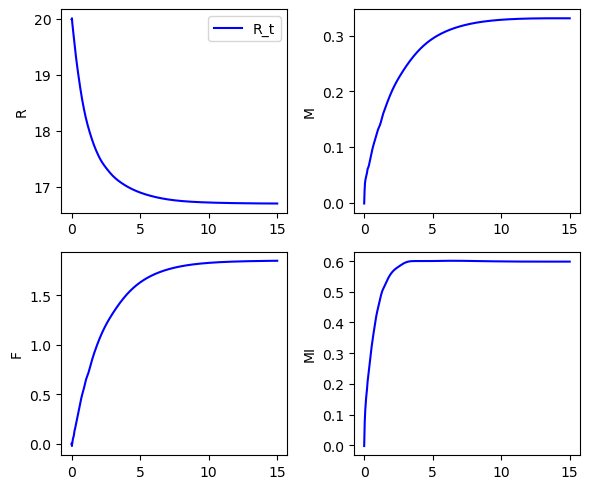

It 163500: loss = 8.82e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


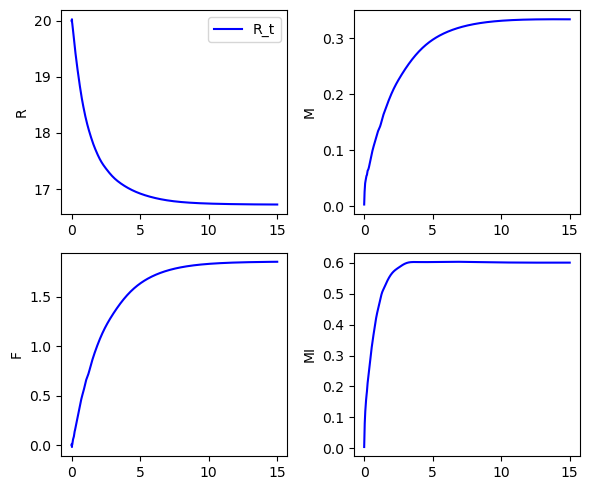

It 164000: loss = 8.30e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 0.00 -0.00]


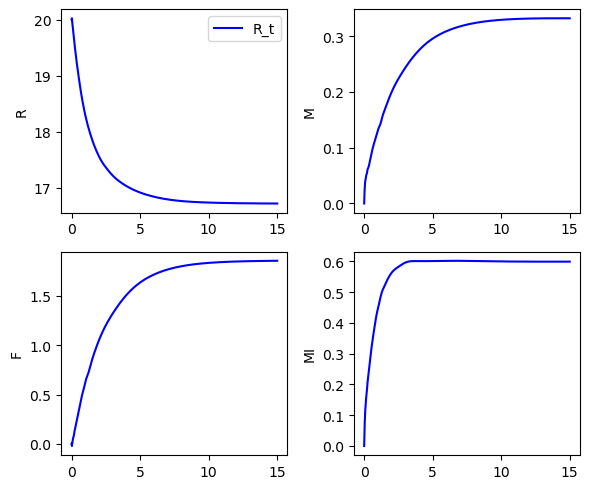

It 164500: loss = 8.28e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


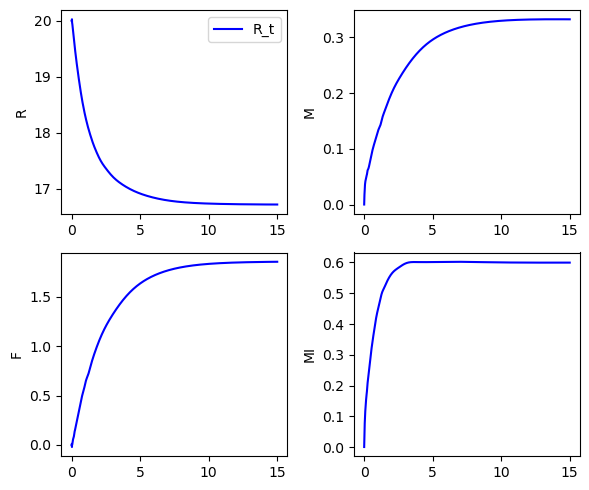

It 165000: loss = 9.89e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.01 0.01 0.01]


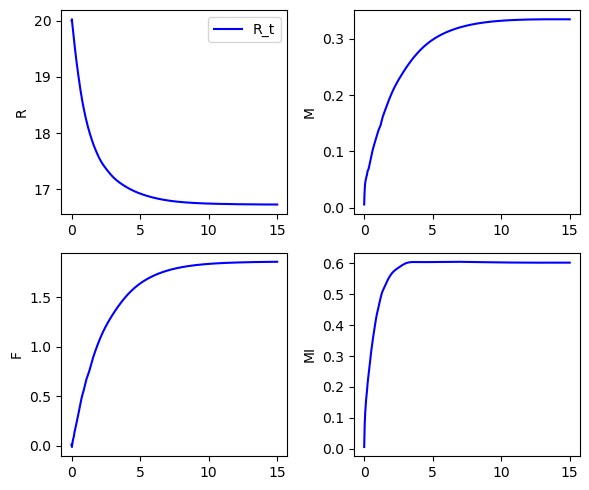

It 165500: loss = 1.55e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.01 0.01 0.01]


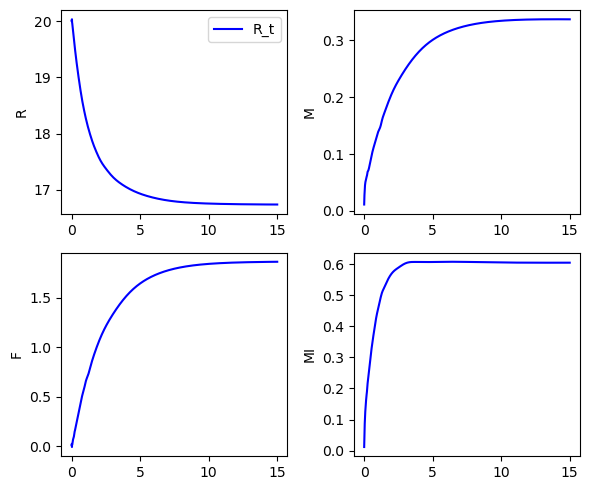

It 166000: loss = 8.27e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


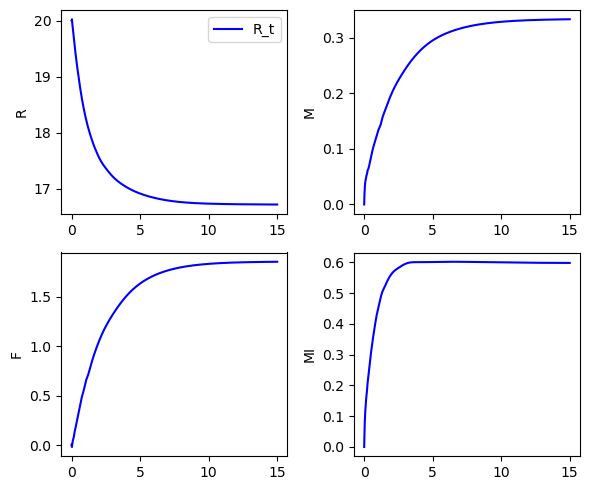

It 166500: loss = 8.61e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 0.00 0.00 0.00]


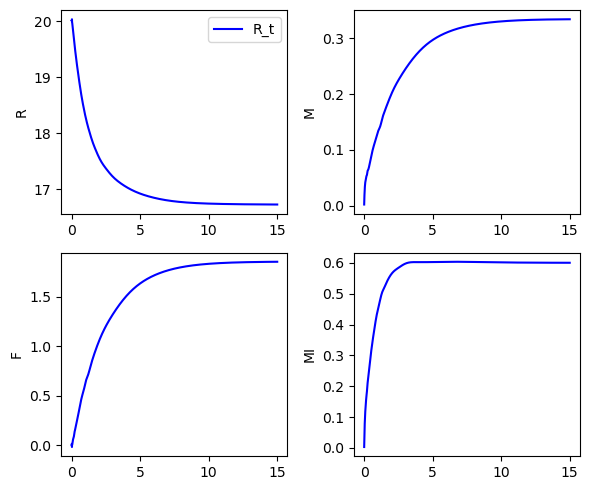

It 167000: loss = 8.66e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


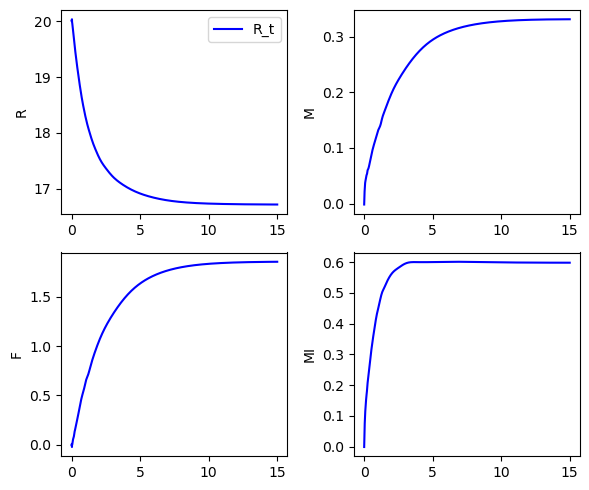

It 167500: loss = 8.98e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 -0.00 0.00 0.00]


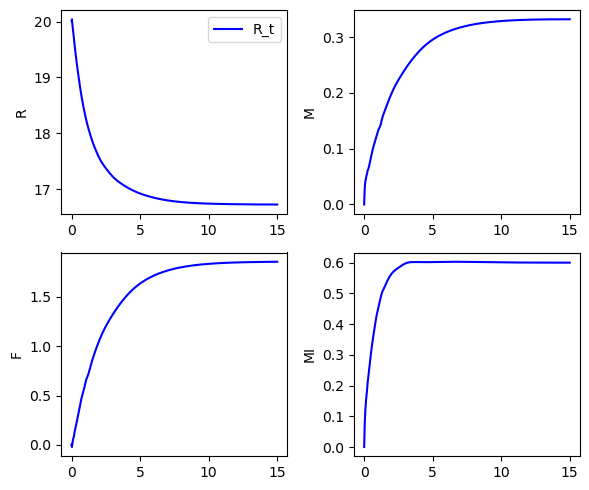

It 168000: loss = 9.98e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.00 -0.00 -0.00]


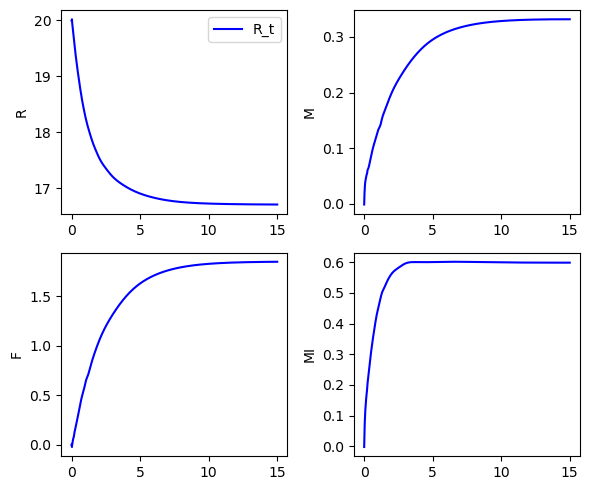

It 168500: loss = 1.90e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.98 -0.01 -0.01 -0.01]


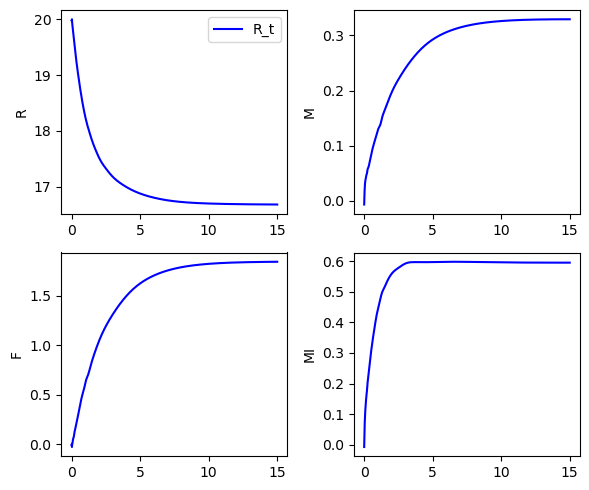

It 169000: loss = 8.50e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


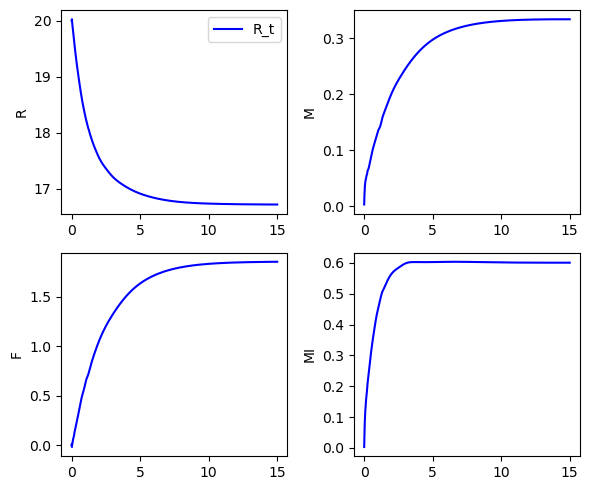

It 169500: loss = 1.18e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 0.00 -0.00 0.00]


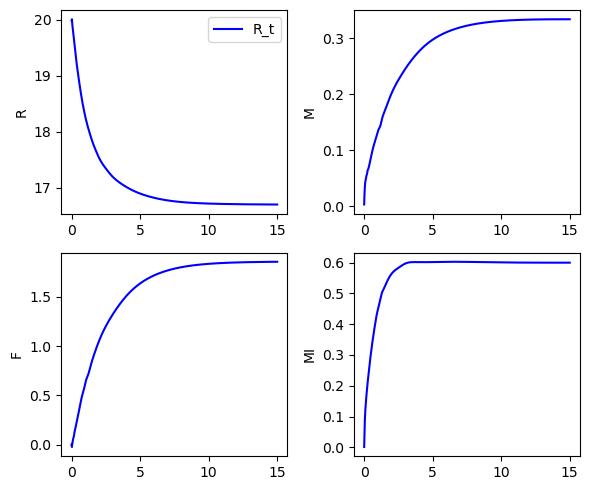

It 170000: loss = 8.27e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


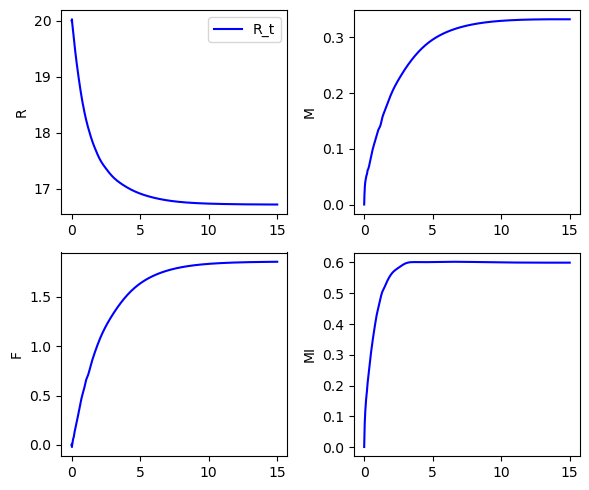

It 170500: loss = 1.16e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 -0.01 -0.01 -0.01]


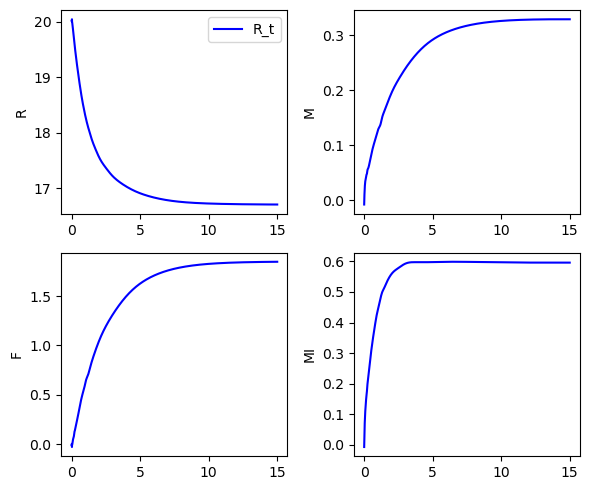

It 171000: loss = 8.35e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


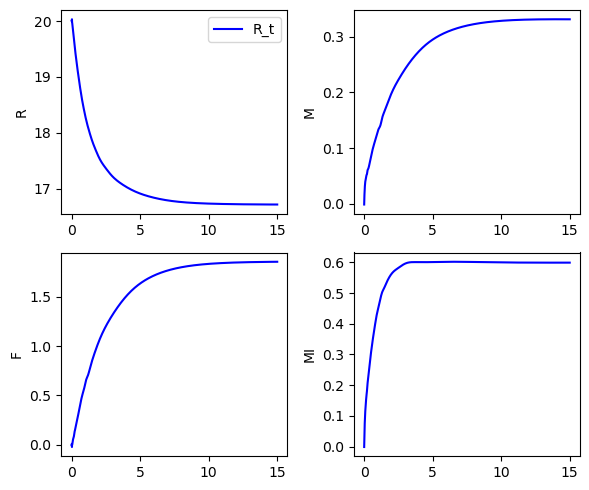

It 171500: loss = 8.31e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


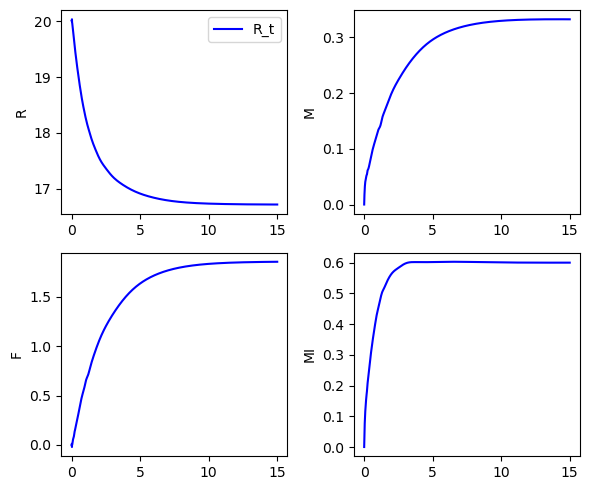

It 172000: loss = 1.02e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.99 -0.01 -0.00 -0.01]


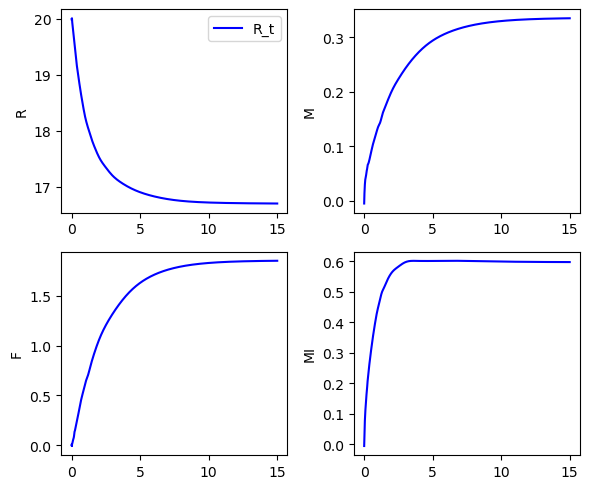

It 172500: loss = 8.26e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


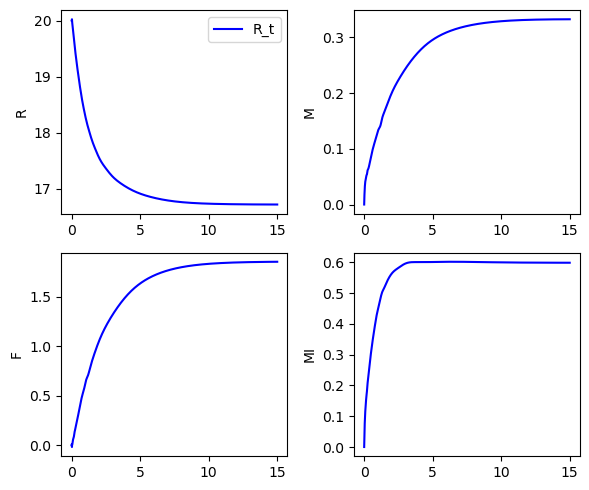

It 173000: loss = 8.26e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


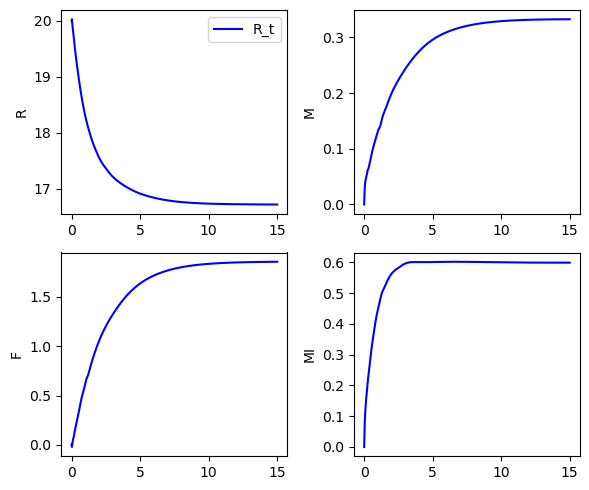

It 173500: loss = 1.55e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.98 -0.01 -0.01 -0.01]


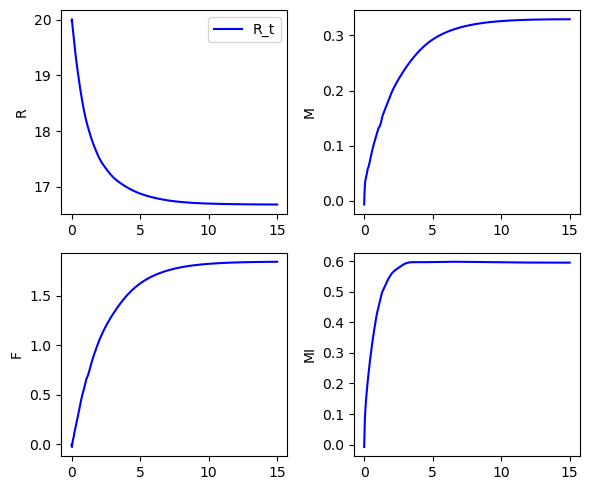

It 174000: loss = 1.67e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.03 -0.00 0.00 0.00]


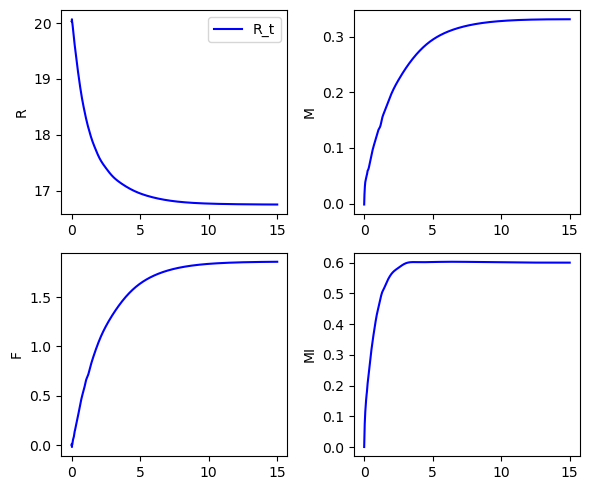

It 174500: loss = 8.27e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


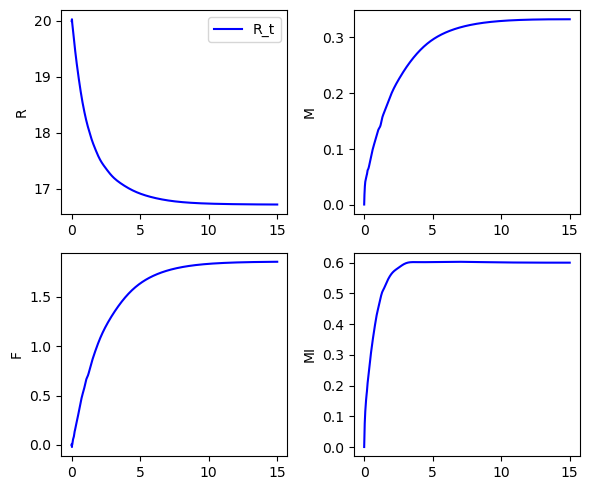

It 175000: loss = 8.25e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 0.00 0.00]


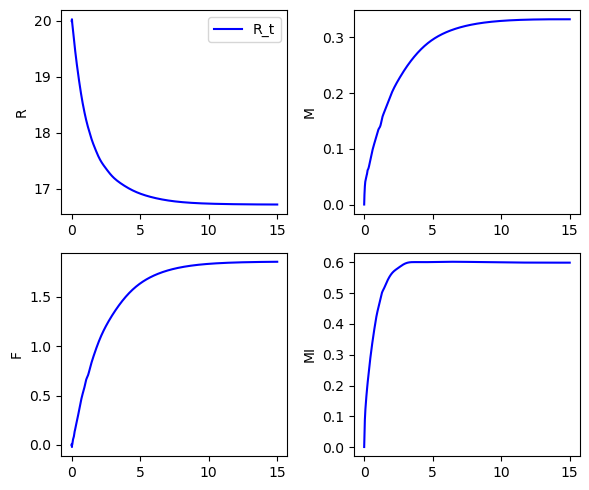

It 175500: loss = 9.01e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


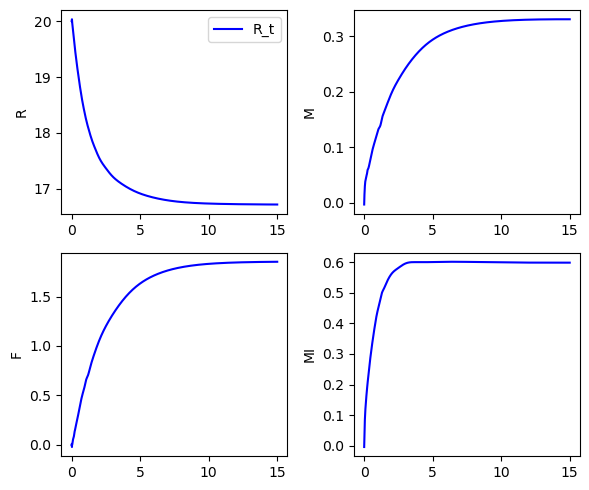

It 176000: loss = 8.53e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


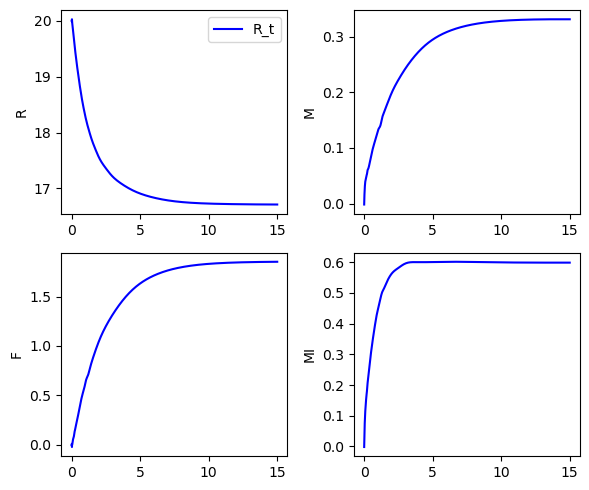

It 176500: loss = 8.26e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


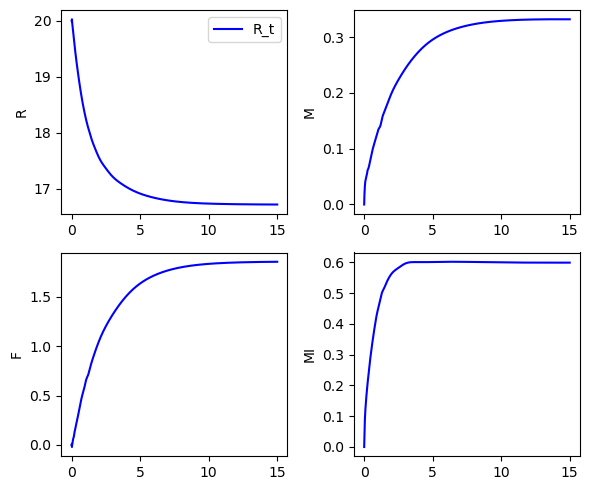

It 177000: loss = 1.76e-03, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [19.98 0.01 0.01 0.01]


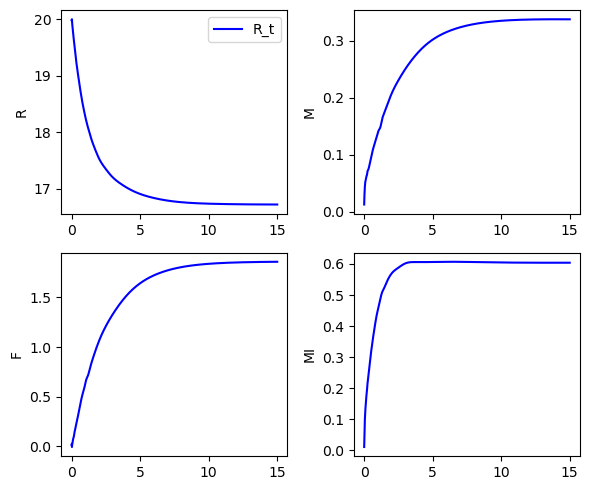

It 177500: loss = 8.27e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 0.00]


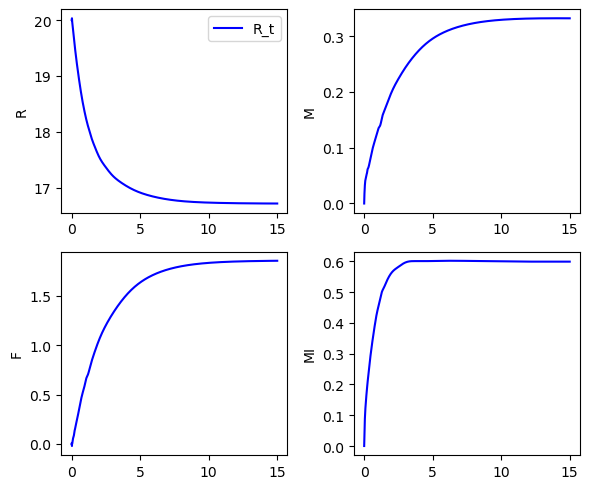

It 178000: loss = 8.79e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


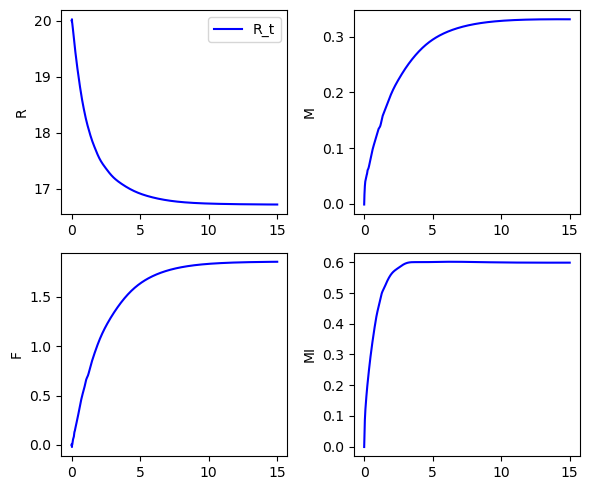

It 178500: loss = 8.25e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 0.00 -0.00 -0.00]


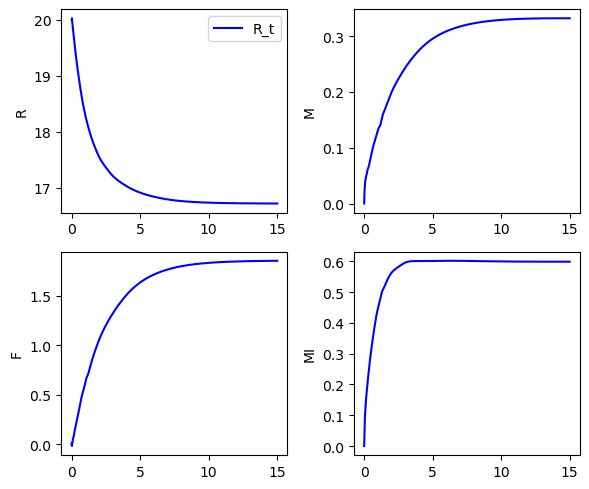

It 179000: loss = 8.50e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.00 -0.00 -0.00 -0.00]


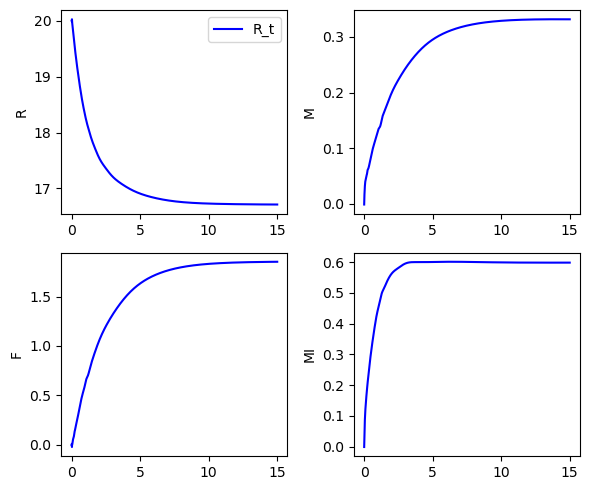

It 179500: loss = 9.47e-04, alpha21 = 3.0000, alpha22 = 5.0000
Initial Condition: [20.01 -0.00 0.00 -0.00]


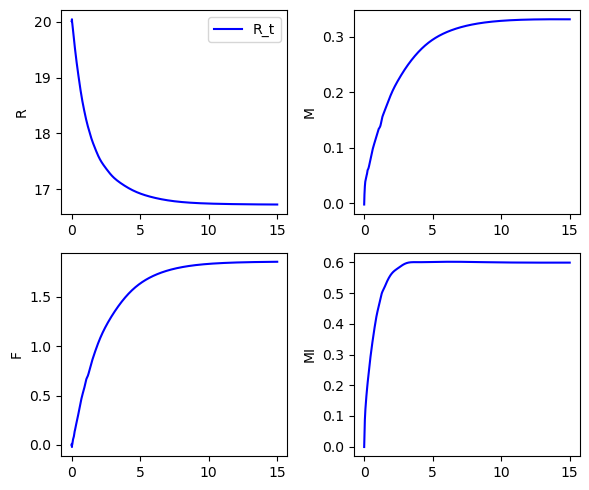

0.00211146 [3.0, 5.0] [[1.9983301e+01 1.7772734e-02 1.1193752e-02 1.6827226e-02]]

Computation time: 198.9843120177587 minutes


In [36]:
# Set random seeds for reproducibility
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)
random.seed(seed)

# Initialize and build the PINN model
model = PINNIdentificationNet()
model.build(input_shape=(None, 1))

# Initialize PINN solver
solver = PINNSolver_ID(model, T_data_train)

# Start timer
t0 = time()

# Define optimizer
optim = tf.keras.optimizers.Adam(learning_rate=0.01)

# Train the model using the PINN solver
final_loss_value, final_variables, final_IC, loss_history, lossp_history, \
lossd_history, lossic_history, alpha21_history, alpha22_history = solver.solve_with_TFoptimizer(
    optim, 
    T_data_train, 
    tf.stack([X_data_noisy_train[:, 2], X_data_noisy_train[:, 1] + X_data_noisy_train[:, 3]], axis=1), 
    N=180000
)

# Print results
print("Final Loss Value:", final_loss_value)
print("Final Parameters:", final_variables)
print("Final Initial Condition:", final_IC)
print('\nComputation time: {:.2f} minutes'.format((time() - t0) / 60))


## Save the output

In [39]:

t_PINNs,X_PINNs =  solver.get_solution(T_data)
R_PINNs = X_PINNs[:,0:1]
M_PINNs = X_PINNs[:,1:2]
F_PINNs = X_PINNs[:,2:3]
MI_PINNs = X_PINNs[:,3:4]


# Save all variables
filename = 'PINNs_knownparams_wp0.005_lr0.01_180k_F_M+MI.npz'
np.savez(
    filename,
    t_PINNs=t_PINNs,
    X_PINNs=X_PINNs,
    R_PINNs=R_PINNs,
    M_PINNs=M_PINNs,
    F_PINNs=F_PINNs,
    MI_PINNs=MI_PINNs,
    final_loss_value=final_loss_value,
    final_variables=final_variables,
    final_IC=final_IC,
    loss_history=loss_history,
    lossp_history=lossp_history,
    lossd_history=lossd_history,
    lossic_history=lossic_history,
    alpha21_history=alpha21_history,
    alpha22_history=alpha22_history
)

## Import the output

In [7]:
filename = 'PINNs_knownparams_wp0.0_lr0.01_180k_F_M+MI.npz'


# Load variables
loaded_data = np.load(filename)

# Access variables
t_PINNs = loaded_data['t_PINNs']
X_PINNs = loaded_data['X_PINNs']
R_PINNs = loaded_data['R_PINNs']
M_PINNs = loaded_data['M_PINNs']
F_PINNs = loaded_data['F_PINNs']
MI_PINNs = loaded_data['MI_PINNs']
final_loss_value = loaded_data['final_loss_value']
final_variables = loaded_data['final_variables']
final_IC = loaded_data['final_IC']
loss_history = loaded_data['loss_history']
lossp_history = loaded_data['lossp_history']
lossd_history = loaded_data['lossd_history']
lossic_history = loaded_data['lossic_history']
alpha21_history = loaded_data['alpha21_history']
alpha22_history = loaded_data['alpha22_history']



## Plot results

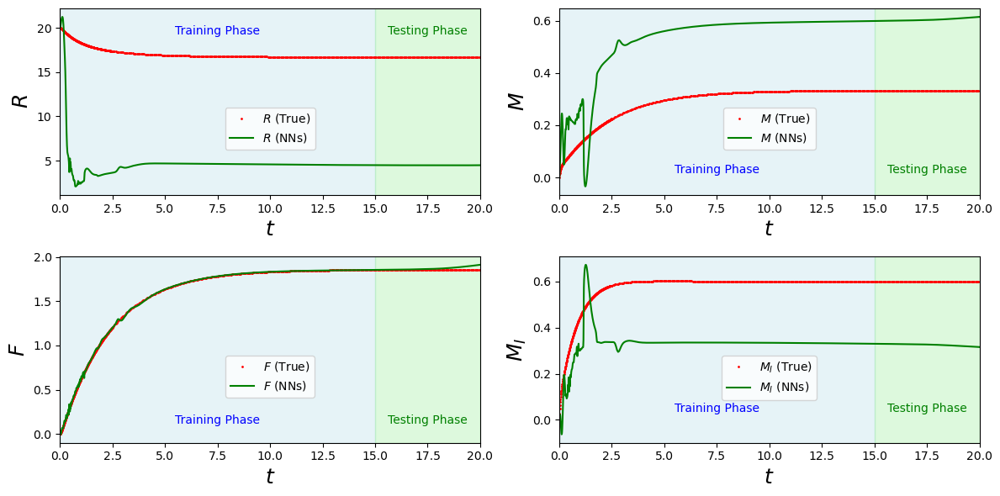

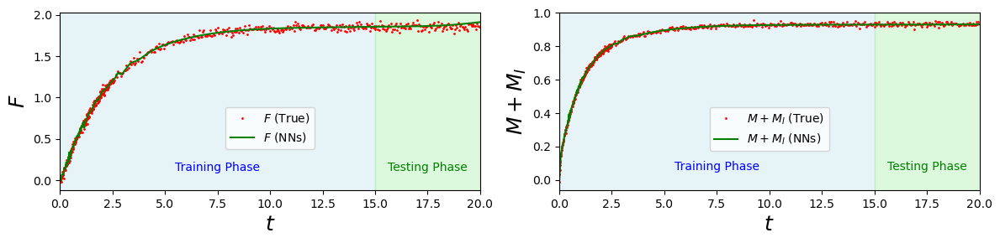

In [10]:
fig, axs = plt.subplots(2, 2, figsize=(12, 6))
axs = axs.flatten()

# Define the regions for shading
training_start, training_end = 0, 15  # Training phase: 0 to 15
testing_start, testing_end = 15, max(t_true)  # Testing phase: 15 to end

# PINNs_knownparams_wp0.5_lr0.01_180k_F_M+MI
text_positions = [
    [(7.5, 19.6), (17.5, 19.6)],  # Subplot 1: Training and Testing Phase positions
    [(7.5, 0.03), (17.5, 0.03)],  # Subplot 2
    [(7.5, 0.15), (17.5, 0.15)],  # Subplot 3
    [(7.5, 0.05), (17.5, 0.05)]  # Subplot 4
]

# PINNs_knownparams_wp0.0_lr0.01_180k_F_M+MI
# text_positions = [
#     [(7.5, 19), (17.5, 19)],  # Subplot 1: Training and Testing Phase positions
#     [(7.5, 0.05), (17.5, 0.05)],  # Subplot 2
#     [(7.5, 0.15), (17.5, 0.15)],  # Subplot 3
#     [(7.5, 0.0), (17.5, 0.0)]  # Subplot 4
# ]
# Define font properties for the legend
legend_font = {'family': 'serif',
               'weight': 'bold',
               'size': 12}
# Plot each curve in a separate subplot
for i, (ax, y_noisy, y_PINNs, ylabel) in enumerate(zip(
    axs,
    [R_true, M_true, F_true, MI_true],
    [R_PINNs, M_PINNs, F_PINNs, MI_PINNs],
    ['$R$', '$M$', '$F$', '$M_I$']
)):
    # Shade the training phase
    ax.axvspan(training_start, training_end, color='lightblue', alpha=0.3)
    training_x, training_y = text_positions[i][0]  # Manual training text coordinates
    ax.text(
        training_x, training_y,  # X and Y coordinates for "Training Phase"
        'Training Phase',
        color='blue', fontsize=10, ha='center', va='center'
    )
    
    # Shade the testing phase
    ax.axvspan(testing_start, testing_end, color='lightgreen', alpha=0.3)
    testing_x, testing_y = text_positions[i][1]  # Manual testing text coordinates
    ax.text(
        testing_x, testing_y,  # X and Y coordinates for "Testing Phase"
        'Testing Phase',
        color='green', fontsize=10, ha='center', va='center'
    )

    # Plot the noisy data and PINNs data
    ax.plot(t_true, y_noisy, label=f'{ylabel} (True)', color='r', linestyle='', marker='o', markersize=1)
    ax.plot(t_PINNs, y_PINNs, label=f'{ylabel} (NNs)', color='g')
    ax.set_ylabel(ylabel,fontsize=18)
    ax.set_xlabel('$t$ ',fontsize=18)
    ax.legend( bbox_to_anchor=(0.5, 0.5), loc='upper center')
    ax.set_xlim(0, 20)

# Adjust layout to remove white space
fig.tight_layout(rect=[0, 0, 1, 1])

# Show the plot
plt.show()

# # Save the plot as JPEG and PNG
fig.savefig('PINNs_knownparams_wp0.0_lr0.01_180k_F_M+MI.jpeg', format='jpeg', dpi=300)
fig.savefig('PINNs_knownparams_wp0.0_lr0.01_180k_F_M+MI.png', format='png', dpi=300)
# # Show the plot


fig, axs = plt.subplots(1, 2, figsize=(12, 3))
axs = axs.flatten()

# Define the regions for shading
training_start, training_end = 0, 15  # Training phase: 0 to 15
testing_start, testing_end = 15, max(t_true)  # Testing phase: 15 to end

# PINNs_knownparams_wp0.5_lr0.01_180k_F_M+MI
text_positions = [
    [(7.5, 0.15), (17.5, 0.15)],  # Subplot 1
    [(7.5, 0.08), (17.5, 0.08)],  # Subplot 2

]

# Define font properties for the legend
legend_font = {'family': 'serif',
               'weight': 'bold',
               'size': 12}
# Plot each curve in a separate subplot
for i, (ax, y_noisy, y_PINNs, ylabel) in enumerate(zip(
    axs,
    [F_noisy, M_noisy+MI_noisy],
    [F_PINNs, M_PINNs+MI_PINNs],
    ['$F$',  '$M+M_I$']
)):
    # Shade the training phase
    ax.axvspan(training_start, training_end, color='lightblue', alpha=0.3)
    training_x, training_y = text_positions[i][0]  # Manual training text coordinates
    ax.text(
        training_x, training_y,  # X and Y coordinates for "Training Phase"
        'Training Phase',
        color='blue', fontsize=10, ha='center', va='center'
    )
    
    # Shade the testing phase
    ax.axvspan(testing_start, testing_end, color='lightgreen', alpha=0.3)
    testing_x, testing_y = text_positions[i][1]  # Manual testing text coordinates
    ax.text(
        testing_x, testing_y,  # X and Y coordinates for "Testing Phase"
        'Testing Phase',
        color='green', fontsize=10, ha='center', va='center'
    )

    # Plot the noisy data and PINNs data
    ax.plot(t_true, y_noisy, label=f'{ylabel} (True)', color='r', linestyle='', marker='o', markersize=1)
    ax.plot(t_PINNs, y_PINNs, label=f'{ylabel} (NNs)', color='g')
    ax.set_ylabel(ylabel,fontsize=18)
    ax.set_xlabel('$t$ ',fontsize=18)
    ax.legend( bbox_to_anchor=(0.5, 0.5), loc='upper center')
    ax.set_xlim(0, 20)

# Adjust layout to remove white space
fig.tight_layout(rect=[0, 0, 1, 1])

# Show the plot
plt.show()

# # Save the plot as JPEG and PNG
fig.savefig('PINNs_knownparams_wp0.0_lr0.01_180k_F_M+MI2.jpeg', format='jpeg', dpi=300)
fig.savefig('PINNs_knownparams_wp0.0_lr0.01_180k_F_M+MI2.png', format='png', dpi=300)
# # Show the plot

